### Libraries and data loading

In [1]:
# import libraries
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
import os
import time
import datetime
import itertools
import h5py
import math
import matplotlib.dates as mdates
import numpy.ma as ma
import CRPS.CRPS as pscore

%matplotlib inline

In [2]:
# check tensorflow version
print("tensorflow version:", tf.__version__)
# check available gpu
gpus =  tf.config.list_physical_devices('GPU')
print("available gpus:", gpus)
# limit the gpu usage, prevent it from allocating all gpu memory for a simple model
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)
# check number of cpus available
print("available cpus:", os.cpu_count())

tensorflow version: 2.4.1
available gpus: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
available cpus: 128


In [129]:
# define the data location and load data
cwd = os.getcwd()
pardir = os.path.dirname(os.path.dirname(cwd))
data_folder = os.path.join(pardir,"data")
data_path = os.path.join(data_folder,'video_prediction_dataset.hdf5')

# !change model name for different models!
model_name = 'UNet_sky_image_PV_mapping'
output_folder = os.path.join(cwd,"model_output", model_name)
if os.path.isdir(output_folder)==False:
    os.makedirs(output_folder)
    
print("data_folder:", data_folder)
print("data_path:", data_path)
print("output_folder:", output_folder)

data_folder: /scratch/groups/abrandt/solar_forecasting/GAN_project_new/data/dataset_all
data_path: /scratch/groups/abrandt/solar_forecasting/GAN_project_new/data/dataset_all/video_prediction_dataset.hdf5
output_folder: /scratch/groups/abrandt/solar_forecasting/GAN_project_new/models/SkyImageGAN/model_output/UNet_Image_PV_mapping_masked_image


In [4]:
# generate handler for the hdf5 data
forecast_dataset = h5py.File(data_path, 'r')

# show structure of the hdf5 data
def get_all(name):
    if name!=None:
        print(forecast_dataset[name])
    
forecast_dataset.visit(get_all)

<HDF5 group "/test" (4 members)>
<HDF5 dataset "images_log": shape (4467, 16, 64, 64, 3), type "|u1">
<HDF5 dataset "images_pred": shape (4467, 15, 64, 64, 3), type "|u1">
<HDF5 dataset "pv_log": shape (4467, 16), type "<f4">
<HDF5 dataset "pv_pred": shape (4467, 15), type "<f4">
<HDF5 group "/trainval" (4 members)>
<HDF5 dataset "images_log": shape (53336, 16, 64, 64, 3), type "|u1">
<HDF5 dataset "images_pred": shape (53336, 15, 64, 64, 3), type "|u1">
<HDF5 dataset "pv_log": shape (53336, 16), type "<f4">
<HDF5 dataset "pv_pred": shape (53336, 15), type "<f4">


In [5]:
print('-'*50)
# get the input dimension for constructing the model
# the input images will be reshaped from (None, 8, 64, 64, 3) to (None, 64, 64, 24)
# the Stanford dataset contains 16 log terms, we only take 8 with 2-min interval
# to be consistent with the Cambridge dataset
img_side_len = forecast_dataset['trainval']['images_log'].shape[2]
num_color_channel = forecast_dataset['trainval']['images_log'].shape[4]
image_input_dim = [img_side_len,img_side_len,num_color_channel]

print("image side length:", img_side_len)
print("number of color channels:", num_color_channel)
print("input image dimension:", image_input_dim)

# load time stamps into the memory
times_trainval = np.load(os.path.join(data_folder,"times_curr_trainval.npy"),allow_pickle=True)
# !change samplpe fraction for different models! ########
fraction = 1 # get only 10% sample of the whole dataset
#########################################################

num_samples = int(len(times_trainval)*fraction)
times_trainval = times_trainval[:num_samples]
print("times_trainval.shape:", times_trainval.shape)

# read through the dataset once in order to cache it but not store it into the memory
## read the data by batch
num_samples = len(times_trainval)
batch_size = num_samples//5
indices = np.arange(num_samples)
print('-'*50)
print('data reading start...')
for i in range(int(num_samples / batch_size) + 1):
    start_time = time.time()
    start_idx = (i * batch_size) % num_samples
    idxs = indices[start_idx:start_idx + batch_size]
    _ = forecast_dataset['trainval']['images_log'][idxs]
    _ = forecast_dataset['trainval']['pv_log'][idxs]
    #_ = forecast_dataset['trainval']['pv_pred'][idxs]
    end_time = time.time()
    print("batch {0} samples: {1} to {2}, {3:.2f}% finished, processing time {4:.2f}s"
          .format(i+1, idxs[0],idxs[-1],(idxs[-1]/num_samples)*100,(end_time-start_time)))

# temporially close the dataset, will use "with" statement to open it when we use it
forecast_dataset.close()

--------------------------------------------------
image side length: 64
number of color channels: 3
input image dimension: [64, 64, 3]
times_trainval.shape: (53336,)
--------------------------------------------------
data reading start...
batch 1 samples: 0 to 10666, 20.00% finished, processing time 0.55s
batch 2 samples: 10667 to 21333, 40.00% finished, processing time 0.65s
batch 3 samples: 21334 to 32000, 60.00% finished, processing time 0.52s
batch 4 samples: 32001 to 42667, 80.00% finished, processing time 0.46s
batch 5 samples: 42668 to 53334, 100.00% finished, processing time 0.45s
batch 6 samples: 53335 to 53335, 100.00% finished, processing time 0.00s


### Input data pipeline helper functions

In [4]:
# day block shuffling of the time stamps, and return shuffled indices
def day_block_shuffle(times_trainval):
    
    # Only keep the date of each time point
    dates_trainval = np.zeros_like(times_trainval, dtype=datetime.date)
    for i in range(len(times_trainval)):
        dates_trainval[i] = times_trainval[i].date()

    # Chop the indices into blocks, so that each block contains the indices of the same day
    unique_dates = np.unique(dates_trainval)
    blocks = []
    for i in range(len(unique_dates)):
        blocks.append(np.where(dates_trainval == unique_dates[i])[0])

    # shuffle the blocks, and chain it back together
    np.random.seed(1)
    np.random.shuffle(blocks)
    shuffled_indices = np.asarray(list(itertools.chain.from_iterable(blocks)))

    return shuffled_indices

In [5]:
# a cross validation generator function for spliting the dayblock shuffled indices into training and validation
def cv_split(split_data, fold_index, num_fold):
    '''
    input:
    split_data: the dayblock shuffled indices to be splitted
    fold_index: the ith fold chosen as the validation, used for generating the seed for random shuffling
    num_fold: N-fold cross validation
    output:
    data_train: the train data indices
    data_val: the validation data indices
    '''
    # randomly divides into a training set and a validation set
    num_samples = len(split_data)
    indices = np.arange(num_samples)

    # finding training and validation indices
    val_mask = np.zeros(len(indices), dtype=bool)
    val_mask[int(fold_index / num_fold * num_samples):int((fold_index + 1) / num_fold * num_samples)] = True
    val_indices = indices[val_mask]
    train_indices = indices[np.logical_not(val_mask)]

    # shuffle indices
    np.random.seed(fold_index)
    np.random.shuffle(train_indices)
    np.random.shuffle(val_indices)
    
    data_train = split_data[train_indices]
    data_val = split_data[val_indices]

    return data_train,data_val

In [7]:
def mask_background(img): # put all background pixels (the ones outside the circle region of sky images) to 0s
    mask = np.ones((64,64,3), dtype=bool)
    for i in range(64):
        for j in range(64):
            if (i-30)**2+(j-30)**2>=31**2:
                mask[i,j,:]=0
    mask_img = img*mask
    return mask_img

In [7]:
# a mapping function from the indices to the corresponding features and labels 
def data_loader(hdf5_data_path,sample_idx,batch_size=256):
    '''
    input:
    hdf5_data_path: path to hdf5 data file
    sample_idx: 
        for training and validation:
            dayblock shuffled indices with cross-validation split into training and validation
            either training or validation indices will be input
        for testing: the indices are not shuffled
    is_trainval: a flag, True for trainig and validation
    output:
    dataset: dataset for training, validation
    '''

    def mapping_func_py(hdf5_data_path,sample_idx):
        '''
        mapping indices to corresponding images and pviance data in hdf5 (python expression)
        '''
        # convert EagerTensor to str or numpy array
        hdf5_data_path = hdf5_data_path.numpy().decode() 
        # sort the sample indices as hdf5 requires increasing order index for data retrieval
        sample_idx = sorted(sample_idx.numpy())

        with h5py.File(hdf5_data_path,'r') as f:

            # read in the data
            images_log = f['trainval']['images_log'][sample_idx][:,-1]
            pv_log = f['trainval']['pv_log'][sample_idx][:,-1]
            
            # normalize the image to [0,1]
            images_log = tf.image.convert_image_dtype(images_log, tf.float32)
            images_log = mask_background(images_log)
            
            # convert pv data to tf.tensor
            pv_log = tf.convert_to_tensor(pv_log, dtype=tf.float32)
            

            return images_log, pv_log

    def mapping_func_tf(hdf5_data_path,sample_idx):
        '''
        a wrapper mapping function to get the nested data structure 
        the output type of tf.py_function cannot be a nested sequence when using a tf.py_function with the tf.data API
        '''
        images_log, pv_log = tf.py_function(func=mapping_func_py,
                                                           inp=[hdf5_data_path, sample_idx], 
                                                           Tout=(tf.float32, tf.float32))
        return images_log, pv_log
    
    
    # create the indices dataset
    idx_ds = tf.data.Dataset.from_tensor_slices(sample_idx)
    # shuffle and batch the indices
    idx_ds = idx_ds.shuffle(buffer_size = idx_ds.cardinality().numpy(),seed=0)
    idx_ds = idx_ds.batch(batch_size).repeat().prefetch(tf.data.experimental.AUTOTUNE)
    
    # indices dataset mapping to images and pviance data
    # returning dataset with the following nested structure: (images_log, pv_log), pv_pred
    dataset = idx_ds.map(lambda x: mapping_func_tf(hdf5_data_path,x),
                         num_parallel_calls=tf.data.experimental.AUTOTUNE)
    
    return dataset

In [4]:
def compute_winkler_score(prob_prediction,observation):
    alpha = 0.1
    lb = np.percentile(prob_prediction,5,axis=0)
    ub = np.percentile(prob_prediction,95,axis=0)
    delta = ub-lb
    if observation<lb:
        sc = delta+2*(lb-observation)/alpha
    if observation>ub:
        sc = delta+2*(observation-ub)/alpha
    if (observation>=lb) and (observation<=ub):
        sc = delta
    return sc

### Model architecture

In [5]:
# define training time parameters
num_filters = 12
num_epochs = 200 #(The maximum epoches set to 200 and there might be early stopping depends on validation loss)
num_fold = 10 # 10-fold cross-validation
batch_size = 256

In [24]:
# define the generator architecture
def Image2PV():
    
    # x_context: input context image frames
    x_in = keras.Input(shape=image_input_dim)
    
    # building block function of the generator
    #def ContractingBlock(X, input_channel):
    def Conv3x3block(X, input_channel):
        '''
        input_channel: number of input channels, a scaler
        '''
        conv1 = keras.layers.Conv2D(
            filters=input_channel,
            kernel_size=(3,3),
            padding="same")(X)
        bn1 = keras.layers.BatchNormalization()(conv1)
        relu1 = keras.layers.ReLU()(bn1)
        
        return relu1
    
    # building block function of the generator
    def BottleNeckBlock(X, input_channel):
        '''
        input_channel: number of input channels, a scaler
        '''
        conv1 = keras.layers.Conv2D(
            filters=input_channel,
            kernel_size=(3,3),
            padding="same")(X)
        bn1 = keras.layers.BatchNormalization()(conv1)
        relu1 = keras.layers.ReLU()(bn1)

        conv2 = keras.layers.Conv2D(    
            filters=input_channel,
            kernel_size=(3, 3),
            padding="same")(relu1)
        bn2 = keras.layers.BatchNormalization()(conv2)

        output = X + bn2

        return output
    
    # building block function of the generator
    #def ExpandingBlock(X, input_channel, skip_connection):
    def Up2x2Conv3x3(X, input_channel):
        '''
        input_channel: number of input channels, a scaler
        '''
        upsampling = keras.layers.UpSampling2D(size=(2, 2))(X)

        conv1 = keras.layers.Conv2D(
            filters=input_channel,
            kernel_size=(3, 3),
            padding="same")(upsampling)
        return conv1
         
    ## conv1x1 block convert 64*64*3 image to 64*64*num_filters image
    output1 = keras.layers.Conv2D(
        filters=num_filters,
        kernel_size=(1,1),
        padding="same")(x_in)

    ## Conv3x3block operation
    ### input shape: (64,64,num_filters); output shape: (64,64,num_filters)
    #output2 = Conv3x3block(output1, num_filters)
    output3 = Conv3x3block(output1, num_filters) # output3 will be skipped connected

    ## max pooling layer
    ### input shape: (64,64,num_filters); output shape: (32,32,num_filters)
    output4 = keras.layers.MaxPooling2D(pool_size=[2, 2], strides=2)(output3) 
    
    ## 2*Conv3x3block operation
    ### input shape: (32,32,num_filters); output shape: (32,32,2*num_filters)
    #output5 = Conv3x3block(output4, 2*num_filters)
    output6 = Conv3x3block(output4, 2*num_filters) # output6 will be skipped connected
    
    ## max pooling layer
    ### input shape: (32,32,2*num_filters); output shape: (16,16,2*num_filters)
    output7 = keras.layers.MaxPooling2D(pool_size=[2, 2], strides=2)(output6)
    
    ## Conv3x3block operation
    ### input shape: (32,32,2*num_filters); output shape: (16,16,4*num_filters)
    output8 = Conv3x3block(output7, 4*num_filters)
    
    ## Bottleneck - Residual blocks
    ### input shape: (16,16,4*num_filters); output shape: (16,16,4*num_filters)
    #output8 = BottleNeckBlock(output7, 4*num_filters)
    output9 = BottleNeckBlock(output8, 4*num_filters)
    output10 = BottleNeckBlock(output9, 4*num_filters)

    ## Up2x2Conv3x3 block
    ### input shape: (16,16,4*num_filters); output shape: (32,32,2*num_filters)
    output11 = Up2x2Conv3x3(output10, 2*num_filters)
    
    ## Concatenation
    ### input shape: (32,32,2*num_filters); output shape: (32,32,4*num_filters)
    output12 = keras.layers.concatenate([output11, output6], axis=3)
    
    ## 2*Conv3x3block operation
    ### input shape: (32,32,4*num_filters); output shape: (32,32,2*num_filters)
    #output13 = Conv3x3block(output12, 2*num_filters)
    #output13 = keras.layers.Dropout(0.4)(output13)
    output14 = Conv3x3block(output12, 2*num_filters)
    output14 = keras.layers.Dropout(0.4)(output14)
    
    ## Up2x2Conv3x3 block
    ### input shape: (32,32,2*num_filters); output shape: (64,64,num_filters)
    output15 = Up2x2Conv3x3(output14,num_filters)
    
    ## Concatenation
    ### input shape: (64,64,num_filters); output shape: (64,64,2*num_filters)
    output16 = keras.layers.concatenate([output15, output3], axis=3)
    
    ## 2*Conv3x3block operation
    ### input shape: (64,64,2*num_filters); output shape: (64,64,num_filters)
    #output17 = Conv3x3block(output16, num_filters)
    #output17 = keras.layers.Dropout(0.4)(output17)
    output18 = Conv3x3block(output16, num_filters)
    output18 = keras.layers.Dropout(0.4)(output18)

    ## Conv1x1 block convert 64*64*12 image to 64*64*1 image
    ### y_out
    y = keras.layers.Conv2D(
        filters=1,
        kernel_size=(1,1),
        padding="same",
        activation='relu')(output18)
    
    y = keras.layers.Flatten()(y)
    y_out = keras.layers.Dense(units=1)(y)
    
    # construct the model
    model = keras.Model(inputs=x_in,outputs=y_out,name="Image2PV")
    return model
    
# show model architecture
keras.backend.clear_session()
model = Image2PV()
model.summary()

Model: "Image2PV"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 64, 64, 3)]  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 64, 64, 12)   48          input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 64, 64, 12)   1308        conv2d[0][0]                     
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 64, 64, 12)   48          conv2d_1[0][0]                   
___________________________________________________________________________________________

### Model training and validation

In [20]:
def plot_lr(history):
    learning_rate = history.history['lr']
    epochs = range(1, len(learning_rate) + 1)
    plt.plot(epochs, learning_rate)
    plt.title('Learning rate')
    plt.xlabel('Epochs')
    plt.ylabel('Learning rate')
    plt.show()

Repetition 1 model training started ...
Epoch 1/200

Epoch 00001: LearningRateScheduler reducing learning rate to 0.0002.
188/188 [==============================] - 73s 378ms/step - loss: 47.0494 - val_loss: 177.3489

Epoch 00001: val_loss improved from inf to 177.34889, saving model to /scratch/groups/abrandt/solar_forecasting/GAN_project_new/models/SkyImageGAN/model_output/UNet_Image_PV_mapping_masked_image/repetition_1/best_model_repitition_1.h5
Epoch 2/200

Epoch 00002: LearningRateScheduler reducing learning rate to 0.0002.
188/188 [==============================] - 71s 376ms/step - loss: 9.6083 - val_loss: 31.4560

Epoch 00002: val_loss improved from 177.34889 to 31.45599, saving model to /scratch/groups/abrandt/solar_forecasting/GAN_project_new/models/SkyImageGAN/model_output/UNet_Image_PV_mapping_masked_image/repetition_1/best_model_repitition_1.h5
Epoch 3/200

Epoch 00003: LearningRateScheduler reducing learning rate to 0.0002.
188/188 [==============================] - 71s 37

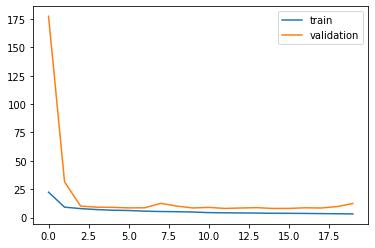

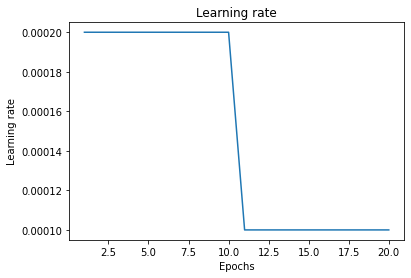

Repetition 2 model training started ...
Epoch 1/200

Epoch 00001: LearningRateScheduler reducing learning rate to 0.0002.
188/188 [==============================] - 74s 383ms/step - loss: 47.1528 - val_loss: 178.0834

Epoch 00001: val_loss improved from inf to 178.08339, saving model to /scratch/groups/abrandt/solar_forecasting/GAN_project_new/models/SkyImageGAN/model_output/UNet_Image_PV_mapping_masked_image/repetition_2/best_model_repitition_2.h5
Epoch 2/200

Epoch 00002: LearningRateScheduler reducing learning rate to 0.0002.
188/188 [==============================] - 71s 380ms/step - loss: 9.3960 - val_loss: 69.4490

Epoch 00002: val_loss improved from 178.08339 to 69.44901, saving model to /scratch/groups/abrandt/solar_forecasting/GAN_project_new/models/SkyImageGAN/model_output/UNet_Image_PV_mapping_masked_image/repetition_2/best_model_repitition_2.h5
Epoch 3/200

Epoch 00003: LearningRateScheduler reducing learning rate to 0.0002.
188/188 [==============================] - 73s 38

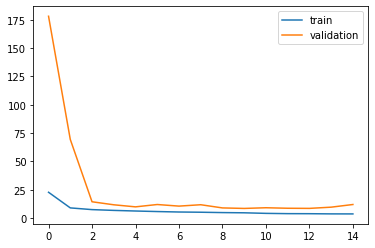

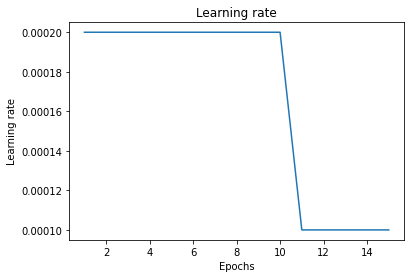

Repetition 3 model training started ...
Epoch 1/200

Epoch 00001: LearningRateScheduler reducing learning rate to 0.0002.
188/188 [==============================] - 73s 381ms/step - loss: 33.6517 - val_loss: 136.6341

Epoch 00001: val_loss improved from inf to 136.63409, saving model to /scratch/groups/abrandt/solar_forecasting/GAN_project_new/models/SkyImageGAN/model_output/UNet_Image_PV_mapping_masked_image/repetition_3/best_model_repitition_3.h5
Epoch 2/200

Epoch 00002: LearningRateScheduler reducing learning rate to 0.0002.
188/188 [==============================] - 71s 377ms/step - loss: 10.3135 - val_loss: 27.2269

Epoch 00002: val_loss improved from 136.63409 to 27.22692, saving model to /scratch/groups/abrandt/solar_forecasting/GAN_project_new/models/SkyImageGAN/model_output/UNet_Image_PV_mapping_masked_image/repetition_3/best_model_repitition_3.h5
Epoch 3/200

Epoch 00003: LearningRateScheduler reducing learning rate to 0.0002.
188/188 [==============================] - 71s 3

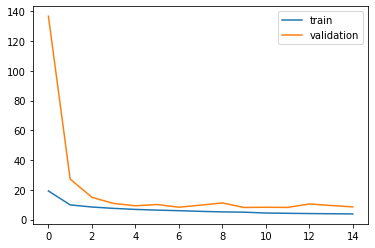

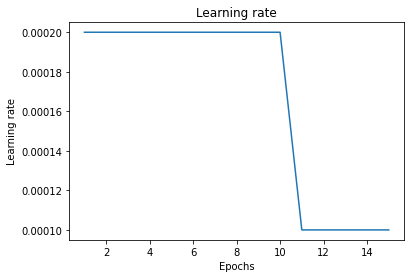

Repetition 4 model training started ...
Epoch 1/200

Epoch 00001: LearningRateScheduler reducing learning rate to 0.0002.
188/188 [==============================] - 73s 381ms/step - loss: 48.2113 - val_loss: 167.3439

Epoch 00001: val_loss improved from inf to 167.34389, saving model to /scratch/groups/abrandt/solar_forecasting/GAN_project_new/models/SkyImageGAN/model_output/UNet_Image_PV_mapping_masked_image/repetition_4/best_model_repitition_4.h5
Epoch 2/200

Epoch 00002: LearningRateScheduler reducing learning rate to 0.0002.
188/188 [==============================] - 120s 641ms/step - loss: 10.1577 - val_loss: 62.2070

Epoch 00002: val_loss improved from 167.34389 to 62.20695, saving model to /scratch/groups/abrandt/solar_forecasting/GAN_project_new/models/SkyImageGAN/model_output/UNet_Image_PV_mapping_masked_image/repetition_4/best_model_repitition_4.h5
Epoch 3/200

Epoch 00003: LearningRateScheduler reducing learning rate to 0.0002.
188/188 [==============================] - 124s

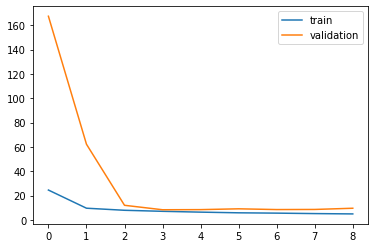

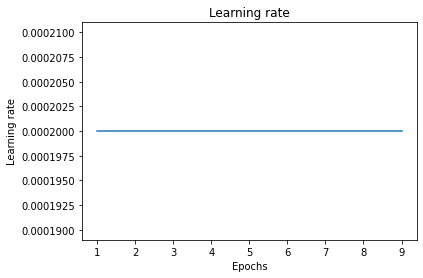

Repetition 5 model training started ...
Epoch 1/200

Epoch 00001: LearningRateScheduler reducing learning rate to 0.0002.
188/188 [==============================] - 73s 382ms/step - loss: 35.5633 - val_loss: 140.8160

Epoch 00001: val_loss improved from inf to 140.81601, saving model to /scratch/groups/abrandt/solar_forecasting/GAN_project_new/models/SkyImageGAN/model_output/UNet_Image_PV_mapping_masked_image/repetition_5/best_model_repitition_5.h5
Epoch 2/200

Epoch 00002: LearningRateScheduler reducing learning rate to 0.0002.
188/188 [==============================] - 83s 442ms/step - loss: 10.3305 - val_loss: 41.8325

Epoch 00002: val_loss improved from 140.81601 to 41.83249, saving model to /scratch/groups/abrandt/solar_forecasting/GAN_project_new/models/SkyImageGAN/model_output/UNet_Image_PV_mapping_masked_image/repetition_5/best_model_repitition_5.h5
Epoch 3/200

Epoch 00003: LearningRateScheduler reducing learning rate to 0.0002.
188/188 [==============================] - 227s 

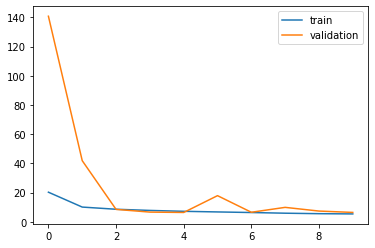

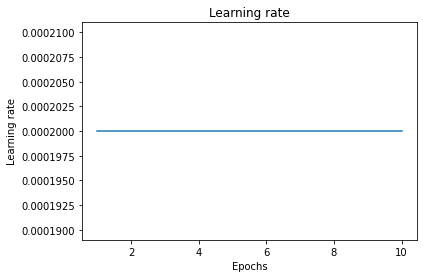

Repetition 6 model training started ...
Epoch 1/200

Epoch 00001: LearningRateScheduler reducing learning rate to 0.0002.
188/188 [==============================] - 73s 379ms/step - loss: 100.1093 - val_loss: 194.3391

Epoch 00001: val_loss improved from inf to 194.33913, saving model to /scratch/groups/abrandt/solar_forecasting/GAN_project_new/models/SkyImageGAN/model_output/UNet_Image_PV_mapping_masked_image/repetition_6/best_model_repitition_6.h5
Epoch 2/200

Epoch 00002: LearningRateScheduler reducing learning rate to 0.0002.
188/188 [==============================] - 71s 377ms/step - loss: 8.3321 - val_loss: 85.1596

Epoch 00002: val_loss improved from 194.33913 to 85.15956, saving model to /scratch/groups/abrandt/solar_forecasting/GAN_project_new/models/SkyImageGAN/model_output/UNet_Image_PV_mapping_masked_image/repetition_6/best_model_repitition_6.h5
Epoch 3/200

Epoch 00003: LearningRateScheduler reducing learning rate to 0.0002.
188/188 [==============================] - 79s 4

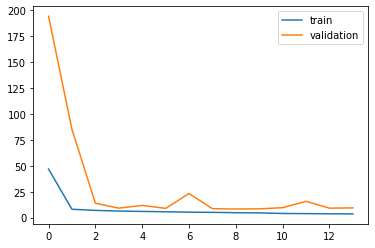

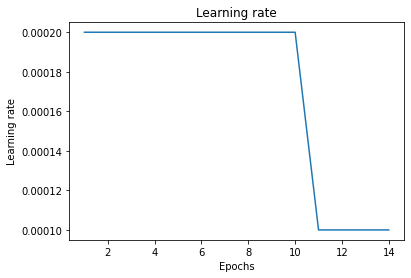

Repetition 7 model training started ...
Epoch 1/200

Epoch 00001: LearningRateScheduler reducing learning rate to 0.0002.
188/188 [==============================] - 73s 379ms/step - loss: 36.1765 - val_loss: 133.6020

Epoch 00001: val_loss improved from inf to 133.60197, saving model to /scratch/groups/abrandt/solar_forecasting/GAN_project_new/models/SkyImageGAN/model_output/UNet_Image_PV_mapping_masked_image/repetition_7/best_model_repitition_7.h5
Epoch 2/200

Epoch 00002: LearningRateScheduler reducing learning rate to 0.0002.
188/188 [==============================] - 71s 378ms/step - loss: 9.9167 - val_loss: 39.4090

Epoch 00002: val_loss improved from 133.60197 to 39.40901, saving model to /scratch/groups/abrandt/solar_forecasting/GAN_project_new/models/SkyImageGAN/model_output/UNet_Image_PV_mapping_masked_image/repetition_7/best_model_repitition_7.h5
Epoch 3/200

Epoch 00003: LearningRateScheduler reducing learning rate to 0.0002.
188/188 [==============================] - 71s 37

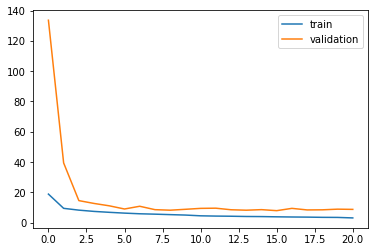

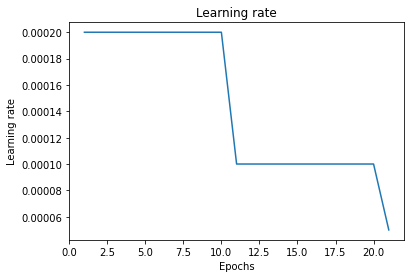

Repetition 8 model training started ...
Epoch 1/200

Epoch 00001: LearningRateScheduler reducing learning rate to 0.0002.
188/188 [==============================] - 73s 378ms/step - loss: 54.0665 - val_loss: 166.4680

Epoch 00001: val_loss improved from inf to 166.46802, saving model to /scratch/groups/abrandt/solar_forecasting/GAN_project_new/models/SkyImageGAN/model_output/UNet_Image_PV_mapping_masked_image/repetition_8/best_model_repitition_8.h5
Epoch 2/200

Epoch 00002: LearningRateScheduler reducing learning rate to 0.0002.
188/188 [==============================] - 85s 455ms/step - loss: 10.3705 - val_loss: 52.0670

Epoch 00002: val_loss improved from 166.46802 to 52.06697, saving model to /scratch/groups/abrandt/solar_forecasting/GAN_project_new/models/SkyImageGAN/model_output/UNet_Image_PV_mapping_masked_image/repetition_8/best_model_repitition_8.h5
Epoch 3/200

Epoch 00003: LearningRateScheduler reducing learning rate to 0.0002.
188/188 [==============================] - 228s 

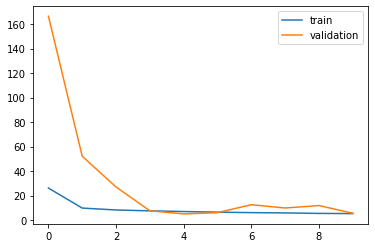

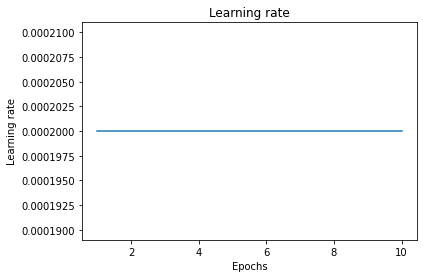

Repetition 9 model training started ...
Epoch 1/200

Epoch 00001: LearningRateScheduler reducing learning rate to 0.0002.
188/188 [==============================] - 79s 414ms/step - loss: 40.3414 - val_loss: 122.9169

Epoch 00001: val_loss improved from inf to 122.91692, saving model to /scratch/groups/abrandt/solar_forecasting/GAN_project_new/models/SkyImageGAN/model_output/UNet_Image_PV_mapping_masked_image/repetition_9/best_model_repitition_9.h5
Epoch 2/200

Epoch 00002: LearningRateScheduler reducing learning rate to 0.0002.
188/188 [==============================] - 121s 643ms/step - loss: 10.0862 - val_loss: 50.7819

Epoch 00002: val_loss improved from 122.91692 to 50.78188, saving model to /scratch/groups/abrandt/solar_forecasting/GAN_project_new/models/SkyImageGAN/model_output/UNet_Image_PV_mapping_masked_image/repetition_9/best_model_repitition_9.h5
Epoch 3/200

Epoch 00003: LearningRateScheduler reducing learning rate to 0.0002.
188/188 [==============================] - 71s 

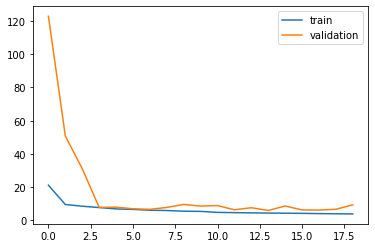

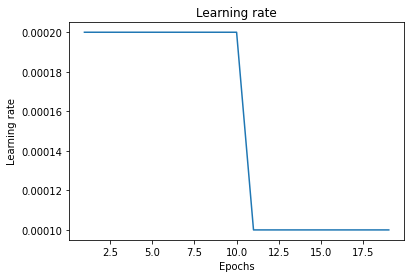

Repetition 10 model training started ...
Epoch 1/200

Epoch 00001: LearningRateScheduler reducing learning rate to 0.0002.
188/188 [==============================] - 79s 411ms/step - loss: 50.9311 - val_loss: 174.0619

Epoch 00001: val_loss improved from inf to 174.06189, saving model to /scratch/groups/abrandt/solar_forecasting/GAN_project_new/models/SkyImageGAN/model_output/UNet_Image_PV_mapping_masked_image/repetition_10/best_model_repitition_10.h5
Epoch 2/200

Epoch 00002: LearningRateScheduler reducing learning rate to 0.0002.
188/188 [==============================] - 109s 580ms/step - loss: 10.4994 - val_loss: 86.2655

Epoch 00002: val_loss improved from 174.06189 to 86.26552, saving model to /scratch/groups/abrandt/solar_forecasting/GAN_project_new/models/SkyImageGAN/model_output/UNet_Image_PV_mapping_masked_image/repetition_10/best_model_repitition_10.h5
Epoch 3/200

Epoch 00003: LearningRateScheduler reducing learning rate to 0.0002.
188/188 [==============================] -

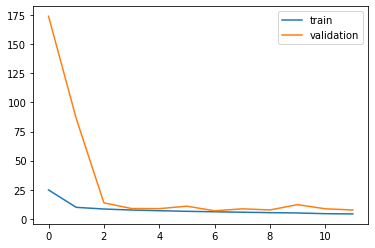

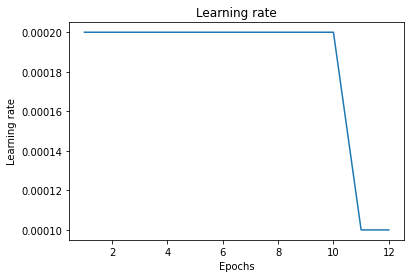

In [26]:
# generate dayblock shuffled indices
indices_dayblock_shuffled = day_block_shuffle(times_trainval)

# initialize loss history list
train_loss_hist = []
val_loss_hist = []
    
for i in range(num_fold):
    
    # construct and compile model for each repetition to reinitialize the model weights
    keras.backend.clear_session()
    model = Image2PV()
    initial_learning_rate = 2e-4
    model.compile(optimizer=keras.optimizers.Adam(initial_learning_rate),loss='mse')
    decay = initial_learning_rate / num_epochs
    def lr_time_based_decay(epoch, lr):
        drop_rate = 0.5
        epochs_drop = 10.0
        return initial_learning_rate * math.pow(drop_rate, math.floor(epoch/epochs_drop))
    # implementing 10-fold cross-validation
    print('Repetition {0} model training started ...'.format(i+1))
    
    # creating folder for saving model checkpoint
    save_directory = os.path.join(output_folder,'repetition_'+str(i+1))
    if not os.path.exists(save_directory):
        os.makedirs(save_directory)
        
    # training and validation data preparation
    ## generate indices dataset for training and validation
    indices_train, indices_val = cv_split(indices_dayblock_shuffled,i,num_fold)
    ## load data from dataloader
    ds_train_batched = data_loader(data_path,indices_train)
    ds_val_batched = data_loader(data_path,indices_val,batch_size=500)    
    
    # define callbacks for training
    ## early stopping rule: if the validation loss stop decreasing for 5 consecutive epoches
    earlystop = keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5)
    ## model check point: save model checkpoint for later use
    checkpoint = keras.callbacks.ModelCheckpoint(os.path.join(save_directory,'best_model_repitition_'+str(i+1)+'.h5'), 
                                monitor='val_loss', mode='min', save_best_only=True, verbose=1)
    lr_schedule = keras.callbacks.LearningRateScheduler(lr_time_based_decay, verbose=1)
    
    # training the model and record training and validation loss
    history = model.fit(ds_train_batched, epochs=num_epochs, steps_per_epoch=len(indices_train)//batch_size+1,
                               verbose=1, callbacks=[earlystop,checkpoint,lr_schedule], validation_data=ds_val_batched,
                              validation_steps=len(indices_val)//batch_size+1)
    train_loss_hist.append(history.history['loss'])
    val_loss_hist.append(history.history['val_loss'])
    
    # saving model training and validation loss history
    np.save(os.path.join(output_folder,'train_loss_hist.npy'),train_loss_hist)
    np.save(os.path.join(output_folder,'val_loss_hist.npy'),val_loss_hist)

    # plot training and validation history
    plt.plot(train_loss_hist[i],label='train')
    plt.plot(val_loss_hist[i],label='validation')
    plt.legend()
    plt.show()
    
    plot_lr(history)

In [27]:
# summary of training and validation results
best_train_loss_MSE = np.zeros(num_fold)
best_val_loss_MSE = np.zeros(num_fold)

for i in range(num_fold):
    best_val_loss_MSE[i] = np.min(val_loss_hist[i])
    idx = np.argmin(val_loss_hist[i])
    best_train_loss_MSE[i] = train_loss_hist[i][idx]
    print('Model {0}  -- train loss: {1:.2f}, validation loss: {2:.2f} (RMSE)'.format(i+1, np.sqrt(best_train_loss_MSE[i]), np.sqrt(best_val_loss_MSE[i])))
print('The mean train loss (RMSE) for all models is {0:.2f}'.format(np.mean(np.sqrt(best_train_loss_MSE))))
print('The mean validation loss (RMSE) for all models is {0:.2f}'.format(np.mean(np.sqrt(best_val_loss_MSE))))

Model 1  -- train loss: 1.95, validation loss: 2.84 (RMSE)
Model 2  -- train loss: 2.18, validation loss: 2.93 (RMSE)
Model 3  -- train loss: 2.23, validation loss: 2.85 (RMSE)
Model 4  -- train loss: 2.66, validation loss: 2.89 (RMSE)
Model 5  -- train loss: 2.67, validation loss: 2.52 (RMSE)
Model 6  -- train loss: 2.17, validation loss: 2.88 (RMSE)
Model 7  -- train loss: 1.96, validation loss: 2.81 (RMSE)
Model 8  -- train loss: 2.63, validation loss: 2.23 (RMSE)
Model 9  -- train loss: 2.09, validation loss: 2.43 (RMSE)
Model 10  -- train loss: 2.46, validation loss: 2.63 (RMSE)
The mean train loss (RMSE) for all models is 2.30
The mean validation loss (RMSE) for all models is 2.70


### Model Testing with in-range Test Set

Test set data are 10 cloudy days drawn from 2017 March to 2019 October, which is the same range as the training data set.

#### Feeding Real Future Sky Image

In [130]:
# load testing data
times_test = np.load(os.path.join(data_folder,"times_curr_test.npy"),allow_pickle=True)
print("times_test.shape:", times_test.shape)

with h5py.File(data_path,'r') as f:

    # read in the data
    images_log_test = f['test']['images_pred'][:,-1]
    pv_log_test = f['test']['pv_pred'][:,-1]

    # normalize image data to [0,1]
    images_data_test = tf.image.convert_image_dtype(images_log_test, dtype=tf.float32).numpy()
    images_data_test = mask_background(images_data_test)
    pv_log_test = tf.convert_to_tensor(pv_log_test, dtype=tf.float32).numpy()
    
print("images_data_test.shape:",images_data_test.shape)
print("pv_log_test.shape:",pv_log_test.shape)

times_test.shape: (4467,)
images_data_test.shape: (4467, 64, 64, 3)
pv_log_test.shape: (4467,)


In [29]:
# evaluate model on the test set and generate predictions
loss = np.zeros((num_fold,len(times_test)))
prediction = np.zeros((num_fold,len(times_test)))

for i in range(num_fold):
    # define model path
    print("loading repetition {0} model ...".format(i+1))
    model_path = os.path.join(output_folder,'repetition_'+str(i+1),'best_model_repitition_'+str(i+1)+'.h5')
    # load the trained model
    model = keras.models.load_model(model_path)
    
    # model evaluation
    print("evaluating performance for the model".format(i+1))
    loss[i] = model.evaluate(x=images_data_test, y=pv_log_test, batch_size=256, verbose=1)
    
    # generate prediction
    print("generating predictions for the model".format(i+1))
    prediction[i] = np.squeeze(model.predict(images_data_test, batch_size=256, verbose=1))

# saving predictions from each model
np.save(os.path.join(output_folder,'test_predictions_validation.npy'),prediction)

# using the ensemble mean of the 10 models as the final prediction 
print('-'*50)
print("model ensembling ...")
prediction_ensemble = np.mean(prediction,axis=0)
loss_ensemble = np.sqrt(np.mean((prediction_ensemble-pv_log_test)**2))
print("the test set RMSE is {0:.3f} for the ensemble model".format(loss_ensemble))

loading repetition 1 model ...
evaluating performance for the model
18/18 [==============================] - 0s 9ms/step - loss: 11.6475
generating predictions for the model
18/18 [==============================] - 0s 7ms/step
loading repetition 2 model ...
evaluating performance for the model
18/18 [==============================] - 0s 8ms/step - loss: 11.8098
generating predictions for the model
18/18 [==============================] - 0s 7ms/step
loading repetition 3 model ...
evaluating performance for the model
18/18 [==============================] - 0s 8ms/step - loss: 11.1330
generating predictions for the model
18/18 [==============================] - 0s 8ms/step
loading repetition 4 model ...
evaluating performance for the model
18/18 [==============================] - 0s 8ms/step - loss: 12.6554
generating predictions for the model
18/18 [==============================] - 0s 8ms/step
loading repetition 5 model ...
evaluating performance for the model
18/18 [=================

In [30]:
prediction = np.load(os.path.join(output_folder,'test_predictions_validation.npy'))

# using the ensemble mean of the 10 models as the final prediction 
prediction_ensemble = np.mean(prediction,axis=0)

In [31]:
# formulate sunny and cloudy test days
sunny_dates = [] # you can put sunny days here if you want to test sunny condition performance
cloudy_dates = [(2017,9,6),(2017,11,4),(2017,12,29),
        (2018,5,31),(2018,7,12),(2018,10,3),
        (2019,1,26),(2019,5,27),(2019,9,7),(2019,10,19)]
sunny_dates_test = [datetime.date(day[0],day[1],day[2]) for day in sunny_dates]
cloudy_dates_test = [datetime.date(day[0],day[1],day[2]) for day in cloudy_dates]

dates_test = np.asarray([times.date() for times in times_test])

## generate mask for the sunny days
mask = np.zeros(len(pv_log_test),dtype=bool)
for i in sunny_dates_test:
    mask[np.where(dates_test==i)[0]]=1

## apply the mask to the dataset
times_test_sunny = times_test[mask]
pv_log_test_sunny = pv_log_test[mask]
images_log_test_sunny = images_log_test[mask]
prediction_ensemble_sunny = prediction_ensemble[mask]
print("times_test_sunny.shape:",times_test_sunny.shape)

times_test_cloudy = times_test[~mask]
pv_log_test_cloudy = pv_log_test[~mask]
images_log_test_cloudy = images_log_test[~mask]
prediction_ensemble_cloudy = prediction_ensemble[~mask]
print("times_test_cloudy.shape:",times_test_cloudy.shape)

times_test_sunny.shape: (0,)
times_test_cloudy.shape: (4467,)


In [32]:
## probabilistic eval metrics
# CRPS evaluation
crps = np.zeros(len(times_test))
for i in range(len(times_test)):
    crps[i],_,_ = pscore(prediction[:,i],pv_log_test[i]).compute()
crps_mean = np.mean(crps)
print('The mean crps: {0:.3f}'.format(crps_mean))

The mean crps: 1.706


In [33]:
## probabilistic eval metrics
# Winkler score evaluation
wscore = np.zeros(len(times_test))
for i in range(len(times_test)):
    wscore[i] = compute_winkler_score(prediction[:,i],pv_log_test[i])
wscore_mean = np.mean(wscore)
print('The mean Winkler score: {0:.3f}'.format(wscore_mean))

The mean Winkler score: 20.907


In [34]:
percent25_prediction = np.percentile(prediction,25,axis=0)
percent75_prediction = np.percentile(prediction,75,axis=0)
percent5_prediction = np.percentile(prediction,5,axis=0)
percent95_prediction = np.percentile(prediction,95,axis=0)

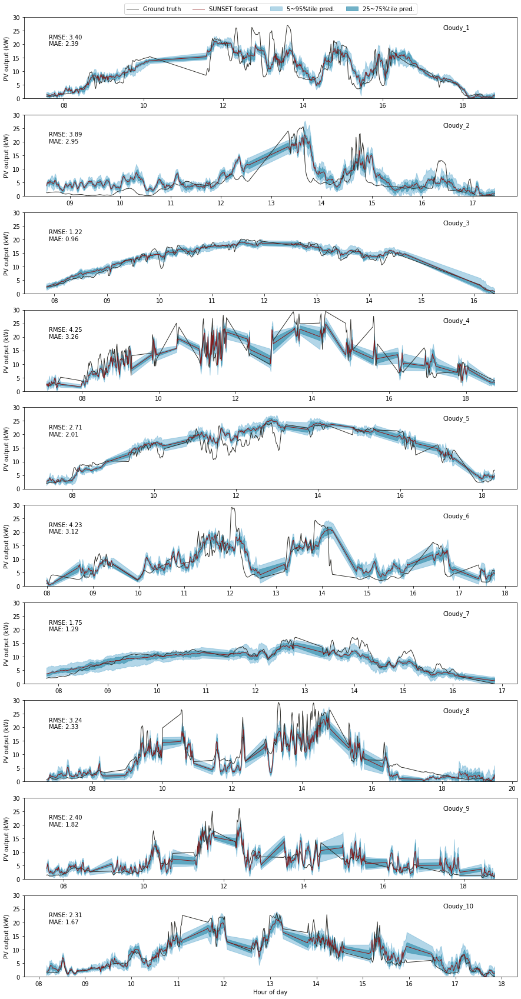

In [35]:
# visualization of forecast prediction_ensembles
dates_test = np.array([dtinfo.date() for dtinfo in times_test])
hours_test = np.array([dtinfo.time() for dtinfo in times_test])

f,axarr = plt.subplots(10,1,sharex=False, sharey = True)
xfmt = mdates.DateFormatter('%H')
fmt_date = datetime.date(2000,1,1)

green = '#8AB8A7'
red = '#8C1515'
blue = '#67AFD2'
grey =  '#B6B1A9'
black = '#2E2D29'
red = '#8C1515'
light_blue = '#67AFD2'
dark_blue = '#016895'
blue = '#4298B5'
black = '#2E2D29'
dark_red = '#820000'
light_red = '#B83A4B'

for i,date in enumerate(cloudy_dates_test):
    ax = axarr[i]
    date_mask = (dates_test == date)
    hours_xaxis= [datetime.datetime.combine(fmt_date, hour) for hour in hours_test[date_mask]] 
    
    rmse = np.sqrt(np.mean(np.square((pv_log_test[date_mask]-prediction_ensemble[date_mask]))))
    mae = np.mean(np.abs((pv_log_test[date_mask]-prediction_ensemble[date_mask])))
    #per_rmse = np.sqrt(np.mean(np.square((pv_log_test[date_mask]-per_prediction_ensemble[date_mask]))))
    #fs = (1 - rmse/per_rmse)*100
    
    ax.plot(hours_xaxis, pv_log_test[date_mask], linewidth = 1, color=black, label = 'Ground truth')
    ax.fill_between(hours_xaxis, percent5_prediction[date_mask], percent95_prediction[date_mask], color=light_blue, alpha=0.5, label = '5~95%tile pred.')
    ax.fill_between(hours_xaxis, percent25_prediction[date_mask], percent75_prediction[date_mask], color=blue, alpha=0.75, label = '25~75%tile pred.')
    #ax.fill_between(hours_xaxis, 0, pv_log_test[date_mask], color=grey, alpha=.2, label = 'Ground truth')
    ax.plot(hours_xaxis, prediction_ensemble[date_mask],linewidth = 1, label = 'SUNSET forecast',color=red,markerfacecolor="None")
    #ax.plot(hours_xaxis, per_prediction_ensemble[date_mask],linewidth = 1,label = 'Persistence forecast',color=blue,markerfacecolor="None")
    ax.set_ylabel('PV output (kW)')
    ax.xaxis.set_major_formatter(xfmt)
    ax.text(0.85,0.85,'Cloudy_'+str(i+1), transform=ax.transAxes)
    #ax.text(0.05,0.65,"RMSE: {0:.2f}\nMAE: {1:.2f}\nFS: {2:.2f}%".format(rmse,mae,fs),transform=ax.transAxes)
    ax.text(0.05,0.65,"RMSE: {0:.2f}\nMAE: {1:.2f}".format(rmse,mae),transform=ax.transAxes)

axarr[0].set_ylim(0, 30)
axarr[0].legend(bbox_to_anchor= [.5,1.2], loc = 'upper center', ncol = 4)
axarr[-1].set_xlabel('Hour of day')

f.set_size_inches(15,30)
#plt.savefig(os.path.join(pardir,'results','sunset_forecast_baseline_2017_2019_full_data_trained_2019_test_days.pdf'), bbox_inches='tight',dpi=300)
plt.show()

#### Feeding ConvLSTM generated images as input

In [36]:
gen_data_folder = os.path.join(pardir,"data")
# You should modify the path to where you save your generated images
gen_data_path = os.path.join(gen_data_folder, "Predicted_images_validation_set",'predicted_images_validation_set_ConvLSTM.hdf5')

with h5py.File(gen_data_path,'r') as f:

    # read in the data
    predicted_images = f['trainval']['images_pred'][:,-1]

    # process image data
    predicted_images = mask_background(predicted_images)
    predicted_images = tf.image.convert_image_dtype(predicted_images, dtype=tf.float32).numpy()

print("predicted_images.shape:",predicted_images.shape)

predicted_images.shape: (4467, 64, 64, 3)


In [37]:
# evaluate model on the test set and generate predictions
loss = np.zeros((num_fold,len(times_test)))
prediction = np.zeros((num_fold,len(times_test)))

for i in range(num_fold):
    # define model path
    print("loading repetition {0} model ...".format(i+1))
    model_path = os.path.join(output_folder,'repetition_'+str(i+1),'best_model_repitition_'+str(i+1)+'.h5')
    # load the trained model
    model = keras.models.load_model(model_path)
    
    # model evaluation
    print("evaluating performance for the model".format(i+1))
    loss[i] = model.evaluate(x=predicted_images, y=pv_log_test, batch_size=256, verbose=1)
    
    # generate prediction
    print("generating predictions for the model".format(i+1))
    prediction[i] = np.squeeze(model.predict(predicted_images, batch_size=256, verbose=1))

# saving predictions from each model
np.save(os.path.join(output_folder,'test_predictions_validation_ConvLSTM_gen_images_as_input.npy'),prediction)

# using the ensemble mean of the 10 models as the final prediction 
print('-'*50)
print("model ensembling ...")
prediction_ensemble = np.mean(prediction,axis=0)
loss_ensemble = np.sqrt(np.mean((prediction_ensemble-pv_log_test)**2))
print("the test set RMSE is {0:.3f} for the ensemble model".format(loss_ensemble))

loading repetition 1 model ...
evaluating performance for the model
18/18 [==============================] - 0s 9ms/step - loss: 24.6136
generating predictions for the model
18/18 [==============================] - 0s 7ms/step
loading repetition 2 model ...
evaluating performance for the model
18/18 [==============================] - 0s 8ms/step - loss: 23.4851
generating predictions for the model
18/18 [==============================] - 0s 7ms/step
loading repetition 3 model ...
evaluating performance for the model
18/18 [==============================] - 0s 8ms/step - loss: 20.8856
generating predictions for the model
18/18 [==============================] - 0s 8ms/step
loading repetition 4 model ...
evaluating performance for the model
18/18 [==============================] - 0s 8ms/step - loss: 22.3312
generating predictions for the model
18/18 [==============================] - 0s 7ms/step
loading repetition 5 model ...
evaluating performance for the model
18/18 [=================

In [38]:
# formulate sunny and cloudy test days
cloudy_dates = [(2017,9,6),(2017,11,4),(2017,12,29),
        (2018,5,31),(2018,7,12),(2018,10,3),
        (2019,1,26),(2019,5,27),(2019,9,7),(2019,10,19)]
dates_test = np.asarray([times.date() for times in times_test])
cloudy_dates_test = [datetime.date(day[0],day[1],day[2]) for day in cloudy_dates]

## generate mask2 for the sunny days
times_test_cloudy = times_test
#pv_pred_test_cloudy = pv_pred_test[~mask2]
pv_log_test_cloudy = pv_log_test
images_log_test_cloudy = images_log_test
prediction_cloudy = prediction_ensemble
print("times_test_cloudy.shape:",times_test_cloudy.shape)

times_test_cloudy.shape: (4467,)


In [39]:
## probabilistic eval metrics
# CRPS evaluation
crps = np.zeros(len(times_test))
for i in range(len(times_test)):
    crps[i],_,_ = pscore(prediction[:,i],pv_log_test[i]).compute()
crps_mean = np.mean(crps)
print('The mean crps: {0:.3f}'.format(crps_mean))

The mean crps: 2.696


In [40]:
## probabilistic eval metrics
# Winkler score evaluation
wscore = np.zeros(len(times_test))
for i in range(len(times_test)):
    wscore[i] = compute_winkler_score(prediction[:,i],pv_log_test[i])
wscore_mean = np.mean(wscore)
print('The mean Winkler score: {0:.3f}'.format(wscore_mean))

The mean Winkler score: 41.124


In [41]:
percent25_prediction = np.percentile(prediction,25,axis=0)
percent75_prediction = np.percentile(prediction,75,axis=0)
percent5_prediction = np.percentile(prediction,5,axis=0)
percent95_prediction = np.percentile(prediction,95,axis=0)

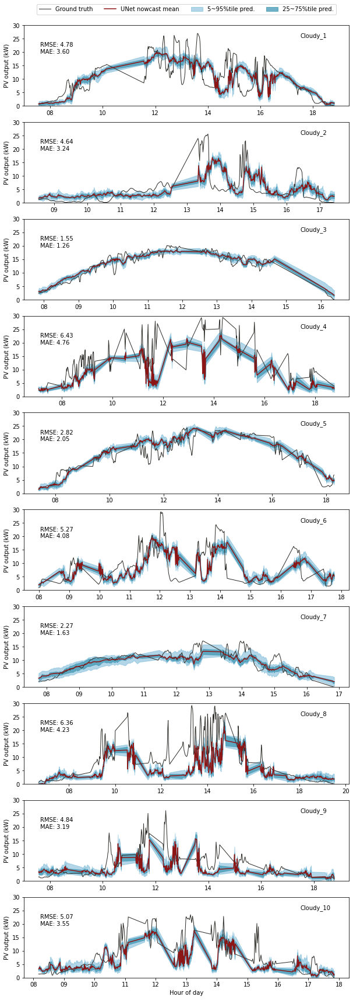

In [45]:
# visualization of forecast predictions
dates_test = np.array([dtinfo.date() for dtinfo in times_test])
hours_test = np.array([dtinfo.time() for dtinfo in times_test])

f,axarr = plt.subplots(10,1,sharex=False, sharey = True)
xfmt = mdates.DateFormatter('%H')
fmt_date = datetime.date(2000,1,1)

green = '#8AB8A7'
red = '#8C1515'
blue = '#67AFD2'
grey =  '#B6B1A9'
black = '#2E2D29'
red = '#8C1515'
light_blue = '#67AFD2'
dark_blue = '#016895'
blue = '#4298B5'
black = '#2E2D29'
dark_red = '#820000'
light_red = '#B83A4B'

for i,date in enumerate(cloudy_dates_test):
    ax = axarr[i]
    date_mask = (dates_test == date)
    hours_xaxis= [datetime.datetime.combine(fmt_date, hour) for hour in hours_test[date_mask]] 
    
    rmse = np.sqrt(np.mean(np.square((pv_log_test[date_mask]-prediction_ensemble[date_mask]))))
    mae = np.mean(np.abs((pv_log_test[date_mask]-prediction_ensemble[date_mask])))
    #per_rmse = np.sqrt(np.mean(np.square((pv_log_test[date_mask]-per_prediction_ensemble[date_mask]))))
    #fs = (1 - rmse/per_rmse)*100
    
    ax.plot(hours_xaxis, pv_log_test[date_mask], linewidth = 1,color=black, label = 'Ground truth')
    #ax.fill_between(hours_xaxis, 0, pv_log_test[date_mask], color=grey, alpha=.2, label = 'Ground truth')
    ax.plot(hours_xaxis, prediction_ensemble[date_mask],linewidth = 1.5,label = 'UNet nowcast mean',color=red,markerfacecolor="None")
    ax.fill_between(hours_xaxis, percent5_prediction[date_mask], percent95_prediction[date_mask], color=light_blue, alpha=0.5, label = '5~95%tile pred.')
    ax.fill_between(hours_xaxis, percent25_prediction[date_mask], percent75_prediction[date_mask], color=blue, alpha=0.75, label = '25~75%tile pred.')
    #for j in range(prediction.shape[0]):
    #    if j==0:
    #        ax.plot(hours_xaxis, prediction[j][date_mask],linewidth = 1,label = 'UNet nowcast',color=red,alpha=0.5,markerfacecolor="None")
    #    else:
    #        ax.plot(hours_xaxis, prediction[j][date_mask],linewidth = 1,color=red,alpha=0.5,markerfacecolor="None")
    #ax.plot(hours_xaxis, per_prediction_ensemble[date_mask],linewidth = 1,label = 'Persistence forecast',color=blue,markerfacecolor="None")
    ax.set_ylabel('PV output (kW)')
    ax.xaxis.set_major_formatter(xfmt)
    ax.text(0.85,0.85,'Cloudy_'+str(i+1), transform=ax.transAxes)
    #ax.text(0.05,0.65,"RMSE: {0:.2f}\nMAE: {1:.2f}\nFS: {2:.2f}%".format(rmse,mae,fs),transform=ax.transAxes)
    ax.text(0.05,0.65,"RMSE: {0:.2f}\nMAE: {1:.2f}".format(rmse,mae),transform=ax.transAxes)

axarr[0].set_ylim(0, 30)
axarr[0].legend(bbox_to_anchor= [.5,1.3], loc = 'upper center', ncol = 4)
axarr[-1].set_xlabel('Hour of day')

f.set_size_inches(10,30)    
#plt.savefig(os.path.join(pardir,'results','unet_nowcast_full_data_trained_2019_test_forecast_with_real_future_image_2.pdf'), bbox_inches='tight',dpi=300)
plt.show()

#### Feeding PhyDNet generated images as input

In [46]:
gen_data_folder = os.path.join(pardir,"data")
# You should modify the path to where you save your generated images
gen_data_path = os.path.join(gen_data_folder, "Predicted_images_validation_set",'predicted_images_validation_set_PhyDNet.hdf5')

with h5py.File(gen_data_path,'r') as f:

    # read in the data
    predicted_images = f['trainval']['images_pred'][:,-1]
    #pv_log_test = f['test']['pv_pred'][:,-1]

    # process image data
    predicted_images = mask_background(predicted_images)
    predicted_images = tf.image.convert_image_dtype(predicted_images, dtype=tf.float32).numpy()
    #pv_log_test = tf.convert_to_tensor(pv_log_test, dtype=tf.float32).numpy()

print("predicted_images.shape:",predicted_images.shape)
#print("pv_log_test.shape:",pv_log_test.shape)

predicted_images.shape: (4467, 64, 64, 3)


In [47]:
# evaluate model on the test set and generate predictions
loss = np.zeros((num_fold,len(times_test)))
prediction = np.zeros((num_fold,len(times_test)))

for i in range(num_fold):
    # define model path
    print("loading repetition {0} model ...".format(i+1))
    model_path = os.path.join(output_folder,'repetition_'+str(i+1),'best_model_repitition_'+str(i+1)+'.h5')
    # load the trained model
    model = keras.models.load_model(model_path)
    
    # model evaluation
    print("evaluating performance for the model".format(i+1))
    loss[i] = model.evaluate(x=predicted_images, y=pv_log_test, batch_size=256, verbose=1)
    
    # generate prediction
    print("generating predictions for the model".format(i+1))
    prediction[i] = np.squeeze(model.predict(predicted_images, batch_size=256, verbose=1))

# saving predictions from each model
np.save(os.path.join(output_folder,'test_predictions_validation_PhyDNet_gen_images_as_input.npy'),prediction)

# using the ensemble mean of the 10 models as the final prediction 
print('-'*50)
print("model ensembling ...")
prediction_ensemble = np.mean(prediction,axis=0)
loss_ensemble = np.sqrt(np.mean((prediction_ensemble-pv_log_test)**2))
print("the test set RMSE is {0:.3f} for the ensemble model".format(loss_ensemble))

loading repetition 1 model ...
evaluating performance for the model
18/18 [==============================] - 0s 8ms/step - loss: 22.7353
generating predictions for the model
18/18 [==============================] - 0s 7ms/step
loading repetition 2 model ...
evaluating performance for the model
18/18 [==============================] - 0s 8ms/step - loss: 24.0606
generating predictions for the model
18/18 [==============================] - 0s 7ms/step
loading repetition 3 model ...
evaluating performance for the model
18/18 [==============================] - 0s 8ms/step - loss: 20.9713
generating predictions for the model
18/18 [==============================] - 0s 7ms/step
loading repetition 4 model ...
evaluating performance for the model
18/18 [==============================] - 0s 8ms/step - loss: 22.4285
generating predictions for the model
18/18 [==============================] - 0s 7ms/step
loading repetition 5 model ...
evaluating performance for the model
18/18 [=================

In [48]:
# formulate sunny and cloudy test days
cloudy_dates = [(2017,9,6),(2017,11,4),(2017,12,29),
        (2018,5,31),(2018,7,12),(2018,10,3),
        (2019,1,26),(2019,5,27),(2019,9,7),(2019,10,19)]
dates_test = np.asarray([times.date() for times in times_test])
cloudy_dates_test = [datetime.date(day[0],day[1],day[2]) for day in cloudy_dates]

## generate mask2 for the sunny days
times_test_cloudy = times_test
#pv_pred_test_cloudy = pv_pred_test[~mask2]
pv_log_test_cloudy = pv_log_test
images_log_test_cloudy = images_log_test
prediction_cloudy = prediction_ensemble
print("times_test_cloudy.shape:",times_test_cloudy.shape)

times_test_cloudy.shape: (4467,)


In [49]:
## probabilistic eval metrics
# CRPS evaluation
crps = np.zeros(len(times_test))
for i in range(len(times_test)):
    crps[i],_,_ = pscore(prediction[:,i],pv_log_test[i]).compute()
crps_mean = np.mean(crps)
print('The mean crps: {0:.3f}'.format(crps_mean))

The mean crps: 2.716


In [50]:
## probabilistic eval metrics
# Winkler score evaluation
wscore = np.zeros(len(times_test))
for i in range(len(times_test)):
    wscore[i] = compute_winkler_score(prediction[:,i],pv_log_test[i])
wscore_mean = np.mean(wscore)
print('The mean Winkler score: {0:.3f}'.format(wscore_mean))

The mean Winkler score: 41.282


In [51]:
percent25_prediction = np.percentile(prediction,25,axis=0)
percent75_prediction = np.percentile(prediction,75,axis=0)
percent5_prediction = np.percentile(prediction,5,axis=0)
percent95_prediction = np.percentile(prediction,95,axis=0)

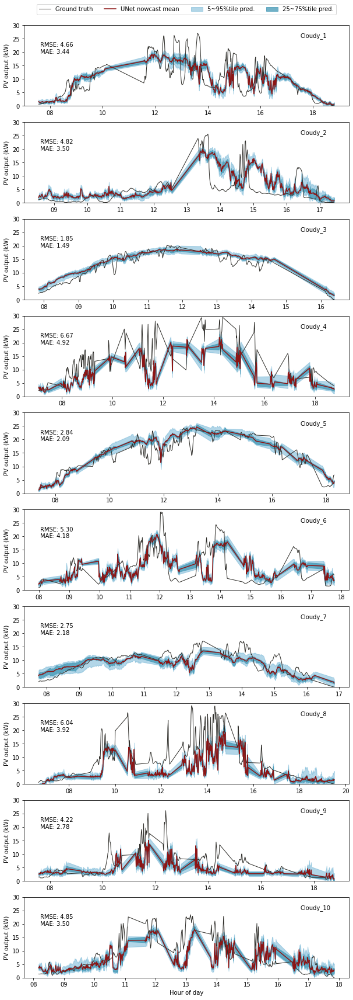

In [53]:
# visualization of forecast predictions
dates_test = np.array([dtinfo.date() for dtinfo in times_test])
hours_test = np.array([dtinfo.time() for dtinfo in times_test])

f,axarr = plt.subplots(10,1,sharex=False, sharey = True)
xfmt = mdates.DateFormatter('%H')
fmt_date = datetime.date(2000,1,1)

green = '#8AB8A7'
red = '#8C1515'
blue = '#67AFD2'
grey =  '#B6B1A9'
black = '#2E2D29'
red = '#8C1515'
light_blue = '#67AFD2'
dark_blue = '#016895'
blue = '#4298B5'
black = '#2E2D29'
dark_red = '#820000'
light_red = '#B83A4B'

for i,date in enumerate(cloudy_dates_test):
    ax = axarr[i]
    date_mask = (dates_test == date)
    hours_xaxis= [datetime.datetime.combine(fmt_date, hour) for hour in hours_test[date_mask]] 
    
    rmse = np.sqrt(np.mean(np.square((pv_log_test[date_mask]-prediction_ensemble[date_mask]))))
    mae = np.mean(np.abs((pv_log_test[date_mask]-prediction_ensemble[date_mask])))
    #per_rmse = np.sqrt(np.mean(np.square((pv_log_test[date_mask]-per_prediction_ensemble[date_mask]))))
    #fs = (1 - rmse/per_rmse)*100
    
    ax.plot(hours_xaxis, pv_log_test[date_mask], linewidth = 1,color=black, label = 'Ground truth')
    #ax.fill_between(hours_xaxis, 0, pv_log_test[date_mask], color=grey, alpha=.2, label = 'Ground truth')
    ax.plot(hours_xaxis, prediction_ensemble[date_mask],linewidth = 1.5,label = 'UNet nowcast mean',color=red,markerfacecolor="None")
    ax.fill_between(hours_xaxis, percent5_prediction[date_mask], percent95_prediction[date_mask], color=light_blue, alpha=0.5, label = '5~95%tile pred.')
    ax.fill_between(hours_xaxis, percent25_prediction[date_mask], percent75_prediction[date_mask], color=blue, alpha=0.75, label = '25~75%tile pred.')
    #for j in range(prediction.shape[0]):
    #    if j==0:
    #        ax.plot(hours_xaxis, prediction[j][date_mask],linewidth = 1,label = 'UNet nowcast',color=red,alpha=0.5,markerfacecolor="None")
    #    else:
    #        ax.plot(hours_xaxis, prediction[j][date_mask],linewidth = 1,color=red,alpha=0.5,markerfacecolor="None")
    #ax.plot(hours_xaxis, per_prediction_ensemble[date_mask],linewidth = 1,label = 'Persistence forecast',color=blue,markerfacecolor="None")
    ax.set_ylabel('PV output (kW)')
    ax.xaxis.set_major_formatter(xfmt)
    ax.text(0.85,0.85,'Cloudy_'+str(i+1), transform=ax.transAxes)
    #ax.text(0.05,0.65,"RMSE: {0:.2f}\nMAE: {1:.2f}\nFS: {2:.2f}%".format(rmse,mae,fs),transform=ax.transAxes)
    ax.text(0.05,0.65,"RMSE: {0:.2f}\nMAE: {1:.2f}".format(rmse,mae),transform=ax.transAxes)

axarr[0].set_ylim(0, 30)
axarr[0].legend(bbox_to_anchor= [.5,1.3], loc = 'upper center', ncol = 4)
axarr[-1].set_xlabel('Hour of day')

f.set_size_inches(10,30)    
#plt.savefig(os.path.join(pardir,'results','unet_nowcast_full_data_trained_2019_test_forecast_with_real_future_image_2.pdf'), bbox_inches='tight',dpi=300)
plt.show()

#### Feeding PhyDNet+GAN generated images as input

In [54]:
gen_data_folder = os.path.join(pardir,"data")
# You should modify the path to where you save your generated images
gen_data_path = os.path.join(gen_data_folder, "Predicted_images_validation_set",'predicted_images_validation_set_PhyDNetGAN.hdf5')

with h5py.File(gen_data_path,'r') as f:

    # read in the data
    predicted_images = f['trainval']['images_pred'][:,-1]
    #pv_log_test = f['test']['pv_pred'][:,-1]

    # process image data
    predicted_images = mask_background(predicted_images)
    predicted_images = tf.image.convert_image_dtype(predicted_images, dtype=tf.float32).numpy()
    #pv_log_test = tf.convert_to_tensor(pv_log_test, dtype=tf.float32).numpy()

print("predicted_images.shape:",predicted_images.shape)
#print("pv_log_test.shape:",pv_log_test.shape)

predicted_images.shape: (4467, 64, 64, 3)


In [55]:
# evaluate model on the test set and generate predictions
loss = np.zeros((num_fold,len(times_test)))
prediction = np.zeros((num_fold,len(times_test)))

for i in range(num_fold):
    # define model path
    print("loading repetition {0} model ...".format(i+1))
    model_path = os.path.join(output_folder,'repetition_'+str(i+1),'best_model_repitition_'+str(i+1)+'.h5')
    # load the trained model
    model = keras.models.load_model(model_path)
    
    # model evaluation
    print("evaluating performance for the model".format(i+1))
    loss[i] = model.evaluate(x=predicted_images, y=pv_log_test, batch_size=256, verbose=1)
    
    # generate prediction
    print("generating predictions for the model".format(i+1))
    prediction[i] = np.squeeze(model.predict(predicted_images, batch_size=256, verbose=1))

# saving predictions from each model
np.save(os.path.join(output_folder,'test_predictions_validation_SkyImageGAN_gen_images_as_input.npy'),prediction)

# using the ensemble mean of the 10 models as the final prediction 
print('-'*50)
print("model ensembling ...")
prediction_ensemble = np.mean(prediction,axis=0)
loss_ensemble = np.sqrt(np.mean((prediction_ensemble-pv_log_test)**2))
print("the test set RMSE is {0:.3f} for the ensemble model".format(loss_ensemble))

loading repetition 1 model ...
evaluating performance for the model
18/18 [==============================] - 0s 9ms/step - loss: 20.8127
generating predictions for the model
18/18 [==============================] - 0s 8ms/step
loading repetition 2 model ...
evaluating performance for the model
18/18 [==============================] - 0s 8ms/step - loss: 21.2028
generating predictions for the model
18/18 [==============================] - 0s 7ms/step
loading repetition 3 model ...
evaluating performance for the model
18/18 [==============================] - 0s 8ms/step - loss: 19.0940
generating predictions for the model
18/18 [==============================] - 0s 7ms/step
loading repetition 4 model ...
evaluating performance for the model
18/18 [==============================] - 0s 8ms/step - loss: 20.4219
generating predictions for the model
18/18 [==============================] - 0s 7ms/step
loading repetition 5 model ...
evaluating performance for the model
18/18 [=================

In [56]:
# formulate sunny and cloudy test days
cloudy_dates = [(2017,9,6),(2017,11,4),(2017,12,29),
        (2018,5,31),(2018,7,12),(2018,10,3),
        (2019,1,26),(2019,5,27),(2019,9,7),(2019,10,19)]
dates_test = np.asarray([times.date() for times in times_test])
cloudy_dates_test = [datetime.date(day[0],day[1],day[2]) for day in cloudy_dates]

## generate mask2 for the sunny days
times_test_cloudy = times_test
#pv_pred_test_cloudy = pv_pred_test[~mask2]
pv_log_test_cloudy = pv_log_test
images_log_test_cloudy = images_log_test
prediction_cloudy = prediction_ensemble
print("times_test_cloudy.shape:",times_test_cloudy.shape)

times_test_cloudy.shape: (4467,)


In [57]:
## probabilistic eval metrics
# CRPS evaluation
crps = np.zeros(len(times_test))
for i in range(len(times_test)):
    crps[i],_,_ = pscore(prediction[:,i],pv_log_test[i]).compute()
crps_mean = np.mean(crps)
print('The mean crps: {0:.3f}'.format(crps_mean))

The mean crps: 2.498


In [58]:
## probabilistic eval metrics
# Winkler score evaluation
wscore = np.zeros(len(times_test))
for i in range(len(times_test)):
    wscore[i] = compute_winkler_score(prediction[:,i],pv_log_test[i])
wscore_mean = np.mean(wscore)
print('The mean Winkler score: {0:.3f}'.format(wscore_mean))

The mean Winkler score: 36.226


In [59]:
percent25_prediction = np.percentile(prediction,25,axis=0)
percent75_prediction = np.percentile(prediction,75,axis=0)
percent5_prediction = np.percentile(prediction,5,axis=0)
percent95_prediction = np.percentile(prediction,95,axis=0)

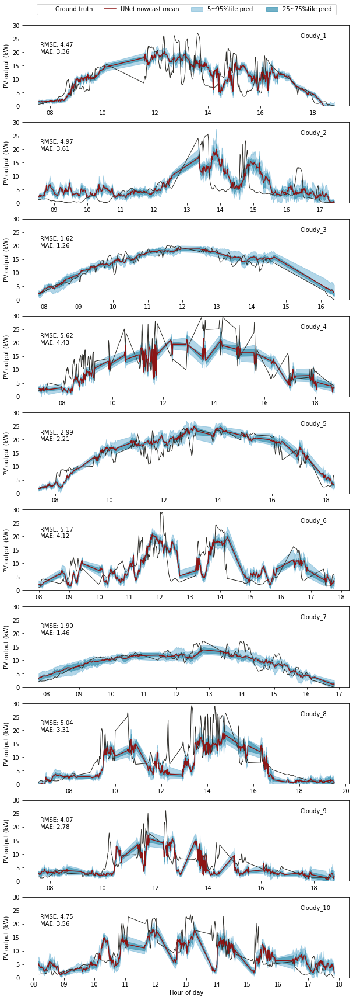

In [60]:
# visualization of forecast predictions
dates_test = np.array([dtinfo.date() for dtinfo in times_test])
hours_test = np.array([dtinfo.time() for dtinfo in times_test])

f,axarr = plt.subplots(10,1,sharex=False, sharey = True)
xfmt = mdates.DateFormatter('%H')
fmt_date = datetime.date(2000,1,1)

green = '#8AB8A7'
red = '#8C1515'
blue = '#67AFD2'
grey =  '#B6B1A9'
black = '#2E2D29'
red = '#8C1515'
light_blue = '#67AFD2'
dark_blue = '#016895'
blue = '#4298B5'
black = '#2E2D29'
dark_red = '#820000'
light_red = '#B83A4B'

for i,date in enumerate(cloudy_dates_test):
    ax = axarr[i]
    date_mask = (dates_test == date)
    hours_xaxis= [datetime.datetime.combine(fmt_date, hour) for hour in hours_test[date_mask]] 
    
    rmse = np.sqrt(np.mean(np.square((pv_log_test[date_mask]-prediction_ensemble[date_mask]))))
    mae = np.mean(np.abs((pv_log_test[date_mask]-prediction_ensemble[date_mask])))
    #per_rmse = np.sqrt(np.mean(np.square((pv_log_test[date_mask]-per_prediction_ensemble[date_mask]))))
    #fs = (1 - rmse/per_rmse)*100
    
    ax.plot(hours_xaxis, pv_log_test[date_mask], linewidth = 1,color=black, label = 'Ground truth')
    #ax.fill_between(hours_xaxis, 0, pv_log_test[date_mask], color=grey, alpha=.2, label = 'Ground truth')
    ax.plot(hours_xaxis, prediction_ensemble[date_mask],linewidth = 1.5,label = 'UNet nowcast mean',color=red,markerfacecolor="None")
    ax.fill_between(hours_xaxis, percent5_prediction[date_mask], percent95_prediction[date_mask], color=light_blue, alpha=0.5, label = '5~95%tile pred.')
    ax.fill_between(hours_xaxis, percent25_prediction[date_mask], percent75_prediction[date_mask], color=blue, alpha=0.75, label = '25~75%tile pred.')
    #for j in range(prediction.shape[0]):
    #    if j==0:
    #        ax.plot(hours_xaxis, prediction[j][date_mask],linewidth = 1,label = 'UNet nowcast',color=red,alpha=0.5,markerfacecolor="None")
    #    else:
    #        ax.plot(hours_xaxis, prediction[j][date_mask],linewidth = 1,color=red,alpha=0.5,markerfacecolor="None")
    #ax.plot(hours_xaxis, per_prediction_ensemble[date_mask],linewidth = 1,label = 'Persistence forecast',color=blue,markerfacecolor="None")
    ax.set_ylabel('PV output (kW)')
    ax.xaxis.set_major_formatter(xfmt)
    ax.text(0.85,0.85,'Cloudy_'+str(i+1), transform=ax.transAxes)
    #ax.text(0.05,0.65,"RMSE: {0:.2f}\nMAE: {1:.2f}\nFS: {2:.2f}%".format(rmse,mae,fs),transform=ax.transAxes)
    ax.text(0.05,0.65,"RMSE: {0:.2f}\nMAE: {1:.2f}".format(rmse,mae),transform=ax.transAxes)

axarr[0].set_ylim(0, 30)
axarr[0].legend(bbox_to_anchor= [.5,1.3], loc = 'upper center', ncol = 4)
axarr[-1].set_xlabel('Hour of day')

f.set_size_inches(10,30)    
#plt.savefig(os.path.join(pardir,'results','unet_nowcast_full_data_trained_2019_test_forecast_with_real_future_image_2.pdf'), bbox_inches='tight',dpi=300)
plt.show()

#### Feeding VideoGPT generated images as input

In [135]:
gen_data_folder = os.path.join(pardir,"data")
# You should modify the path to where you save your generated images
gen_data_path = os.path.join(gen_data_folder, "Predicted_images_validation_set",'predicted_images_validation_set_VideoGPT.hdf5')

with h5py.File(gen_data_path,'r') as f:

    # read in the data
    predicted_images_all_samplings = f['trainval']['images_pred_all_samplings'][:,:,-1]
    #pv_log_test = f['test']['pv_pred'][:,-1]

    # process image data
    #predicted_images = mask_background(predicted_images)
    #predicted_images = tf.image.convert_image_dtype(predicted_images, dtype=tf.float32).numpy()
    #pv_log_test = tf.convert_to_tensor(pv_log_test, dtype=tf.float32).numpy()

print("predicted_images_all_samplings.shape:",predicted_images_all_samplings.shape)
#print("pv_log_test.shape:",pv_log_test.shape)

predicted_images_all_samplings.shape: (10, 4467, 64, 64, 3)


In [136]:
# evaluate model on the test set and generate predictions
num_samplings = 10
loss = np.zeros((num_fold,num_samplings,len(times_test)))
prediction = np.zeros((num_fold,num_samplings,len(times_test)))

for i in range(num_fold):
    # define model path
    print("loading repetition {0} model ...".format(i+1))
    model_path = os.path.join(output_folder,'repetition_'+str(i+1),'best_model_repitition_'+str(i+1)+'.h5')
    # load the trained model
    model = keras.models.load_model(model_path)
    
    for j in range(num_samplings):
        print('generating prediction for sampling {0}'.format(j+1))
        predicted_images = predicted_images_all_samplings[j]
        predicted_images = mask_background(predicted_images)
        predicted_images = tf.image.convert_image_dtype(predicted_images, dtype=tf.float32).numpy()

        # model evaluation
        #print("evaluating performance for the model".format(i+1))
        loss[i,j] = model.evaluate(x=predicted_images, y=pv_log_test, batch_size=256, verbose=1)

        # generate prediction
        #print("generating predictions for the model".format(i+1))
        prediction[i,j] = np.squeeze(model.predict(predicted_images, batch_size=256, verbose=1))

# saving predictions from each model
np.save(os.path.join(output_folder,'test_predictions_validation_VideoGPT_gen_images_as_input.npy'),prediction)

loading repetition 1 model ...
generating prediction for sampling 1
18/18 [==============================] - 0s 8ms/step
generating prediction for sampling 2
18/18 [==============================] - 0s 8ms/step
generating prediction for sampling 3
18/18 [==============================] - 0s 8ms/step
generating prediction for sampling 4
18/18 [==============================] - 0s 8ms/step
generating prediction for sampling 5
18/18 [==============================] - 0s 8ms/step
generating prediction for sampling 6
18/18 [==============================] - 0s 8ms/step
generating prediction for sampling 7
18/18 [==============================] - 0s 8ms/step
generating prediction for sampling 8
18/18 [==============================] - 0s 12ms/step
generating prediction for sampling 9
18/18 [==============================] - 0s 8ms/step
generating prediction for sampling 10
18/18 [==============================] - 0s 8ms/step
loading repetition 2 model ...
generating prediction for sampling 1

18/18 [==============================] - 0s 8ms/step
generating prediction for sampling 2
18/18 [==============================] - 0s 8ms/step
generating prediction for sampling 3
18/18 [==============================] - 0s 8ms/step
generating prediction for sampling 4
18/18 [==============================] - 0s 8ms/step
generating prediction for sampling 5
18/18 [==============================] - 0s 8ms/step
generating prediction for sampling 6
18/18 [==============================] - 0s 8ms/step
generating prediction for sampling 7
18/18 [==============================] - 0s 8ms/step
generating prediction for sampling 8
18/18 [==============================] - 0s 8ms/step
generating prediction for sampling 9
18/18 [==============================] - 0s 12ms/step
generating prediction for sampling 10
18/18 [==============================] - 0s 8ms/step
loading repetition 7 model ...
generating prediction for sampling 1
18/18 [==============================] - 0s 8ms/step
generating pre

In [137]:
prediction = np.load(os.path.join(output_folder,'test_predictions_validation_VideoGPT_gen_images_as_input.npy'))

In [138]:
prediction_samp = prediction.reshape(-1,prediction.shape[-1])
prediction_samp.shape
prediction_ensemble = np.mean(prediction_samp,axis=0)

In [139]:
# evaluate deterministic performance
loss_rmse = np.sqrt(np.mean((prediction_ensemble-pv_log_test)**2))
print('test rmse for all 10 samplings is {0:3f}'.format(loss_rmse))

test rmse for all 10 samplings is 4.301019


In [140]:
# formulate sunny and cloudy test days
cloudy_dates = [(2017,9,6),(2017,11,4),(2017,12,29),
        (2018,5,31),(2018,7,12),(2018,10,3),
        (2019,1,26),(2019,5,27),(2019,9,7),(2019,10,19)]
dates_test = np.asarray([times.date() for times in times_test])
cloudy_dates_test = [datetime.date(day[0],day[1],day[2]) for day in cloudy_dates]

## generate mask2 for the sunny days
times_test_cloudy = times_test
#pv_pred_test_cloudy = pv_pred_test[~mask2]
pv_log_test_cloudy = pv_log_test
images_log_test_cloudy = images_log_test
prediction_cloudy = prediction_ensemble
print("times_test_cloudy.shape:",times_test_cloudy.shape)

times_test_cloudy.shape: (4467,)


In [141]:
## probabilistic eval metrics
# CRPS evaluation
crps = np.zeros(len(times_test))
for i in range(len(times_test)):
    crps[i],_,_ = pscore(prediction_samp[:,i],pv_log_test[i]).compute()
crps_mean = np.mean(crps)
print('The mean crps: {0:.3f}'.format(crps_mean))

The mean crps: 2.368


In [142]:
## probabilistic eval metrics
# Winkler score evaluation
wscore = np.zeros(len(times_test))
for i in range(len(times_test)):
    wscore[i] = compute_winkler_score(prediction_samp[:,i],pv_log_test[i])
wscore_mean = np.mean(wscore)
print('The mean Winkler score: {0:.3f}'.format(wscore_mean))

The mean Winkler score: 25.196


In [143]:
percent25_prediction = np.percentile(prediction_samp,25,axis=0)
percent75_prediction = np.percentile(prediction_samp,75,axis=0)
percent5_prediction = np.percentile(prediction_samp,5,axis=0)
percent95_prediction = np.percentile(prediction_samp,95,axis=0)

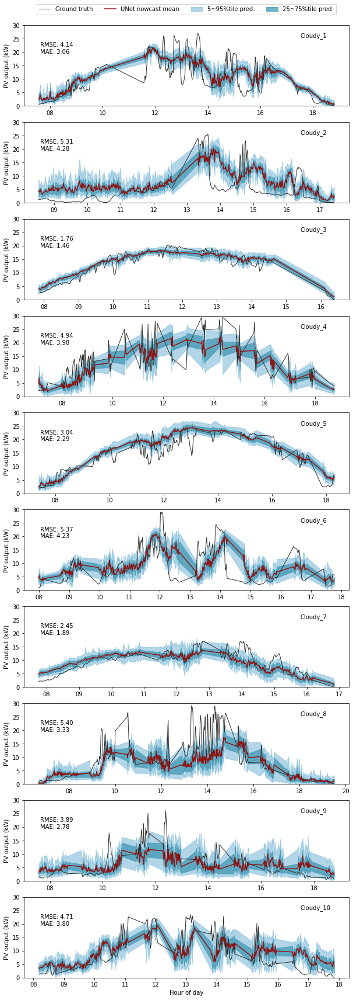

In [144]:
# visualization of forecast predictions
dates_test = np.array([dtinfo.date() for dtinfo in times_test])
hours_test = np.array([dtinfo.time() for dtinfo in times_test])

f,axarr = plt.subplots(10,1,sharex=False, sharey = True)
xfmt = mdates.DateFormatter('%H')
fmt_date = datetime.date(2000,1,1)

green = '#8AB8A7'
red = '#8C1515'
blue = '#67AFD2'
grey =  '#B6B1A9'
black = '#2E2D29'
red = '#8C1515'
light_blue = '#67AFD2'
dark_blue = '#016895'
blue = '#4298B5'
black = '#2E2D29'
dark_red = '#820000'
light_red = '#B83A4B'

for i,date in enumerate(cloudy_dates_test):
    ax = axarr[i]
    date_mask = (dates_test == date)
    hours_xaxis= [datetime.datetime.combine(fmt_date, hour) for hour in hours_test[date_mask]] 
    
    rmse = np.sqrt(np.mean(np.square((pv_log_test[date_mask]-prediction_ensemble[date_mask]))))
    mae = np.mean(np.abs((pv_log_test[date_mask]-prediction_ensemble[date_mask])))
    #per_rmse = np.sqrt(np.mean(np.square((pv_log_test[date_mask]-per_prediction_ensemble[date_mask]))))
    #fs = (1 - rmse/per_rmse)*100
    
    ax.plot(hours_xaxis, pv_log_test[date_mask], linewidth = 1,color=black, label = 'Ground truth')
    #ax.fill_between(hours_xaxis, 0, pv_log_test[date_mask], color=grey, alpha=.2, label = 'Ground truth')
    ax.plot(hours_xaxis, prediction_ensemble[date_mask],linewidth = 1.5,label = 'UNet nowcast mean',color=red,markerfacecolor="None")
    ax.fill_between(hours_xaxis, percent5_prediction[date_mask], percent95_prediction[date_mask], color=light_blue, alpha=0.5, label = '5~95%tile pred.')
    ax.fill_between(hours_xaxis, percent25_prediction[date_mask], percent75_prediction[date_mask], color=blue, alpha=0.75, label = '25~75%tile pred.')
    #for j in range(prediction.shape[0]):
    #    if j==0:
    #        ax.plot(hours_xaxis, prediction[j][date_mask],linewidth = 1,label = 'UNet nowcast',color=red,alpha=0.5,markerfacecolor="None")
    #    else:
    #        ax.plot(hours_xaxis, prediction[j][date_mask],linewidth = 1,color=red,alpha=0.5,markerfacecolor="None")
    #ax.plot(hours_xaxis, per_prediction_ensemble[date_mask],linewidth = 1,label = 'Persistence forecast',color=blue,markerfacecolor="None")
    ax.set_ylabel('PV output (kW)')
    ax.xaxis.set_major_formatter(xfmt)
    ax.text(0.85,0.85,'Cloudy_'+str(i+1), transform=ax.transAxes)
    #ax.text(0.05,0.65,"RMSE: {0:.2f}\nMAE: {1:.2f}\nFS: {2:.2f}%".format(rmse,mae,fs),transform=ax.transAxes)
    ax.text(0.05,0.65,"RMSE: {0:.2f}\nMAE: {1:.2f}".format(rmse,mae),transform=ax.transAxes)

axarr[0].set_ylim(0, 30)
axarr[0].legend(bbox_to_anchor= [.5,1.3], loc = 'upper center', ncol = 4)
axarr[-1].set_xlabel('Hour of day')

f.set_size_inches(10,30)    
#plt.savefig(os.path.join(pardir,'results','unet_nowcast_full_data_trained_2019_test_forecast_with_real_future_image_2.pdf'), bbox_inches='tight',dpi=300)
plt.show()

#### Feeding SkyGPT generated images as input

In [ ]:
gen_data_folder = os.path.join(pardir,"data")
# You should modify the path to where you save your generated images
gen_data_path = os.path.join(gen_data_folder, "Predicted_images_validation_set",'predicted_images_validation_set_SkyGPT.hdf5')

with h5py.File(gen_data_path,'r') as f:

    # read in the data
    predicted_images_all_samplings = f['trainval']['images_pred_all_samplings'][:,:,-1]

print("predicted_images_all_samplings.shape:",predicted_images_all_samplings.shape)

predicted_images_all_samplings.shape: (10, 4467, 64, 64, 3)


In [62]:
# evaluate model on the test set and generate predictions
num_samplings = 10
loss = np.zeros((num_fold,num_samplings,len(times_test)))
prediction = np.zeros((num_fold,num_samplings,len(times_test)))

for i in range(num_fold):
    # define model path
    print("loading repetition {0} model ...".format(i+1))
    model_path = os.path.join(output_folder,'repetition_'+str(i+1),'best_model_repitition_'+str(i+1)+'.h5')
    # load the trained model
    model = keras.models.load_model(model_path)
    
    for j in range(num_samplings):
        print('generating prediction for sampling {0}'.format(j+1))
        predicted_images = predicted_images_all_samplings[j]
        #predicted_images = mask_background(predicted_images)
        predicted_images = tf.image.convert_image_dtype(predicted_images, dtype=tf.float32).numpy()

        # model evaluation
        #print("evaluating performance for the model".format(i+1))
        loss[i,j] = model.evaluate(x=predicted_images, y=pv_log_test, batch_size=256, verbose=1)

        # generate prediction
        #print("generating predictions for the model".format(i+1))
        prediction[i,j] = np.squeeze(model.predict(predicted_images, batch_size=256, verbose=1))

# saving predictions from each model
np.save(os.path.join(output_folder,'test_predictions_validation_SkyGPT_gen_images_as_input.npy'),prediction)

loading repetition 1 model ...
generating prediction for sampling 1
18/18 [==============================] - 0s 8ms/step
generating prediction for sampling 2
18/18 [==============================] - 0s 7ms/step
generating prediction for sampling 3
18/18 [==============================] - 0s 7ms/step
generating prediction for sampling 4
18/18 [==============================] - 0s 7ms/step
generating prediction for sampling 5
18/18 [==============================] - 0s 7ms/step
generating prediction for sampling 6
18/18 [==============================] - 0s 8ms/step
generating prediction for sampling 7
18/18 [==============================] - 0s 8ms/step
generating prediction for sampling 8
18/18 [==============================] - 0s 8ms/step
generating prediction for sampling 9
18/18 [==============================] - 0s 7ms/step
generating prediction for sampling 10
18/18 [==============================] - 0s 7ms/step
loading repetition 2 model ...
generating prediction for sampling 1


In [63]:
prediction_samp = prediction.reshape(-1,prediction.shape[-1])
prediction_samp.shape
prediction_ensemble = np.mean(prediction_samp,axis=0)

In [64]:
# evaluate deterministic performance
loss_rmse = np.sqrt(np.mean((prediction_ensemble-pv_log_test)**2))
print('test rmse for all 10 samplings is {0:3f}'.format(loss_rmse))

test rmse for all 10 samplings is 4.508089


In [65]:
# formulate sunny and cloudy test days
cloudy_dates = [(2017,9,6),(2017,11,4),(2017,12,29),
        (2018,5,31),(2018,7,12),(2018,10,3),
        (2019,1,26),(2019,5,27),(2019,9,7),(2019,10,19)]
dates_test = np.asarray([times.date() for times in times_test])
cloudy_dates_test = [datetime.date(day[0],day[1],day[2]) for day in cloudy_dates]

## generate mask2 for the sunny days
times_test_cloudy = times_test
#pv_pred_test_cloudy = pv_pred_test[~mask2]
pv_log_test_cloudy = pv_log_test
images_log_test_cloudy = images_log_test
prediction_cloudy = prediction_ensemble
print("times_test_cloudy.shape:",times_test_cloudy.shape)

times_test_cloudy.shape: (4467,)


In [66]:
## probabilistic eval metrics
# CRPS evaluation
crps = np.zeros(len(times_test))
for i in range(len(times_test)):
    crps[i],_,_ = pscore(prediction_samp[:,i],pv_log_test[i]).compute()
crps_mean = np.mean(crps)
print('The mean crps: {0:.3f}'.format(crps_mean))

The mean crps: 2.489


In [67]:
## probabilistic eval metrics
# Winkler score evaluation
wscore = np.zeros(len(times_test))
for i in range(len(times_test)):
    wscore[i] = compute_winkler_score(prediction_samp[:,i],pv_log_test[i])
wscore_mean = np.mean(wscore)
print('The mean Winkler score: {0:.3f}'.format(wscore_mean))

The mean Winkler score: 26.963


In [68]:
percent25_prediction = np.percentile(prediction_samp,25,axis=0)
percent75_prediction = np.percentile(prediction_samp,75,axis=0)
percent5_prediction = np.percentile(prediction_samp,5,axis=0)
percent95_prediction = np.percentile(prediction_samp,95,axis=0)

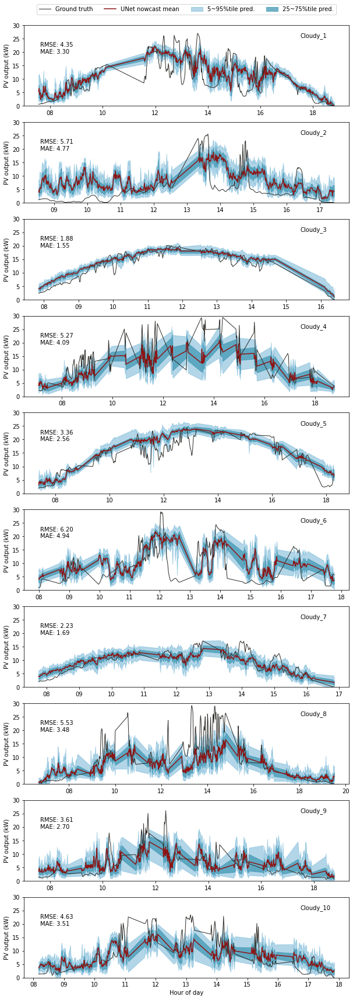

In [70]:
# visualization of forecast predictions
dates_test = np.array([dtinfo.date() for dtinfo in times_test])
hours_test = np.array([dtinfo.time() for dtinfo in times_test])

f,axarr = plt.subplots(10,1,sharex=False, sharey = True)
xfmt = mdates.DateFormatter('%H')
fmt_date = datetime.date(2000,1,1)

green = '#8AB8A7'
red = '#8C1515'
blue = '#67AFD2'
grey =  '#B6B1A9'
black = '#2E2D29'
red = '#8C1515'
light_blue = '#67AFD2'
dark_blue = '#016895'
blue = '#4298B5'
black = '#2E2D29'
dark_red = '#820000'
light_red = '#B83A4B'

for i,date in enumerate(cloudy_dates_test):
    ax = axarr[i]
    date_mask = (dates_test == date)
    hours_xaxis= [datetime.datetime.combine(fmt_date, hour) for hour in hours_test[date_mask]] 
    
    rmse = np.sqrt(np.mean(np.square((pv_log_test[date_mask]-prediction_ensemble[date_mask]))))
    mae = np.mean(np.abs((pv_log_test[date_mask]-prediction_ensemble[date_mask])))
    
    ax.plot(hours_xaxis, pv_log_test[date_mask], linewidth = 1,color=black, label = 'Ground truth')
    ax.plot(hours_xaxis, prediction_ensemble[date_mask],linewidth = 1.5,label = 'UNet nowcast mean',color=red,markerfacecolor="None")
    ax.fill_between(hours_xaxis, percent5_prediction[date_mask], percent95_prediction[date_mask], color=light_blue, alpha=0.5, label = '5~95%tile pred.')
    ax.fill_between(hours_xaxis, percent25_prediction[date_mask], percent75_prediction[date_mask], color=blue, alpha=0.75, label = '25~75%tile pred.')
    ax.set_ylabel('PV output (kW)')
    ax.xaxis.set_major_formatter(xfmt)
    ax.text(0.85,0.85,'Cloudy_'+str(i+1), transform=ax.transAxes)
    #ax.text(0.05,0.65,"RMSE: {0:.2f}\nMAE: {1:.2f}\nFS: {2:.2f}%".format(rmse,mae,fs),transform=ax.transAxes)
    ax.text(0.05,0.65,"RMSE: {0:.2f}\nMAE: {1:.2f}".format(rmse,mae),transform=ax.transAxes)

axarr[0].set_ylim(0, 30)
axarr[0].legend(bbox_to_anchor= [.5,1.3], loc = 'upper center', ncol = 4)
axarr[-1].set_xlabel('Hour of day')

f.set_size_inches(10,30)    
plt.show()

### Model Testing with Out-range test set

Test set data are 5 cloudy days drawn from 2019 Nov. and Dec., which is the outside the range of the training data set.

#### Feeding Real Future Sky Image

In [10]:
# load testing data
cwd = os.getcwd()
pardir = os.path.dirname(os.path.dirname(cwd))
data_folder = os.path.join(pardir,"data")
test_data_path = os.path.join(data_folder,'test_set_2019nov_dec.hdf5')
times_test = np.load(os.path.join(data_folder,"times_curr_test_2019nov_dec.npy"),allow_pickle=True)
print("times_test.shape:", times_test.shape)

model_name = 'UNet_Image_PV_mapping_masked_image'
output_folder = os.path.join(cwd,"model_output", model_name)

with h5py.File(test_data_path,'r') as f:

    # read in the data
    images_log_test = f['test']['images_pred'][:,-1]
    pv_log_test = f['test']['pv_pred'][:,-1]

    # process image data
    images_log_test = mask_background(images_log_test)
    images_log_test = tf.image.convert_image_dtype(images_log_test, dtype=tf.float32).numpy()
    pv_log_test = tf.convert_to_tensor(pv_log_test, dtype=tf.float32).numpy()

print("images_log_test.shape:",images_log_test.shape)
print("pv_log_test.shape:",pv_log_test.shape)
#print("pv_pred_test.shape:",pv_pred_test.shape)

times_test.shape: (2582,)
images_log_test.shape: (2582, 64, 64, 3)
pv_log_test.shape: (2582,)


In [120]:
# evaluate model on the test set and generate predictions
loss = np.zeros((num_fold,len(times_test)))
prediction = np.zeros((num_fold,len(times_test)))

for i in range(num_fold):
    # define model path
    print("loading repetition {0} model ...".format(i+1))
    model_path = os.path.join(output_folder,'repetition_'+str(i+1),'best_model_repitition_'+str(i+1)+'.h5')
    # load the trained model
    model = keras.models.load_model(model_path)
    
    # model evaluation
    print("evaluating performance for the model".format(i+1))
    loss[i] = model.evaluate(x=images_log_test, y=pv_log_test, batch_size=256, verbose=1)
    
    # generate prediction
    print("generating predictions for the model".format(i+1))
    prediction[i] = np.squeeze(model.predict(images_log_test, batch_size=256, verbose=1))

# saving predictions from each model
np.save(os.path.join(output_folder,'test_predictions_2019nov_dec.npy'),prediction)

# using the ensemble mean of the 10 models as the final prediction 
print('-'*50)
print("model ensembling ...")
prediction_ensemble = np.mean(prediction,axis=0)
loss_ensemble = np.sqrt(np.mean((prediction_ensemble-pv_log_test)**2))
print("the test set RMSE is {0:.3f} for the ensemble model".format(loss_ensemble))

loading repetition 1 model ...
evaluating performance for the model
11/11 [==============================] - 0s 8ms/step - loss: 18.2059
generating predictions for the model
11/11 [==============================] - 0s 8ms/step
loading repetition 2 model ...
evaluating performance for the model
11/11 [==============================] - 0s 8ms/step - loss: 17.8914
generating predictions for the model
11/11 [==============================] - 0s 9ms/step
loading repetition 3 model ...
evaluating performance for the model
11/11 [==============================] - 0s 8ms/step - loss: 21.5499
generating predictions for the model
11/11 [==============================] - 0s 8ms/step
loading repetition 4 model ...
evaluating performance for the model
11/11 [==============================] - 0s 8ms/step - loss: 18.5768
generating predictions for the model
11/11 [==============================] - 0s 8ms/step
loading repetition 5 model ...
evaluating performance for the model
11/11 [=================

In [83]:
# formulate sunny and cloudy test days
sunny_dates = [] # you can put sunny days here if you want to test sunny condition performance
cloudy_dates = [(2019, 11, 12),(2019, 11, 13),(2019, 11, 29),(2019, 12, 8),(2019, 12, 23)]
sunny_dates_test = [datetime.date(day[0],day[1],day[2]) for day in sunny_dates]
cloudy_dates_test = [datetime.date(day[0],day[1],day[2]) for day in cloudy_dates]

dates_test = np.asarray([times.date() for times in times_test])

## generate mask3 for the sunny days
mask3 = np.zeros(len(pv_log_test),dtype=bool)
for i in sunny_dates_test:
    mask3[np.where(dates_test==i)[0]]=1

## apply the mask3 to the dataset
times_test_sunny = times_test[mask3]
pv_log_test_sunny = pv_log_test[mask3]
prediction_sunny = prediction_ensemble[mask3]
print("times_test_sunny.shape:",times_test_sunny.shape)

times_test_cloudy = times_test[~mask3]
pv_log_test_cloudy = pv_log_test[~mask3]
prediction_cloudy = prediction_ensemble[~mask3]
print("times_test_cloudy.shape:",times_test_cloudy.shape)

times_test_sunny.shape: (0,)
times_test_cloudy.shape: (2582,)


In [84]:
## probabilistic eval metrics
# CRPS evaluation
crps = np.zeros(len(times_test))
for i in range(len(times_test)):
    crps[i],_,_ = pscore(prediction[:,i],pv_log_test[i]).compute()
crps_mean = np.mean(crps)
print('The mean crps: {0:.3f}'.format(crps_mean))

The mean crps: 2.343


In [85]:
## probabilistic eval metrics
# Winkler score evaluation
wscore = np.zeros(len(times_test))
for i in range(len(times_test)):
    wscore[i] = compute_winkler_score(prediction[:,i],pv_log_test[i])
wscore_mean = np.mean(wscore)
print('The mean Winkler score: {0:.3f}'.format(wscore_mean))

The mean Winkler score: 27.125


In [86]:
percent25_prediction = np.percentile(prediction,25,axis=0)
percent75_prediction = np.percentile(prediction,75,axis=0)
percent5_prediction = np.percentile(prediction,5,axis=0)
percent95_prediction = np.percentile(prediction,95,axis=0)

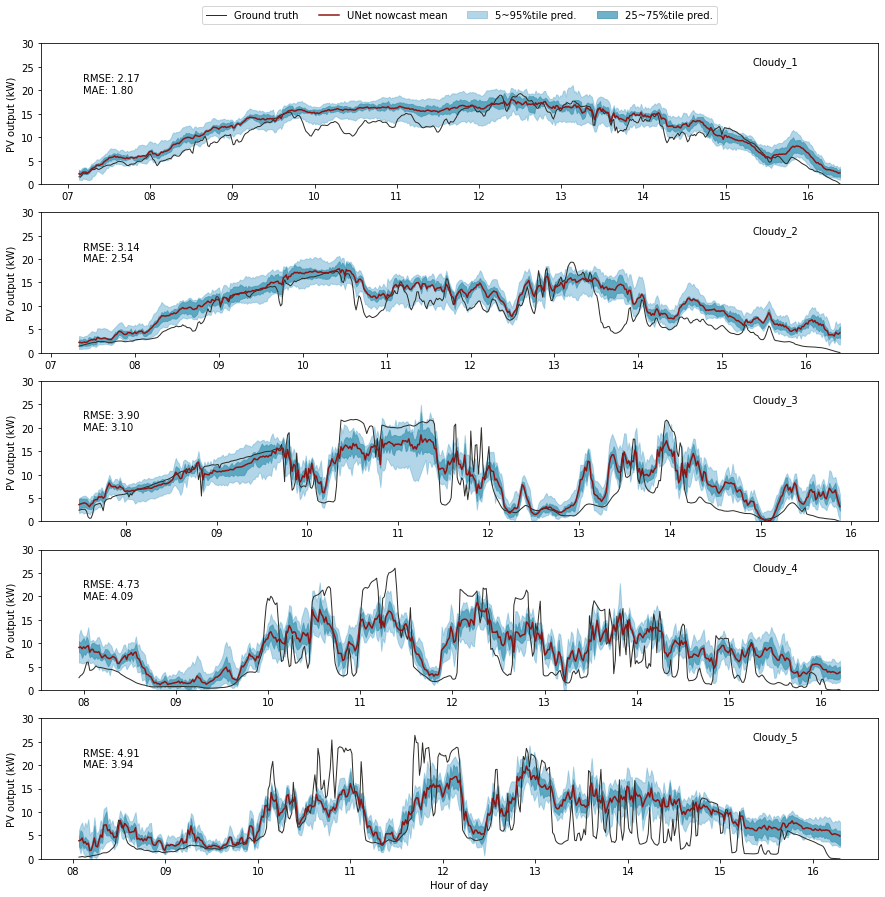

In [87]:
# visualization of forecast predictions
dates_test = np.array([dtinfo.date() for dtinfo in times_test])
hours_test = np.array([dtinfo.time() for dtinfo in times_test])

f,axarr = plt.subplots(5,1,sharex=False, sharey = True)
xfmt = mdates.DateFormatter('%H')
fmt_date = datetime.date(2000,1,1)

green = '#8AB8A7'
red = '#8C1515'
blue = '#67AFD2'
grey =  '#B6B1A9'
black = '#2E2D29'
red = '#8C1515'
light_blue = '#67AFD2'
dark_blue = '#016895'
blue = '#4298B5'
black = '#2E2D29'
dark_red = '#820000'
light_red = '#B83A4B'

for i,date in enumerate(cloudy_dates_test):
    ax = axarr[i]
    date_mask = (dates_test == date)
    hours_xaxis= [datetime.datetime.combine(fmt_date, hour) for hour in hours_test[date_mask]] 
    
    rmse = np.sqrt(np.mean(np.square((pv_log_test[date_mask]-prediction_ensemble[date_mask]))))
    mae = np.mean(np.abs((pv_log_test[date_mask]-prediction_ensemble[date_mask])))
    #per_rmse = np.sqrt(np.mean(np.square((pv_log_test[date_mask]-per_prediction_ensemble[date_mask]))))
    #fs = (1 - rmse/per_rmse)*100
    
    ax.plot(hours_xaxis, pv_log_test[date_mask], linewidth = 1,color=black, label = 'Ground truth')
    #ax.fill_between(hours_xaxis, 0, pv_log_test[date_mask], color=grey, alpha=.2, label = 'Ground truth')
    ax.plot(hours_xaxis, prediction_ensemble[date_mask],linewidth = 1.5,label = 'UNet nowcast mean',color=red,markerfacecolor="None")
    ax.fill_between(hours_xaxis, percent5_prediction[date_mask], percent95_prediction[date_mask], color=light_blue, alpha=0.5, label = '5~95%tile pred.')
    ax.fill_between(hours_xaxis, percent25_prediction[date_mask], percent75_prediction[date_mask], color=blue, alpha=0.75, label = '25~75%tile pred.')
    #for j in range(prediction.shape[0]):
    #    if j==0:
    #        ax.plot(hours_xaxis, prediction[j][date_mask],linewidth = 1,label = 'UNet nowcast',color=red,alpha=0.5,markerfacecolor="None")
    #    else:
    #        ax.plot(hours_xaxis, prediction[j][date_mask],linewidth = 1,color=red,alpha=0.5,markerfacecolor="None")
    #ax.plot(hours_xaxis, per_prediction_ensemble[date_mask],linewidth = 1,label = 'Persistence forecast',color=blue,markerfacecolor="None")
    ax.set_ylabel('PV output (kW)')
    ax.xaxis.set_major_formatter(xfmt)
    ax.text(0.85,0.85,'Cloudy_'+str(i+1), transform=ax.transAxes)
    #ax.text(0.05,0.65,"RMSE: {0:.2f}\nMAE: {1:.2f}\nFS: {2:.2f}%".format(rmse,mae,fs),transform=ax.transAxes)
    ax.text(0.05,0.65,"RMSE: {0:.2f}\nMAE: {1:.2f}".format(rmse,mae),transform=ax.transAxes)

axarr[0].set_ylim(0, 30)
axarr[0].legend(bbox_to_anchor= [.5,1.3], loc = 'upper center', ncol = 4)
axarr[-1].set_xlabel('Hour of day')

f.set_size_inches(15,15)    
#plt.savefig(os.path.join(pardir,'results','unet_nowcast_full_data_trained_2019_test_forecast_with_real_future_image_2.pdf'), bbox_inches='tight',dpi=300)
plt.show()

#### Feeding ConvLSTM Generated Images as Input

In [142]:
cwd = os.getcwd()
pardir = os.path.dirname(os.path.dirname(cwd))
# You should modify the path to where you save your generated images
predicted_image_folder = os.path.join(pardir,'models','ConvLSTM','save','ConvLSTM_sky_image_dataset_interval_2min_all_data_v2')
predicted_image = np.load(os.path.join(predicted_image_folder,'predicted_images_new_test_set_2019.npy'),allow_pickle=True)
predicted_image = predicted_image[:,-1]
predicted_image = mask_background(predicted_image)

In [143]:
predicted_image.shape

(2582, 64, 64, 3)

In [140]:
# load testing data
data_folder = os.path.join(pardir,"data")
test_data_path = os.path.join(data_folder,'test_set_2019nov_dec.hdf5')
times_test = np.load(os.path.join(data_folder,"times_curr_test_2019nov_dec.npy"),allow_pickle=True)
print("times_test.shape:", times_test.shape)

with h5py.File(test_data_path,'r') as f:

    # read in the data
    images_log_test = f['test']['images_pred'][:,-1]
    pv_log_test = f['test']['pv_pred'][:,-1]

# process image data
images_log_test = mask_background(images_log_test)
images_log_test = tf.image.convert_image_dtype(images_log_test, dtype=tf.float32).numpy()
pv_log_test = tf.convert_to_tensor(pv_log_test, dtype=tf.float32).numpy()

print("images_log_test.shape:",images_log_test.shape)
print("pv_log_test.shape:",pv_log_test.shape)
#print("pv_pred_test.shape:",pv_pred_test.shape)

times_test.shape: (2582,)
images_log_test.shape: (2582, 64, 64, 3)
pv_log_test.shape: (2582,)


In [144]:
# evaluate model on the test set and generate predictions
loss = np.zeros((num_fold,len(times_test)))
prediction = np.zeros((num_fold,len(times_test)))

for i in range(num_fold):
    # define model path
    print("loading repetition {0} model ...".format(i+1))
    model_path = os.path.join(output_folder,'repetition_'+str(i+1),'best_model_repitition_'+str(i+1)+'.h5')
    # load the trained model
    model = keras.models.load_model(model_path)
    
    # model evaluation
    print("evaluating performance for the model".format(i+1))
    loss[i] = model.evaluate(x=predicted_image, y=pv_log_test, batch_size=256, verbose=1)
    
    # generate prediction
    print("generating predictions for the model".format(i+1))
    prediction[i] = np.squeeze(model.predict(predicted_image, batch_size=256, verbose=1))

# saving predictions from each model
np.save(os.path.join(output_folder,'test_predictions_ConvLSTM_generated_imgs_as_input_new.npy'),prediction)

# using the ensemble mean of the 10 models as the final prediction 
print('-'*50)
#print("model ensembling ...")
prediction_ensemble = np.mean(prediction,axis=0)
loss_rmse = np.sqrt(np.mean((prediction_ensemble-pv_log_test)**2))
print("the test set RMSE is {0:.3f} for the model".format(loss_rmse))

loading repetition 1 model ...
evaluating performance for the model
11/11 [==============================] - 0s 8ms/step - loss: 32.9619
generating predictions for the model
11/11 [==============================] - 0s 8ms/step
loading repetition 2 model ...
evaluating performance for the model
11/11 [==============================] - 0s 8ms/step - loss: 29.3392
generating predictions for the model
11/11 [==============================] - 0s 8ms/step
loading repetition 3 model ...
evaluating performance for the model
11/11 [==============================] - 0s 8ms/step - loss: 29.1594
generating predictions for the model
11/11 [==============================] - 0s 8ms/step
loading repetition 4 model ...
evaluating performance for the model
11/11 [==============================] - 0s 8ms/step - loss: 29.6415
generating predictions for the model
11/11 [==============================] - 1s 11ms/step
loading repetition 5 model ...
evaluating performance for the model
11/11 [================

In [20]:
# formulate sunny and cloudy test days
sunny_dates = []
cloudy_dates = [(2019, 11, 12),(2019, 11, 13),(2019, 11, 29),(2019, 12, 8),(2019, 12, 23)]
sunny_dates_test = [datetime.date(day[0],day[1],day[2]) for day in sunny_dates]
cloudy_dates_test = [datetime.date(day[0],day[1],day[2]) for day in cloudy_dates]

dates_test = np.asarray([times.date() for times in times_test])

## generate mask3 for the sunny days
mask3 = np.zeros(len(pv_log_test),dtype=bool)
for i in sunny_dates_test:
    mask3[np.where(dates_test==i)[0]]=1

## apply the mask3 to the dataset
times_test_sunny = times_test[mask3]
#pv_pred_test_sunny = pv_pred_test[mask3]
pv_log_test_sunny = pv_log_test[mask3]
images_log_test_sunny = images_log_test[mask3]
prediction_ensemble_sunny = prediction_ensemble[mask3]
print("times_test_sunny.shape:",times_test_sunny.shape)

times_test_cloudy = times_test[~mask3]
#pv_pred_test_cloudy = pv_pred_test[~mask3]
pv_log_test_cloudy = pv_log_test[~mask3]
images_log_test_cloudy = images_log_test[~mask3]
prediction_ensemble_cloudy = prediction_ensemble[~mask3]
print("times_test_cloudy.shape:",times_test_cloudy.shape)

times_test_sunny.shape: (0,)
times_test_cloudy.shape: (2582,)


In [21]:
## probabilistic eval metrics
# CRPS evaluation
crps = np.zeros(len(times_test))
for i in range(len(times_test)):
    crps[i],_,_ = pscore(prediction[:,i],pv_log_test[i]).compute()
crps_mean = np.mean(crps)
print('The mean crps: {0:.3f}'.format(crps_mean))

The mean crps: 3.090


In [22]:
## probabilistic eval metrics
# Winkler score evaluation
wscore = np.zeros(len(times_test))
for i in range(len(times_test)):
    wscore[i] = compute_winkler_score(prediction[:,i],pv_log_test[i])
wscore_mean = np.mean(wscore)
print('The mean Winkler score: {0:.3f}'.format(wscore_mean))

The mean Winkler score: 43.818


In [23]:
percent25_prediction = np.percentile(prediction,25,axis=0)
percent75_prediction = np.percentile(prediction,75,axis=0)
percent5_prediction = np.percentile(prediction,5,axis=0)
percent95_prediction = np.percentile(prediction,95,axis=0)

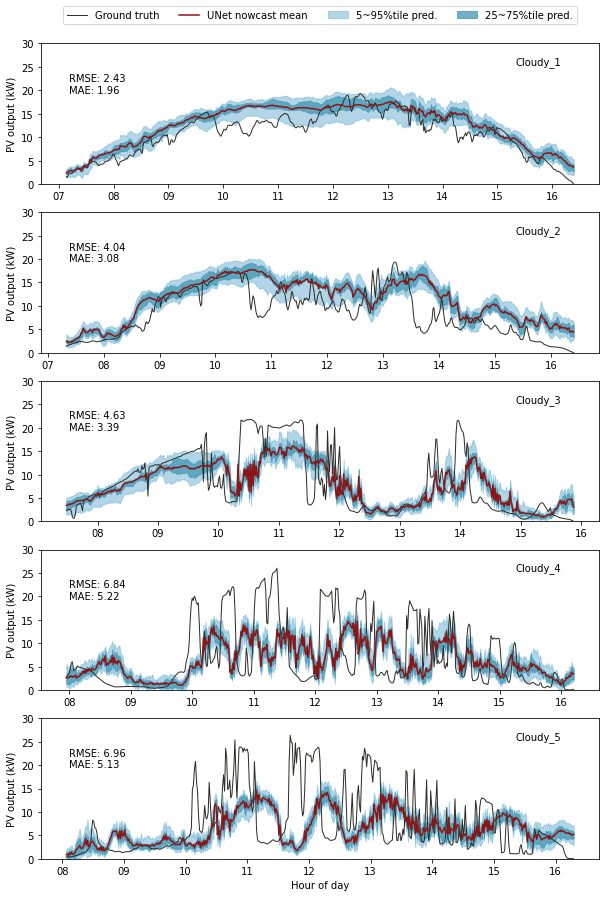

In [24]:
# visualization of forecast predictions
dates_test = np.array([dtinfo.date() for dtinfo in times_test])
hours_test = np.array([dtinfo.time() for dtinfo in times_test])

f,axarr = plt.subplots(5,1,sharex=False, sharey = True)
xfmt = mdates.DateFormatter('%H')
fmt_date = datetime.date(2000,1,1)

green = '#8AB8A7'
red = '#8C1515'
blue = '#67AFD2'
grey =  '#B6B1A9'
black = '#2E2D29'
red = '#8C1515'
light_blue = '#67AFD2'
dark_blue = '#016895'
blue = '#4298B5'
black = '#2E2D29'
dark_red = '#820000'
light_red = '#B83A4B'

for i,date in enumerate(cloudy_dates_test):
    ax = axarr[i]
    date_mask = (dates_test == date)
    hours_xaxis= [datetime.datetime.combine(fmt_date, hour) for hour in hours_test[date_mask]] 
    
    rmse = np.sqrt(np.mean(np.square((pv_log_test[date_mask]-prediction_ensemble[date_mask]))))
    mae = np.mean(np.abs((pv_log_test[date_mask]-prediction_ensemble[date_mask])))
    #per_rmse = np.sqrt(np.mean(np.square((pv_log_test[date_mask]-per_prediction_ensemble[date_mask]))))
    #fs = (1 - rmse/per_rmse)*100
    
    ax.plot(hours_xaxis, pv_log_test[date_mask], linewidth = 1,color=black, label = 'Ground truth')
    #ax.fill_between(hours_xaxis, 0, pv_log_test[date_mask], color=grey, alpha=.2, label = 'Ground truth')
    ax.plot(hours_xaxis, prediction_ensemble[date_mask],linewidth = 1.5,label = 'UNet nowcast mean',color=red,markerfacecolor="None")
    ax.fill_between(hours_xaxis, percent5_prediction[date_mask], percent95_prediction[date_mask], color=light_blue, alpha=0.5, label = '5~95%tile pred.')
    ax.fill_between(hours_xaxis, percent25_prediction[date_mask], percent75_prediction[date_mask], color=blue, alpha=0.75, label = '25~75%tile pred.')
    #for j in range(prediction.shape[0]):
    #    if j==0:
    #        ax.plot(hours_xaxis, prediction[j][date_mask],linewidth = 1,label = 'UNet nowcast',color=red,alpha=0.5,markerfacecolor="None")
    #    else:
    #        ax.plot(hours_xaxis, prediction[j][date_mask],linewidth = 1,color=red,alpha=0.5,markerfacecolor="None")
    #ax.plot(hours_xaxis, per_prediction_ensemble[date_mask],linewidth = 1,label = 'Persistence forecast',color=blue,markerfacecolor="None")
    ax.set_ylabel('PV output (kW)')
    ax.xaxis.set_major_formatter(xfmt)
    ax.text(0.85,0.85,'Cloudy_'+str(i+1), transform=ax.transAxes)
    #ax.text(0.05,0.65,"RMSE: {0:.2f}\nMAE: {1:.2f}\nFS: {2:.2f}%".format(rmse,mae,fs),transform=ax.transAxes)
    ax.text(0.05,0.65,"RMSE: {0:.2f}\nMAE: {1:.2f}".format(rmse,mae),transform=ax.transAxes)

axarr[0].set_ylim(0, 30)
axarr[0].legend(bbox_to_anchor= [.5,1.3], loc = 'upper center', ncol = 4)
axarr[-1].set_xlabel('Hour of day')

f.set_size_inches(10,15)    
#plt.savefig(os.path.join(pardir,'results','unet_nowcast_full_data_trained_2019_test_forecast_with_real_future_image_2.pdf'), bbox_inches='tight',dpi=300)
plt.show()

#### Feeding PhyDNet Generated Images as Input

In [29]:
cwd = os.getcwd()
pardir = os.path.dirname(os.path.dirname(cwd))
# You should modify the path to where you save your generated images
predicted_image_folder = os.path.join(pardir,'models','PhyDNet','save','PhyDNet_sky_image_dataset_interval_2min_all_data_v2')
predicted_image = np.load(os.path.join(predicted_image_folder,'predicted_images_new_test_set_2019.npy'),allow_pickle=True)
predicted_image = mask_background(predicted_image)
predicted_image.shape

(2582, 8, 64, 64, 3)

In [31]:
# evaluate model on the test set and generate predictions
loss = np.zeros((num_fold,len(times_test)))
prediction = np.zeros((num_fold,len(times_test)))

for i in range(num_fold):
    # define model path
    print("loading repetition {0} model ...".format(i+1))
    model_path = os.path.join(output_folder,'repetition_'+str(i+1),'best_model_repitition_'+str(i+1)+'.h5')
    # load the trained model
    model = keras.models.load_model(model_path)
    
    # model evaluation
    print("evaluating performance for the model".format(i+1))
    loss[i] = model.evaluate(x=predicted_image[:,-1], y=pv_log_test, batch_size=256, verbose=1)
    
    # generate prediction
    print("generating predictions for the model".format(i+1))
    prediction[i] = np.squeeze(model.predict(predicted_image[:,-1], batch_size=256, verbose=1))

# saving predictions from each model
np.save(os.path.join(output_folder,'test_predictions_PhyDNet_generated_imgs_as_input_new.npy'),prediction)

# using the ensemble mean of the 10 models as the final prediction 
print('-'*50)
#print("model ensembling ...")
prediction_ensemble = np.mean(prediction,axis=0)
loss_rmse = np.sqrt(np.mean((prediction_ensemble-pv_log_test)**2))
print("the test set RMSE is {0:.3f} for the model".format(loss_rmse))

loading repetition 1 model ...
evaluating performance for the model
11/11 [==============================] - 0s 8ms/step - loss: 30.4351
generating predictions for the model
11/11 [==============================] - 0s 8ms/step
loading repetition 2 model ...
evaluating performance for the model
11/11 [==============================] - 0s 8ms/step - loss: 27.9985
generating predictions for the model
11/11 [==============================] - 0s 8ms/step
loading repetition 3 model ...
evaluating performance for the model
11/11 [==============================] - 0s 8ms/step - loss: 30.8634
generating predictions for the model
11/11 [==============================] - 0s 8ms/step
loading repetition 4 model ...
evaluating performance for the model
11/11 [==============================] - 0s 8ms/step - loss: 27.7556
generating predictions for the model
11/11 [==============================] - 0s 8ms/step
loading repetition 5 model ...
evaluating performance for the model
11/11 [=================

In [32]:
# formulate sunny and cloudy test days
sunny_dates = []
cloudy_dates = [(2019, 11, 12),(2019, 11, 13),(2019, 11, 29),(2019, 12, 8),(2019, 12, 23)]
sunny_dates_test = [datetime.date(day[0],day[1],day[2]) for day in sunny_dates]
cloudy_dates_test = [datetime.date(day[0],day[1],day[2]) for day in cloudy_dates]

dates_test = np.asarray([times.date() for times in times_test])

## generate mask3 for the sunny days
mask3 = np.zeros(len(pv_log_test),dtype=bool)
for i in sunny_dates_test:
    mask3[np.where(dates_test==i)[0]]=1

## apply the mask3 to the dataset
times_test_sunny = times_test[mask3]
#pv_pred_test_sunny = pv_pred_test[mask3]
pv_log_test_sunny = pv_log_test[mask3]
images_log_test_sunny = images_log_test[mask3]
prediction_ensemble_sunny = prediction_ensemble[mask3]
print("times_test_sunny.shape:",times_test_sunny.shape)

times_test_cloudy = times_test[~mask3]
#pv_pred_test_cloudy = pv_pred_test[~mask3]
pv_log_test_cloudy = pv_log_test[~mask3]
images_log_test_cloudy = images_log_test[~mask3]
prediction_ensemble_cloudy = prediction_ensemble[~mask3]
print("times_test_cloudy.shape:",times_test_cloudy.shape)

times_test_sunny.shape: (0,)
times_test_cloudy.shape: (2582,)


In [33]:
## probabilistic eval metrics
# CRPS evaluation
crps = np.zeros(len(times_test))
for i in range(len(times_test)):
    crps[i],_,_ = pscore(prediction[:,i],pv_log_test[i]).compute()
crps_mean = np.mean(crps)
print('The mean crps: {0:.3f}'.format(crps_mean))

The mean crps: 3.121


In [34]:
## probabilistic eval metrics
# Winkler score evaluation
wscore = np.zeros(len(times_test))
for i in range(len(times_test)):
    wscore[i] = compute_winkler_score(prediction[:,i],pv_log_test[i])
wscore_mean = np.mean(wscore)
print('The mean Winkler score: {0:.3f}'.format(wscore_mean))

The mean Winkler score: 45.195


In [35]:
percent25_prediction = np.percentile(prediction,25,axis=0)
percent75_prediction = np.percentile(prediction,75,axis=0)
percent5_prediction = np.percentile(prediction,5,axis=0)
percent95_prediction = np.percentile(prediction,95,axis=0)

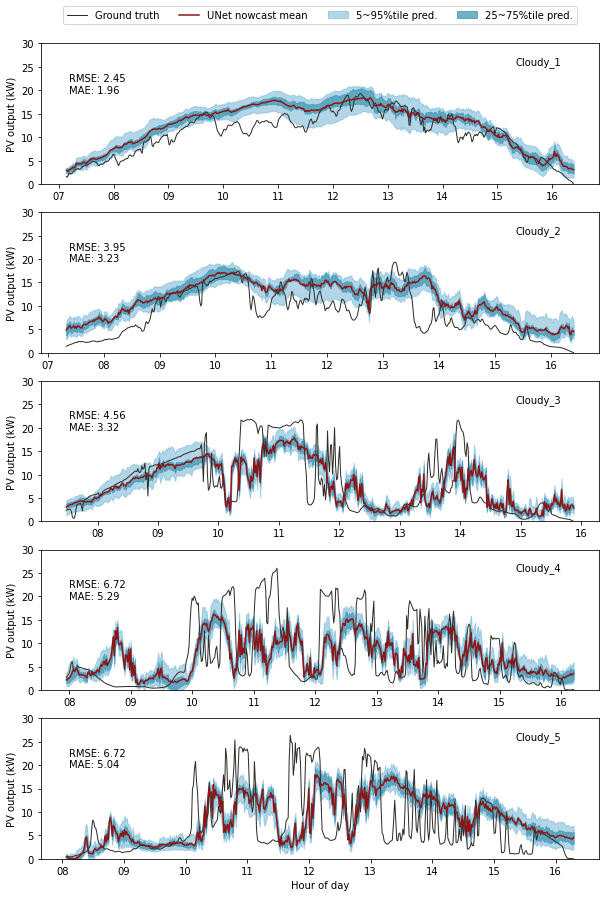

In [36]:
# visualization of forecast predictions
dates_test = np.array([dtinfo.date() for dtinfo in times_test])
hours_test = np.array([dtinfo.time() for dtinfo in times_test])

f,axarr = plt.subplots(5,1,sharex=False, sharey = True)
xfmt = mdates.DateFormatter('%H')
fmt_date = datetime.date(2000,1,1)

green = '#8AB8A7'
red = '#8C1515'
blue = '#67AFD2'
grey =  '#B6B1A9'
black = '#2E2D29'
red = '#8C1515'
light_blue = '#67AFD2'
dark_blue = '#016895'
blue = '#4298B5'
black = '#2E2D29'
dark_red = '#820000'
light_red = '#B83A4B'

for i,date in enumerate(cloudy_dates_test):
    ax = axarr[i]
    date_mask = (dates_test == date)
    hours_xaxis= [datetime.datetime.combine(fmt_date, hour) for hour in hours_test[date_mask]] 
    
    rmse = np.sqrt(np.mean(np.square((pv_log_test[date_mask]-prediction_ensemble[date_mask]))))
    mae = np.mean(np.abs((pv_log_test[date_mask]-prediction_ensemble[date_mask])))
    #per_rmse = np.sqrt(np.mean(np.square((pv_log_test[date_mask]-per_prediction_ensemble[date_mask]))))
    #fs = (1 - rmse/per_rmse)*100
    
    ax.plot(hours_xaxis, pv_log_test[date_mask], linewidth = 1,color=black, label = 'Ground truth')
    #ax.fill_between(hours_xaxis, 0, pv_log_test[date_mask], color=grey, alpha=.2, label = 'Ground truth')
    ax.plot(hours_xaxis, prediction_ensemble[date_mask],linewidth = 1.5,label = 'UNet nowcast mean',color=red,markerfacecolor="None")
    ax.fill_between(hours_xaxis, percent5_prediction[date_mask], percent95_prediction[date_mask], color=light_blue, alpha=0.5, label = '5~95%tile pred.')
    ax.fill_between(hours_xaxis, percent25_prediction[date_mask], percent75_prediction[date_mask], color=blue, alpha=0.75, label = '25~75%tile pred.')
    #for j in range(prediction.shape[0]):
    #    if j==0:
    #        ax.plot(hours_xaxis, prediction[j][date_mask],linewidth = 1,label = 'UNet nowcast',color=red,alpha=0.5,markerfacecolor="None")
    #    else:
    #        ax.plot(hours_xaxis, prediction[j][date_mask],linewidth = 1,color=red,alpha=0.5,markerfacecolor="None")
    #ax.plot(hours_xaxis, per_prediction_ensemble[date_mask],linewidth = 1,label = 'Persistence forecast',color=blue,markerfacecolor="None")
    ax.set_ylabel('PV output (kW)')
    ax.xaxis.set_major_formatter(xfmt)
    ax.text(0.85,0.85,'Cloudy_'+str(i+1), transform=ax.transAxes)
    #ax.text(0.05,0.65,"RMSE: {0:.2f}\nMAE: {1:.2f}\nFS: {2:.2f}%".format(rmse,mae,fs),transform=ax.transAxes)
    ax.text(0.05,0.65,"RMSE: {0:.2f}\nMAE: {1:.2f}".format(rmse,mae),transform=ax.transAxes)

axarr[0].set_ylim(0, 30)
axarr[0].legend(bbox_to_anchor= [.5,1.3], loc = 'upper center', ncol = 4)
axarr[-1].set_xlabel('Hour of day')

f.set_size_inches(10,15)    
#plt.savefig(os.path.join(pardir,'results','unet_nowcast_full_data_trained_2019_test_forecast_with_real_future_image_2.pdf'), bbox_inches='tight',dpi=300)
plt.show()

#### Feeding PhyDNet+GAN Generated Images as Input

In [40]:
cwd = os.getcwd()
pardir = os.path.dirname(os.path.dirname(cwd))
# You should modify the path to where you save your generated images
predicted_image_folder = os.path.join(pardir,'models','PhyDNet','save','PhyDNet_LSGAN_sky_image_dataset_gen_lr_0.001_batch_size_16_model_v2_scheduled_and_reverse_scheduled_sampling_MAE_loss_all_data_v3')
predicted_image = np.load(os.path.join(predicted_image_folder,'predicted_images_new_test_set_2019.npy'),allow_pickle=True)
predicted_image = mask_background(predicted_image)
predicted_image.shape

(2582, 8, 64, 64, 3)

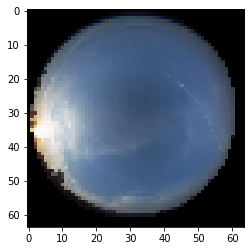

In [41]:
plt.imshow(predicted_image[0,0,:,:,::-1])

In [42]:
# evaluate model on the test set and generate predictions
loss = np.zeros((num_fold,len(times_test)))
prediction = np.zeros((num_fold,len(times_test)))

for i in range(num_fold):
    # define model path
    print("loading repetition {0} model ...".format(i+1))
    model_path = os.path.join(output_folder,'repetition_'+str(i+1),'best_model_repitition_'+str(i+1)+'.h5')
    # load the trained model
    model = keras.models.load_model(model_path)
    
    # model evaluation
    print("evaluating performance for the model".format(i+1))
    loss[i] = model.evaluate(x=predicted_image[:,-1], y=pv_log_test, batch_size=256, verbose=1)
    
    # generate prediction
    print("generating predictions for the model".format(i+1))
    prediction[i] = np.squeeze(model.predict(predicted_image[:,-1], batch_size=256, verbose=1))

# saving predictions from each model
np.save(os.path.join(output_folder,'test_predictions_SkyImageGAN_generated_imgs_as_input_new.npy'),prediction)

# using the ensemble mean of the 10 models as the final prediction 
print('-'*50)
#print("model ensembling ...")
prediction_ensemble = np.mean(prediction,axis=0)
loss_rmse = np.sqrt(np.mean((prediction_ensemble-pv_log_test)**2))
print("the test set RMSE is {0:.3f} for the model".format(loss_rmse))

loading repetition 1 model ...
evaluating performance for the model
11/11 [==============================] - 0s 8ms/step - loss: 31.4136
generating predictions for the model
11/11 [==============================] - 0s 8ms/step
loading repetition 2 model ...
evaluating performance for the model
11/11 [==============================] - 0s 8ms/step - loss: 27.3096
generating predictions for the model
11/11 [==============================] - 0s 8ms/step
loading repetition 3 model ...
evaluating performance for the model
11/11 [==============================] - 0s 8ms/step - loss: 30.8063
generating predictions for the model
11/11 [==============================] - 0s 8ms/step
loading repetition 4 model ...
evaluating performance for the model
11/11 [==============================] - 0s 8ms/step - loss: 31.0836
generating predictions for the model
11/11 [==============================] - 0s 8ms/step
loading repetition 5 model ...
evaluating performance for the model
11/11 [=================

In [43]:
# formulate sunny and cloudy test days
sunny_dates = []
cloudy_dates = [(2019, 11, 12),(2019, 11, 13),(2019, 11, 29),(2019, 12, 8),(2019, 12, 23)]
sunny_dates_test = [datetime.date(day[0],day[1],day[2]) for day in sunny_dates]
cloudy_dates_test = [datetime.date(day[0],day[1],day[2]) for day in cloudy_dates]

dates_test = np.asarray([times.date() for times in times_test])

## generate mask3 for the sunny days
mask3 = np.zeros(len(pv_log_test),dtype=bool)
for i in sunny_dates_test:
    mask3[np.where(dates_test==i)[0]]=1

## apply the mask3 to the dataset
times_test_sunny = times_test[mask3]
#pv_pred_test_sunny = pv_pred_test[mask3]
pv_log_test_sunny = pv_log_test[mask3]
images_log_test_sunny = images_log_test[mask3]
prediction_ensemble_sunny = prediction_ensemble[mask3]
print("times_test_sunny.shape:",times_test_sunny.shape)

times_test_cloudy = times_test[~mask3]
#pv_pred_test_cloudy = pv_pred_test[~mask3]
pv_log_test_cloudy = pv_log_test[~mask3]
images_log_test_cloudy = images_log_test[~mask3]
prediction_ensemble_cloudy = prediction_ensemble[~mask3]
print("times_test_cloudy.shape:",times_test_cloudy.shape)

times_test_sunny.shape: (0,)
times_test_cloudy.shape: (2582,)


In [44]:
## probabilistic eval metrics
# CRPS evaluation
crps = np.zeros(len(times_test))
for i in range(len(times_test)):
    crps[i],_,_ = pscore(prediction[:,i],pv_log_test[i]).compute()
crps_mean = np.mean(crps)
print('The mean crps: {0:.3f}'.format(crps_mean))

The mean crps: 3.018


In [45]:
## probabilistic eval metrics
# Winkler score evaluation
wscore = np.zeros(len(times_test))
for i in range(len(times_test)):
    wscore[i] = compute_winkler_score(prediction[:,i],pv_log_test[i])
wscore_mean = np.mean(wscore)
print('The mean Winkler score: {0:.3f}'.format(wscore_mean))

The mean Winkler score: 39.536


In [46]:
percent25_prediction = np.percentile(prediction,25,axis=0)
percent75_prediction = np.percentile(prediction,75,axis=0)
percent5_prediction = np.percentile(prediction,5,axis=0)
percent95_prediction = np.percentile(prediction,95,axis=0)

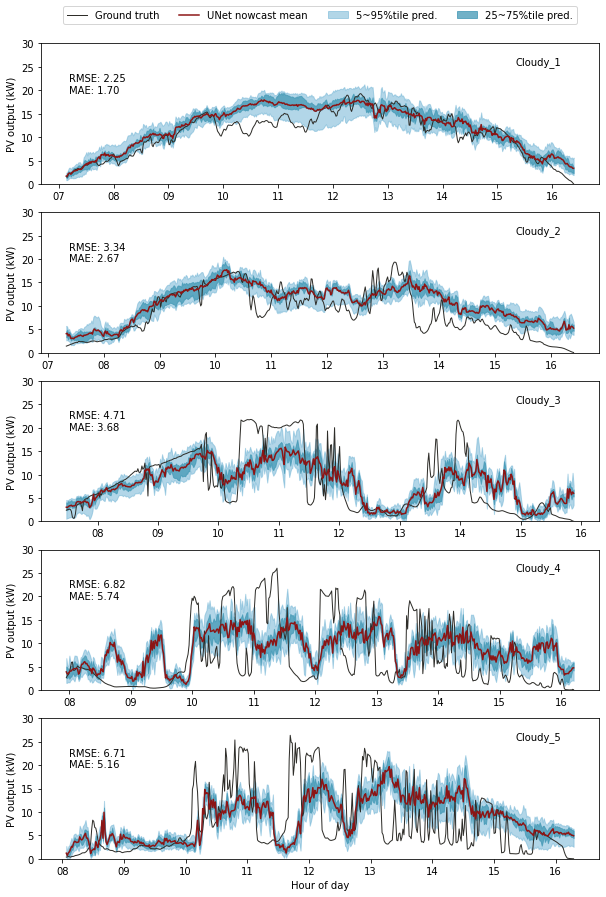

In [47]:
# visualization of forecast predictions
dates_test = np.array([dtinfo.date() for dtinfo in times_test])
hours_test = np.array([dtinfo.time() for dtinfo in times_test])

f,axarr = plt.subplots(5,1,sharex=False, sharey = True)
xfmt = mdates.DateFormatter('%H')
fmt_date = datetime.date(2000,1,1)

green = '#8AB8A7'
red = '#8C1515'
blue = '#67AFD2'
grey =  '#B6B1A9'
black = '#2E2D29'
red = '#8C1515'
light_blue = '#67AFD2'
dark_blue = '#016895'
blue = '#4298B5'
black = '#2E2D29'
dark_red = '#820000'
light_red = '#B83A4B'

for i,date in enumerate(cloudy_dates_test):
    ax = axarr[i]
    date_mask = (dates_test == date)
    hours_xaxis= [datetime.datetime.combine(fmt_date, hour) for hour in hours_test[date_mask]] 
    
    rmse = np.sqrt(np.mean(np.square((pv_log_test[date_mask]-prediction_ensemble[date_mask]))))
    mae = np.mean(np.abs((pv_log_test[date_mask]-prediction_ensemble[date_mask])))
    #per_rmse = np.sqrt(np.mean(np.square((pv_log_test[date_mask]-per_prediction_ensemble[date_mask]))))
    #fs = (1 - rmse/per_rmse)*100
    
    ax.plot(hours_xaxis, pv_log_test[date_mask], linewidth = 1,color=black, label = 'Ground truth')
    #ax.fill_between(hours_xaxis, 0, pv_log_test[date_mask], color=grey, alpha=.2, label = 'Ground truth')
    ax.plot(hours_xaxis, prediction_ensemble[date_mask],linewidth = 1.5,label = 'UNet nowcast mean',color=red,markerfacecolor="None")
    ax.fill_between(hours_xaxis, percent5_prediction[date_mask], percent95_prediction[date_mask], color=light_blue, alpha=0.5, label = '5~95%tile pred.')
    ax.fill_between(hours_xaxis, percent25_prediction[date_mask], percent75_prediction[date_mask], color=blue, alpha=0.75, label = '25~75%tile pred.')
    #for j in range(prediction.shape[0]):
    #    if j==0:
    #        ax.plot(hours_xaxis, prediction[j][date_mask],linewidth = 1,label = 'UNet nowcast',color=red,alpha=0.5,markerfacecolor="None")
    #    else:
    #        ax.plot(hours_xaxis, prediction[j][date_mask],linewidth = 1,color=red,alpha=0.5,markerfacecolor="None")
    #ax.plot(hours_xaxis, per_prediction_ensemble[date_mask],linewidth = 1,label = 'Persistence forecast',color=blue,markerfacecolor="None")
    ax.set_ylabel('PV output (kW)')
    ax.xaxis.set_major_formatter(xfmt)
    ax.text(0.85,0.85,'Cloudy_'+str(i+1), transform=ax.transAxes)
    #ax.text(0.05,0.65,"RMSE: {0:.2f}\nMAE: {1:.2f}\nFS: {2:.2f}%".format(rmse,mae,fs),transform=ax.transAxes)
    ax.text(0.05,0.65,"RMSE: {0:.2f}\nMAE: {1:.2f}".format(rmse,mae),transform=ax.transAxes)

axarr[0].set_ylim(0, 30)
axarr[0].legend(bbox_to_anchor= [.5,1.3], loc = 'upper center', ncol = 4)
axarr[-1].set_xlabel('Hour of day')

f.set_size_inches(10,15)    
#plt.savefig(os.path.join(pardir,'results','unet_nowcast_full_data_trained_2019_test_forecast_with_real_future_image_2.pdf'), bbox_inches='tight',dpi=300)
plt.show()

#### Feeding VideoGPT Generated Images as Input

We experiment with different number of futures generated, ranging from 1 future to 50 different futures

In [123]:
cwd = os.getcwd()
pardir = os.path.dirname(os.path.dirname(cwd))
# You should modify the path to where you save your generated images
predicted_image_folder = os.path.join(pardir,'models','VideoGPT','inference','VideoGPT_2019_test')

In [11]:
num_samplings = 50
# evaluate model on the test set and generate predictions
loss = np.zeros((num_fold,num_samplings,len(times_test)))
prediction = np.zeros((num_fold,num_samplings,len(times_test)))

for i in range(num_fold):
    # define model path
    print("loading repetition {0} model ...".format(i+1))
    model_path = os.path.join(output_folder,'repetition_'+str(i+1),'best_model_repitition_'+str(i+1)+'.h5')
    # load the trained model
    model = keras.models.load_model(model_path)

    for j in range(num_samplings):
        print('generating predictions for sample {0} ...'.format(j+1))
        # load predicted image samples
        predicted_image = np.load(os.path.join(predicted_image_folder,'sample_'+str(j)+'.npy'),allow_pickle=True)
        print(np.min(predicted_image))
        print(np.max(predicted_image))
        predicted_image = mask_background(predicted_image)
        
        # model evaluation
        #print("evaluating performance for the model")
        loss[i,j] = model.evaluate(x=predicted_image[:,-1], y=pv_log_test, batch_size=200, verbose=1)

        # generate prediction
        #print("generating predictions for the model")
        prediction[i,j] = np.squeeze(model.predict(predicted_image[:,-1], batch_size=200, verbose=1))

# saving predictions from each model
np.save(os.path.join(output_folder,'test_predictions_VideoGPT_generated_imgs_as_input_new.npy'),prediction)

loading repetition 1 model ...
generating predictions for sample 1 ...
13/13 [==============================] - 0s 7ms/step
generating predictions for sample 2 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 3 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 4 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 5 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 6 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 7 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 8 ...
13/13 [==============================] - 0s 11ms/step
generating predictions for sample 9 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 10 ...
13/13 [==============================] - 0s 11ms/step
generating predictions for sample 11

generating predictions for sample 1 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 2 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 3 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 4 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 5 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 6 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 7 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 8 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 9 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 10 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 11 ...
13/13 [=====================

13/13 [==============================] - 0s 8ms/step
generating predictions for sample 2 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 3 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 4 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 5 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 6 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 7 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 8 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 9 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 10 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 11 ...
13/13 [==============================] - 0s 8ms/step
generating pred

13/13 [==============================] - 0s 8ms/step
generating predictions for sample 2 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 3 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 4 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 5 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 6 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 7 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 8 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 9 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 10 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 11 ...
13/13 [==============================] - 0s 8ms/step
generating pred

13/13 [==============================] - 0s 8ms/step
generating predictions for sample 2 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 3 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 4 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 5 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 6 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 7 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 8 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 9 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 10 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 11 ...
13/13 [==============================] - 0s 8ms/step
generating pred

13/13 [==============================] - 0s 8ms/step
generating predictions for sample 2 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 3 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 4 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 5 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 6 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 7 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 8 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 9 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 10 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 11 ...
13/13 [==============================] - 0s 8ms/step
generating pred

13/13 [==============================] - 0s 8ms/step
generating predictions for sample 2 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 3 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 4 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 5 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 6 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 7 ...
13/13 [==============================] - 0s 11ms/step
generating predictions for sample 8 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 9 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 10 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 11 ...
13/13 [==============================] - 0s 8ms/step
generating pre

13/13 [==============================] - 0s 8ms/step
generating predictions for sample 2 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 3 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 4 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 5 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 6 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 7 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 8 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 9 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 10 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 11 ...
13/13 [==============================] - 0s 8ms/step
generating pred

13/13 [==============================] - 0s 8ms/step
generating predictions for sample 2 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 3 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 4 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 5 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 6 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 7 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 8 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 9 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 10 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 11 ...
13/13 [==============================] - 0s 8ms/step
generating pred

13/13 [==============================] - 0s 8ms/step
generating predictions for sample 2 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 3 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 4 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 5 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 6 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 7 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 8 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 9 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 10 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 11 ...
13/13 [==============================] - 0s 8ms/step
generating pred

##### Use 1 samplings

In [12]:
# load testing data
cwd = os.getcwd()
pardir = os.path.dirname(os.path.dirname(cwd))
data_folder = os.path.join(pardir,"data")
test_data_path = os.path.join(data_folder,'test_set_2019nov_dec.hdf5')
times_test = np.load(os.path.join(data_folder,"times_curr_test_2019nov_dec.npy"),allow_pickle=True)
print("times_test.shape:", times_test.shape)

with h5py.File(test_data_path,'r') as f:

    # read in the data
    pv_log_test = f['test']['pv_pred'][:,-1]

print("pv_log_test.shape:",pv_log_test.shape)

times_test.shape: (2582,)
pv_log_test.shape: (2582,)


In [13]:
prediction = np.load(os.path.join(output_folder,'test_predictions_VideoGPT_generated_imgs_as_input_new.npy'))
prediction.shape

(10, 50, 2582)

In [14]:
use_samp_no = 1
prediction_samp = prediction[:,:use_samp_no,:]
prediction_samp = prediction_samp.reshape(-1,prediction_samp.shape[-1])
prediction_samp.shape

(10, 2582)

In [15]:
# Deterministic performance
# calculate RMSE based on ensemble mean of 10 submodels and 1 sampling
prediction_samp_ensemble = np.mean(prediction_samp,axis=0)
loss_rmse_10samp = np.sqrt(np.mean((prediction_samp_ensemble-pv_log_test)**2))
print("the test set RMSE is {0:.3f} averaged over 1 samplings for all sub-models".format(loss_rmse_10samp))

the test set RMSE is 5.720 averaged over 1 samplings for all sub-models


In [16]:
## probabilistic eval metrics
# CRPS evaluation
crps = np.zeros(len(times_test))
for i in range(len(times_test)):
    crps[i],_,_ = pscore(prediction_samp[:,i],pv_log_test[i]).compute()
crps_mean = np.mean(crps)
print('The mean crps: {0:.3f}'.format(crps_mean))

The mean crps: 3.741


In [17]:
## probabilistic eval metrics
# Winkler score evaluation
wscore = np.zeros(len(times_test))
for i in range(len(times_test)):
    wscore[i] = compute_winkler_score(prediction_samp[:,i],pv_log_test[i])
wscore_mean = np.mean(wscore)
print('The mean Winkler score: {0:.3f}'.format(wscore_mean))

The mean Winkler score: 53.253


In [18]:
percent25_prediction_samp = np.percentile(prediction_samp,25,axis=0)
percent75_prediction_samp = np.percentile(prediction_samp,75,axis=0)
percent5_prediction_samp = np.percentile(prediction_samp,5,axis=0)
percent95_prediction_samp = np.percentile(prediction_samp,95,axis=0)
percent50_prediction_samp = np.percentile(prediction_samp,50,axis=0)
mean_prediction_samp = np.mean(prediction_samp,axis=0)

In [20]:
# formulate sunny and cloudy test days
sunny_dates = []
cloudy_dates = [(2019, 11, 12),(2019, 11, 13),(2019, 11, 29),(2019, 12, 8),(2019, 12, 23)]
sunny_dates_test = [datetime.date(day[0],day[1],day[2]) for day in sunny_dates]
cloudy_dates_test = [datetime.date(day[0],day[1],day[2]) for day in cloudy_dates]

dates_test = np.asarray([times.date() for times in times_test])

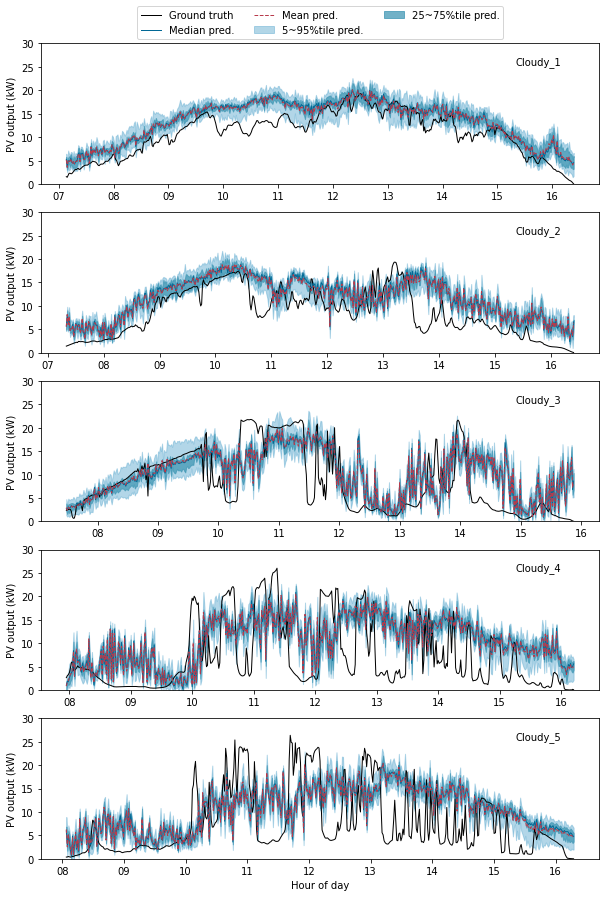

In [21]:
# visualization of forecast prediction_samps
dates_test = np.array([dtinfo.date() for dtinfo in times_test])
hours_test = np.array([dtinfo.time() for dtinfo in times_test])

f,axarr = plt.subplots(5,1,sharex=False, sharey = True)
xfmt = mdates.DateFormatter('%H')
fmt_date = datetime.date(2000,1,1)

green = '#8AB8A7'
red = '#B83A4B'
light_blue = '#67AFD2'
dark_blue = '#016895'
blue = '#4298B5'
grey =  '#B6B1A9'

for i,date in enumerate(cloudy_dates_test):
    ax = axarr[i]
    date_mask = (dates_test == date)
    hours_xaxis= [datetime.datetime.combine(fmt_date, hour) for hour in hours_test[date_mask]]
    
    ax.plot(hours_xaxis, pv_log_test[date_mask], linewidth = 1,color='k', label = 'Ground truth')
    ax.fill_between(hours_xaxis, percent5_prediction_samp[date_mask], percent95_prediction_samp[date_mask], color=light_blue, alpha=0.5, label = '5~95%tile pred.')
    ax.fill_between(hours_xaxis, percent25_prediction_samp[date_mask], percent75_prediction_samp[date_mask], color=blue, alpha=0.75, label = '25~75%tile pred.')
    ax.plot(hours_xaxis, percent50_prediction_samp[date_mask],linewidth = 1,label = 'Median pred.',color=dark_blue,alpha=1, markerfacecolor="None")
    ax.plot(hours_xaxis, mean_prediction_samp[date_mask],'--',linewidth = 1, label = 'Mean pred.',color=red,alpha=1, markerfacecolor="None")
    ax.set_ylabel('PV output (kW)')
    ax.xaxis.set_major_formatter(xfmt)
    ax.text(0.85,0.85,'Cloudy_'+str(i+1), transform=ax.transAxes)

axarr[0].set_ylim(0, 30)
axarr[0].legend(bbox_to_anchor= [.5,1.3], loc = 'upper center', ncol = 3)
axarr[-1].set_xlabel('Hour of day')

f.set_size_inches(10,15)    
plt.show()

##### Use 5 samplings

In [22]:
prediction = np.load(os.path.join(output_folder,'test_predictions_VideoGPT_generated_imgs_as_input_new.npy'))
prediction.shape

(10, 50, 2582)

In [23]:
use_samp_no = 5
prediction_samp = prediction[:,:use_samp_no,:]
prediction_samp = prediction_samp.reshape(-1,prediction_samp.shape[-1])
prediction_samp.shape

(50, 2582)

In [24]:
# Deterministic performance
# calculate RMSE based on ensemble mean of 10 submodels and 10 samplings
prediction_samp_ensemble = np.mean(prediction_samp,axis=0)
loss_rmse_5samp = np.sqrt(np.mean((prediction_samp_ensemble-pv_log_test)**2))
print("the test set RMSE is {0:.3f} averaged over 5 samplings for all sub-models".format(loss_rmse_5samp))

the test set RMSE is 5.465 averaged over 5 samplings for all sub-models


In [25]:
## probabilistic eval metrics
# CRPS evaluation
crps = np.zeros(len(times_test))
for i in range(len(times_test)):
    crps[i],_,_ = pscore(prediction_samp[:,i],pv_log_test[i]).compute()
crps_mean = np.mean(crps)
print('The mean crps: {0:.3f}'.format(crps_mean))

The mean crps: 3.374


In [26]:
## probabilistic eval metrics
# Winkler score evaluation
wscore = np.zeros(len(times_test))
for i in range(len(times_test)):
    wscore[i] = compute_winkler_score(prediction_samp[:,i],pv_log_test[i])
wscore_mean = np.mean(wscore)
print('The mean Winkler score: {0:.3f}'.format(wscore_mean))

The mean Winkler score: 38.277


In [27]:
percent25_prediction_samp = np.percentile(prediction_samp,25,axis=0)
percent75_prediction_samp = np.percentile(prediction_samp,75,axis=0)
percent5_prediction_samp = np.percentile(prediction_samp,5,axis=0)
percent95_prediction_samp = np.percentile(prediction_samp,95,axis=0)
percent50_prediction_samp = np.percentile(prediction_samp,50,axis=0)
mean_prediction_samp = np.mean(prediction_samp,axis=0)

In [28]:
percent5_prediction_samp.shape

(2582,)

In [29]:
# formulate sunny and cloudy test days
sunny_dates = []
cloudy_dates = [(2019, 11, 12),(2019, 11, 13),(2019, 11, 29),(2019, 12, 8),(2019, 12, 23)]
sunny_dates_test = [datetime.date(day[0],day[1],day[2]) for day in sunny_dates]
cloudy_dates_test = [datetime.date(day[0],day[1],day[2]) for day in cloudy_dates]

dates_test = np.asarray([times.date() for times in times_test])

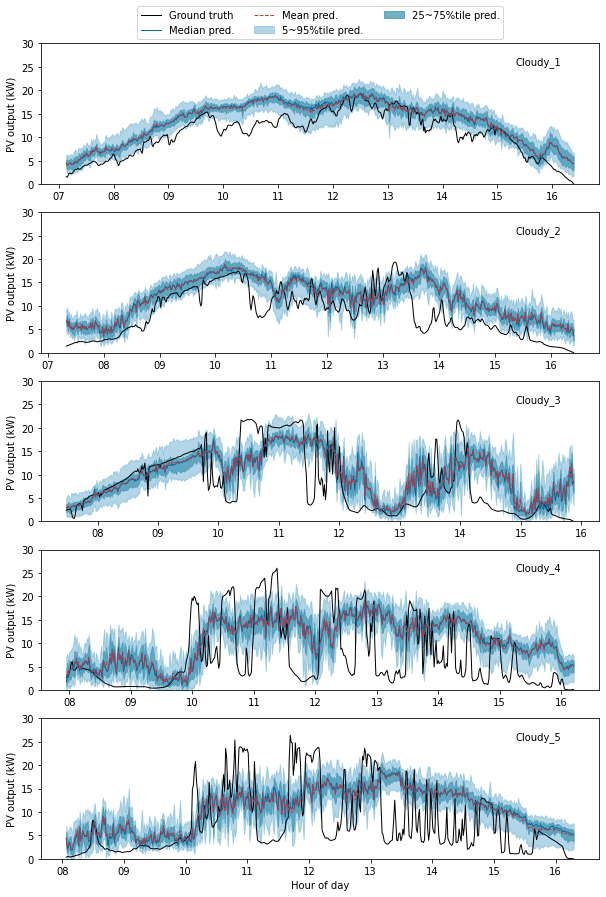

In [30]:
# visualization of forecast prediction_samps
dates_test = np.array([dtinfo.date() for dtinfo in times_test])
hours_test = np.array([dtinfo.time() for dtinfo in times_test])

f,axarr = plt.subplots(5,1,sharex=False, sharey = True)
xfmt = mdates.DateFormatter('%H')
fmt_date = datetime.date(2000,1,1)

green = '#8AB8A7'
red = '#B83A4B'
light_blue = '#67AFD2'
dark_blue = '#016895'
blue = '#4298B5'
grey =  '#B6B1A9'

for i,date in enumerate(cloudy_dates_test):
    ax = axarr[i]
    date_mask = (dates_test == date)
    hours_xaxis= [datetime.datetime.combine(fmt_date, hour) for hour in hours_test[date_mask]] 
    
    ax.plot(hours_xaxis, pv_log_test[date_mask], linewidth = 1,color='k', label = 'Ground truth')
    ax.fill_between(hours_xaxis, percent5_prediction_samp[date_mask], percent95_prediction_samp[date_mask], color=light_blue, alpha=0.5, label = '5~95%tile pred.')
    ax.fill_between(hours_xaxis, percent25_prediction_samp[date_mask], percent75_prediction_samp[date_mask], color=blue, alpha=0.75, label = '25~75%tile pred.')
    ax.plot(hours_xaxis, percent50_prediction_samp[date_mask],linewidth = 1,label = 'Median pred.',color=dark_blue,alpha=1, markerfacecolor="None")
    ax.plot(hours_xaxis, mean_prediction_samp[date_mask],'--',linewidth = 1, label = 'Mean pred.',color=red,alpha=1, markerfacecolor="None")
    ax.set_ylabel('PV output (kW)')
    ax.xaxis.set_major_formatter(xfmt)
    ax.text(0.85,0.85,'Cloudy_'+str(i+1), transform=ax.transAxes)

axarr[0].set_ylim(0, 30)
axarr[0].legend(bbox_to_anchor= [.5,1.3], loc = 'upper center', ncol = 3)
axarr[-1].set_xlabel('Hour of day')

f.set_size_inches(10,15) 
plt.show()

##### Use 10 samplings

In [31]:
use_samp_no = 10
prediction_samp = prediction[:,:use_samp_no,:]
prediction_samp = prediction_samp.reshape(-1,prediction_samp.shape[-1])
prediction_samp.shape

(100, 2582)

In [32]:
# Deterministic performance
# calculate RMSE based on ensemble mean of 10 submodels and 10 samplings
prediction_samp_ensemble = np.mean(prediction_samp,axis=0)
loss_rmse_10samp = np.sqrt(np.mean((prediction_samp_ensemble-pv_log_test)**2))
print("the test set RMSE is {0:.3f} averaged over 10 samplings for all sub-models".format(loss_rmse_10samp))

the test set RMSE is 5.447 averaged over 10 samplings for all sub-models


In [33]:
## probabilistic eval metrics
# CRPS evaluation
crps = np.zeros(len(times_test))
for i in range(len(times_test)):
    crps[i],_,_ = pscore(prediction_samp[:,i],pv_log_test[i]).compute()
crps_mean = np.mean(crps)
print('The mean crps: {0:.3f}'.format(crps_mean))

The mean crps: 3.338


In [34]:
## probabilistic eval metrics
# Winkler score evaluation
wscore = np.zeros(len(times_test))
for i in range(len(times_test)):
    wscore[i] = compute_winkler_score(prediction_samp[:,i],pv_log_test[i])
wscore_mean = np.mean(wscore)
print('The mean Winkler score: {0:.3f}'.format(wscore_mean))

The mean Winkler score: 36.223


In [35]:
percent25_prediction_samp = np.percentile(prediction_samp,25,axis=0)
percent75_prediction_samp = np.percentile(prediction_samp,75,axis=0)
percent5_prediction_samp = np.percentile(prediction_samp,5,axis=0)
percent95_prediction_samp = np.percentile(prediction_samp,95,axis=0)
percent50_prediction_samp = np.percentile(prediction_samp,50,axis=0)
mean_prediction_samp = np.mean(prediction_samp,axis=0)

In [36]:
percent5_prediction_samp.shape

(2582,)

In [37]:
# formulate sunny and cloudy test days
sunny_dates = []
cloudy_dates = [(2019, 11, 12),(2019, 11, 13),(2019, 11, 29),(2019, 12, 8),(2019, 12, 23)]
sunny_dates_test = [datetime.date(day[0],day[1],day[2]) for day in sunny_dates]
cloudy_dates_test = [datetime.date(day[0],day[1],day[2]) for day in cloudy_dates]

dates_test = np.asarray([times.date() for times in times_test])

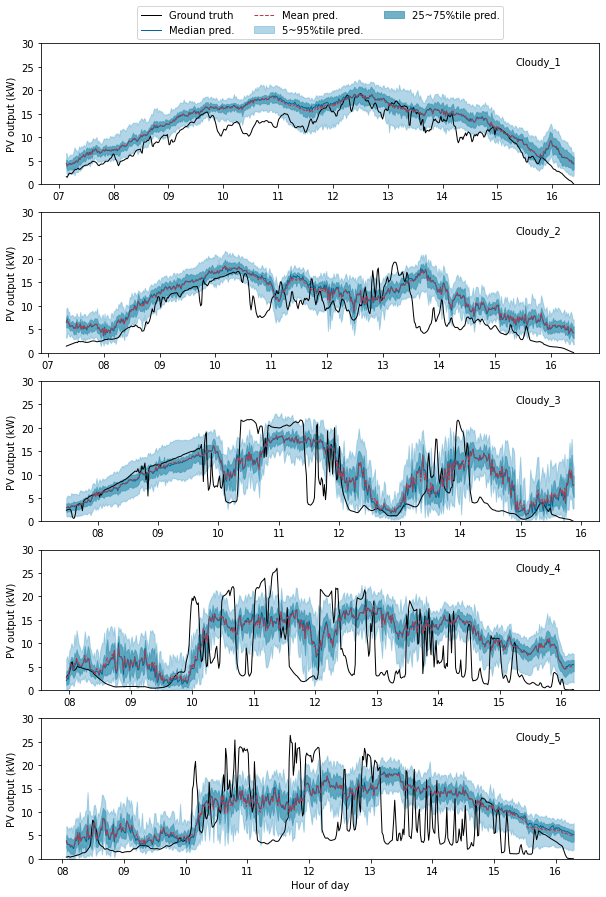

In [38]:
# visualization of forecast prediction_samps
dates_test = np.array([dtinfo.date() for dtinfo in times_test])
hours_test = np.array([dtinfo.time() for dtinfo in times_test])

f,axarr = plt.subplots(5,1,sharex=False, sharey = True)
xfmt = mdates.DateFormatter('%H')
fmt_date = datetime.date(2000,1,1)

green = '#8AB8A7'
red = '#B83A4B'
light_blue = '#67AFD2'
dark_blue = '#016895'
blue = '#4298B5'
grey =  '#B6B1A9'

for i,date in enumerate(cloudy_dates_test):
    ax = axarr[i]
    date_mask = (dates_test == date)
    hours_xaxis= [datetime.datetime.combine(fmt_date, hour) for hour in hours_test[date_mask]] 

    
    ax.plot(hours_xaxis, pv_log_test[date_mask], linewidth = 1,color='k', label = 'Ground truth')
    ax.fill_between(hours_xaxis, percent5_prediction_samp[date_mask], percent95_prediction_samp[date_mask], color=light_blue, alpha=0.5, label = '5~95%tile pred.')
    ax.fill_between(hours_xaxis, percent25_prediction_samp[date_mask], percent75_prediction_samp[date_mask], color=blue, alpha=0.75, label = '25~75%tile pred.')
    ax.plot(hours_xaxis, percent50_prediction_samp[date_mask],linewidth = 1,label = 'Median pred.',color=dark_blue,alpha=1, markerfacecolor="None")
    ax.plot(hours_xaxis, mean_prediction_samp[date_mask],'--',linewidth = 1, label = 'Mean pred.',color=red,alpha=1, markerfacecolor="None")
    ax.set_ylabel('PV output (kW)')
    ax.xaxis.set_major_formatter(xfmt)
    ax.text(0.85,0.85,'Cloudy_'+str(i+1), transform=ax.transAxes)

axarr[0].set_ylim(0, 30)
axarr[0].legend(bbox_to_anchor= [.5,1.3], loc = 'upper center', ncol = 3)
axarr[-1].set_xlabel('Hour of day')

f.set_size_inches(10,15)    
plt.show()

##### Use 20 samplings

In [39]:
use_samp_no = 20
prediction_samp = prediction[:,:use_samp_no,:]
prediction_samp = prediction_samp.reshape(-1,prediction_samp.shape[-1])
prediction_samp.shape

(200, 2582)

In [40]:
# Deterministic performance
# calculate RMSE based on ensemble mean of 10 submodels and 10 samplings
prediction_samp_ensemble = np.mean(prediction_samp,axis=0)
loss_rmse_10samp = np.sqrt(np.mean((prediction_samp_ensemble-pv_log_test)**2))
print("the test set RMSE is {0:.3f} averaged over {1} samplings for all sub-models".format(loss_rmse_10samp,use_samp_no))

the test set RMSE is 5.447 averaged over 20 samplings for all sub-models


In [41]:
## probabilistic eval metrics
# CRPS evaluation
crps = np.zeros(len(times_test))
for i in range(len(times_test)):
    crps[i],_,_ = pscore(prediction_samp[:,i],pv_log_test[i]).compute()
crps_mean = np.mean(crps)
print('The mean crps: {0:.3f}'.format(crps_mean))

The mean crps: 3.330


In [42]:
## probabilistic eval metrics
# Winkler score evaluation
wscore = np.zeros(len(times_test))
for i in range(len(times_test)):
    wscore[i] = compute_winkler_score(prediction_samp[:,i],pv_log_test[i])
wscore_mean = np.mean(wscore)
print('The mean Winkler score: {0:.3f}'.format(wscore_mean))

The mean Winkler score: 35.162


In [43]:
percent25_prediction_samp = np.percentile(prediction_samp,25,axis=0)
percent75_prediction_samp = np.percentile(prediction_samp,75,axis=0)
percent5_prediction_samp = np.percentile(prediction_samp,5,axis=0)
percent95_prediction_samp = np.percentile(prediction_samp,95,axis=0)
percent50_prediction_samp = np.percentile(prediction_samp,50,axis=0)
mean_prediction_samp = np.mean(prediction_samp,axis=0)

In [44]:
# formulate sunny and cloudy test days
sunny_dates = []
cloudy_dates = [(2019, 11, 12),(2019, 11, 13),(2019, 11, 29),(2019, 12, 8),(2019, 12, 23)]
sunny_dates_test = [datetime.date(day[0],day[1],day[2]) for day in sunny_dates]
cloudy_dates_test = [datetime.date(day[0],day[1],day[2]) for day in cloudy_dates]

dates_test = np.asarray([times.date() for times in times_test])

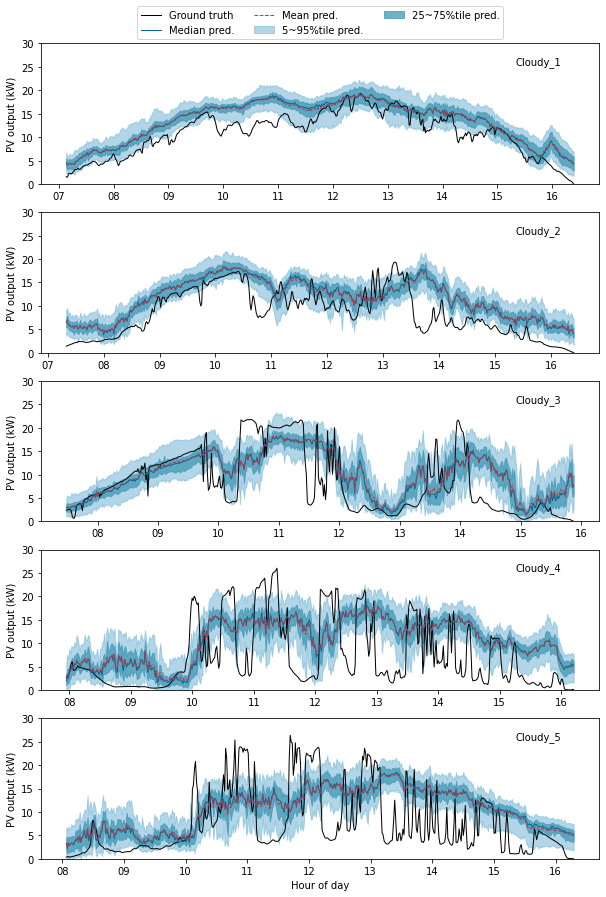

In [45]:
# visualization of forecast prediction_samps
dates_test = np.array([dtinfo.date() for dtinfo in times_test])
hours_test = np.array([dtinfo.time() for dtinfo in times_test])

f,axarr = plt.subplots(5,1,sharex=False, sharey = True)
xfmt = mdates.DateFormatter('%H')
fmt_date = datetime.date(2000,1,1)

green = '#8AB8A7'
red = '#B83A4B'
light_blue = '#67AFD2'
dark_blue = '#016895'
blue = '#4298B5'
grey =  '#B6B1A9'

for i,date in enumerate(cloudy_dates_test):
    ax = axarr[i]
    date_mask = (dates_test == date)
    hours_xaxis= [datetime.datetime.combine(fmt_date, hour) for hour in hours_test[date_mask]] 
    
    ax.plot(hours_xaxis, pv_log_test[date_mask], linewidth = 1,color='k', label = 'Ground truth')
    ax.fill_between(hours_xaxis, percent5_prediction_samp[date_mask], percent95_prediction_samp[date_mask], color=light_blue, alpha=0.5, label = '5~95%tile pred.')
    ax.fill_between(hours_xaxis, percent25_prediction_samp[date_mask], percent75_prediction_samp[date_mask], color=blue, alpha=0.75, label = '25~75%tile pred.')
    ax.plot(hours_xaxis, percent50_prediction_samp[date_mask],linewidth = 1,label = 'Median pred.',color=dark_blue,alpha=1, markerfacecolor="None")
    ax.plot(hours_xaxis, mean_prediction_samp[date_mask],'--',linewidth = 1, label = 'Mean pred.',color=red,alpha=1, markerfacecolor="None")
    ax.set_ylabel('PV output (kW)')
    ax.xaxis.set_major_formatter(xfmt)
    ax.text(0.85,0.85,'Cloudy_'+str(i+1), transform=ax.transAxes)

axarr[0].set_ylim(0, 30)
axarr[0].legend(bbox_to_anchor= [.5,1.3], loc = 'upper center', ncol = 3)
axarr[-1].set_xlabel('Hour of day')

f.set_size_inches(10,15)    
plt.show()

##### Use 30 samplings

In [46]:
use_samp_no = 30
prediction_samp = prediction[:,:use_samp_no,:]
prediction_samp = prediction_samp.reshape(-1,prediction_samp.shape[-1])
prediction_samp.shape

(300, 2582)

In [47]:
# Deterministic performance
# calculate RMSE based on ensemble mean of 10 submodels and 10 samplings
prediction_samp_ensemble = np.mean(prediction_samp,axis=0)
loss_rmse_10samp = np.sqrt(np.mean((prediction_samp_ensemble-pv_log_test)**2))
print("the test set RMSE is {0:.3f} averaged over {1} samplings for all sub-models".format(loss_rmse_10samp,use_samp_no))

the test set RMSE is 5.432 averaged over 30 samplings for all sub-models


In [48]:
## probabilistic eval metrics
# CRPS evaluation
crps = np.zeros(len(times_test))
for i in range(len(times_test)):
    crps[i],_,_ = pscore(prediction_samp[:,i],pv_log_test[i]).compute()
crps_mean = np.mean(crps)
print('The mean crps: {0:.3f}'.format(crps_mean))

The mean crps: 3.318


In [49]:
## probabilistic eval metrics
# Winkler score evaluation
wscore = np.zeros(len(times_test))
for i in range(len(times_test)):
    wscore[i] = compute_winkler_score(prediction_samp[:,i],pv_log_test[i])
wscore_mean = np.mean(wscore)
print('The mean Winkler score: {0:.3f}'.format(wscore_mean))

The mean Winkler score: 34.824


In [50]:
percent25_prediction_samp = np.percentile(prediction_samp,25,axis=0)
percent75_prediction_samp = np.percentile(prediction_samp,75,axis=0)
percent5_prediction_samp = np.percentile(prediction_samp,5,axis=0)
percent95_prediction_samp = np.percentile(prediction_samp,95,axis=0)
percent50_prediction_samp = np.percentile(prediction_samp,50,axis=0)
mean_prediction_samp = np.mean(prediction_samp,axis=0)

In [51]:
# formulate sunny and cloudy test days
sunny_dates = []
cloudy_dates = [(2019, 11, 12),(2019, 11, 13),(2019, 11, 29),(2019, 12, 8),(2019, 12, 23)]
sunny_dates_test = [datetime.date(day[0],day[1],day[2]) for day in sunny_dates]
cloudy_dates_test = [datetime.date(day[0],day[1],day[2]) for day in cloudy_dates]

dates_test = np.asarray([times.date() for times in times_test])

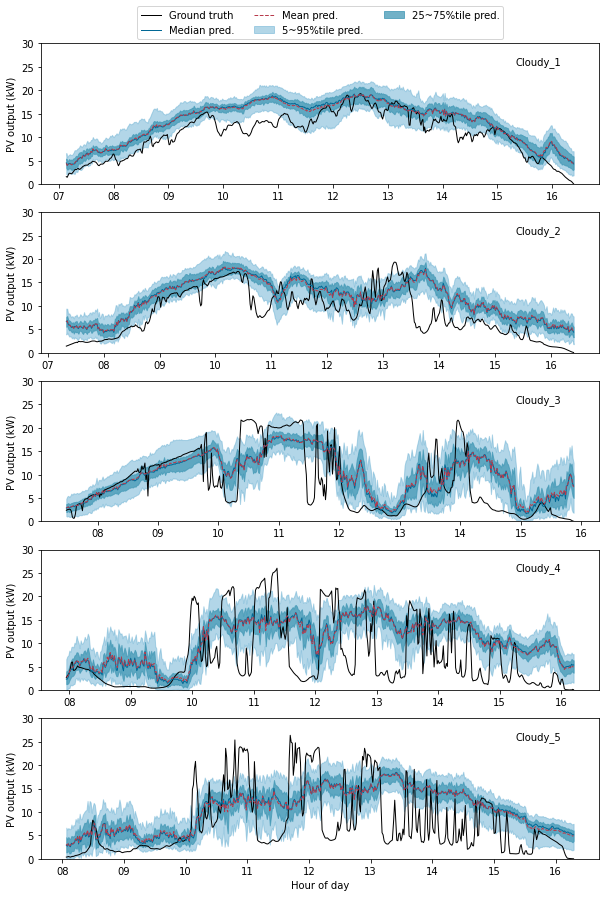

In [52]:
# visualization of forecast prediction_samps
dates_test = np.array([dtinfo.date() for dtinfo in times_test])
hours_test = np.array([dtinfo.time() for dtinfo in times_test])

f,axarr = plt.subplots(5,1,sharex=False, sharey = True)
xfmt = mdates.DateFormatter('%H')
fmt_date = datetime.date(2000,1,1)

green = '#8AB8A7'
red = '#B83A4B'
light_blue = '#67AFD2'
dark_blue = '#016895'
blue = '#4298B5'
grey =  '#B6B1A9'

for i,date in enumerate(cloudy_dates_test):
    ax = axarr[i]
    date_mask = (dates_test == date)
    hours_xaxis= [datetime.datetime.combine(fmt_date, hour) for hour in hours_test[date_mask]] 
    
    ax.plot(hours_xaxis, pv_log_test[date_mask], linewidth = 1,color='k', label = 'Ground truth')
    ax.fill_between(hours_xaxis, percent5_prediction_samp[date_mask], percent95_prediction_samp[date_mask], color=light_blue, alpha=0.5, label = '5~95%tile pred.')
    ax.fill_between(hours_xaxis, percent25_prediction_samp[date_mask], percent75_prediction_samp[date_mask], color=blue, alpha=0.75, label = '25~75%tile pred.')
    ax.plot(hours_xaxis, percent50_prediction_samp[date_mask],linewidth = 1,label = 'Median pred.',color=dark_blue,alpha=1, markerfacecolor="None")
    ax.plot(hours_xaxis, mean_prediction_samp[date_mask],'--',linewidth = 1, label = 'Mean pred.',color=red,alpha=1, markerfacecolor="None")
    ax.set_ylabel('PV output (kW)')
    ax.xaxis.set_major_formatter(xfmt)
    ax.text(0.85,0.85,'Cloudy_'+str(i+1), transform=ax.transAxes)

axarr[0].set_ylim(0, 30)
axarr[0].legend(bbox_to_anchor= [.5,1.3], loc = 'upper center', ncol = 3)
axarr[-1].set_xlabel('Hour of day')

f.set_size_inches(10,15)    
plt.show()

##### Use 40 samplings

In [53]:
use_samp_no = 40
prediction_samp = prediction[:,:use_samp_no,:]
prediction_samp = prediction_samp.reshape(-1,prediction_samp.shape[-1])
prediction_samp.shape

(400, 2582)

In [54]:
# Deterministic performance
# calculate RMSE based on ensemble mean of 10 submodels and 10 samplings
prediction_samp_ensemble = np.mean(prediction_samp,axis=0)
loss_rmse_10samp = np.sqrt(np.mean((prediction_samp_ensemble-pv_log_test)**2))
print("the test set RMSE is {0:.3f} averaged over {1} samplings for all sub-models".format(loss_rmse_10samp,use_samp_no))

the test set RMSE is 5.434 averaged over 40 samplings for all sub-models


In [55]:
## probabilistic eval metrics
# CRPS evaluation
crps = np.zeros(len(times_test))
for i in range(len(times_test)):
    crps[i],_,_ = pscore(prediction_samp[:,i],pv_log_test[i]).compute()
crps_mean = np.mean(crps)
print('The mean crps: {0:.3f}'.format(crps_mean))

The mean crps: 3.317


In [56]:
## probabilistic eval metrics
# Winkler score evaluation
wscore = np.zeros(len(times_test))
for i in range(len(times_test)):
    wscore[i] = compute_winkler_score(prediction_samp[:,i],pv_log_test[i])
wscore_mean = np.mean(wscore)
print('The mean Winkler score: {0:.3f}'.format(wscore_mean))

The mean Winkler score: 34.703


In [57]:
percent25_prediction_samp = np.percentile(prediction_samp,25,axis=0)
percent75_prediction_samp = np.percentile(prediction_samp,75,axis=0)
percent5_prediction_samp = np.percentile(prediction_samp,5,axis=0)
percent95_prediction_samp = np.percentile(prediction_samp,95,axis=0)
percent50_prediction_samp = np.percentile(prediction_samp,50,axis=0)
mean_prediction_samp = np.mean(prediction_samp,axis=0)

In [58]:
# formulate sunny and cloudy test days
sunny_dates = []
cloudy_dates = [(2019, 11, 12),(2019, 11, 13),(2019, 11, 29),(2019, 12, 8),(2019, 12, 23)]
sunny_dates_test = [datetime.date(day[0],day[1],day[2]) for day in sunny_dates]
cloudy_dates_test = [datetime.date(day[0],day[1],day[2]) for day in cloudy_dates]

dates_test = np.asarray([times.date() for times in times_test])

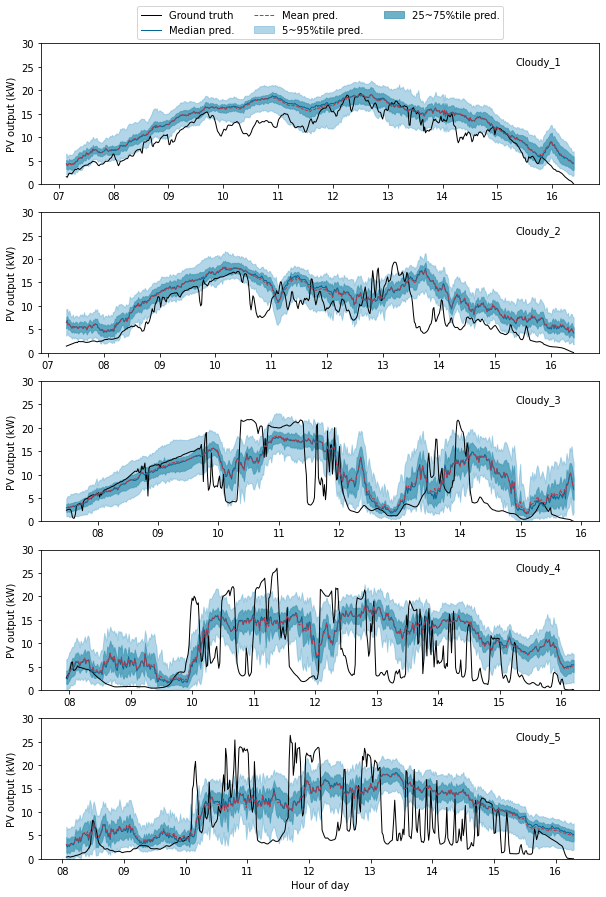

In [59]:
# visualization of forecast prediction_samps
dates_test = np.array([dtinfo.date() for dtinfo in times_test])
hours_test = np.array([dtinfo.time() for dtinfo in times_test])

f,axarr = plt.subplots(5,1,sharex=False, sharey = True)
xfmt = mdates.DateFormatter('%H')
fmt_date = datetime.date(2000,1,1)

green = '#8AB8A7'
red = '#B83A4B'
light_blue = '#67AFD2'
dark_blue = '#016895'
blue = '#4298B5'
grey =  '#B6B1A9'

for i,date in enumerate(cloudy_dates_test):
    ax = axarr[i]
    date_mask = (dates_test == date)
    hours_xaxis= [datetime.datetime.combine(fmt_date, hour) for hour in hours_test[date_mask]] 
    
    ax.plot(hours_xaxis, pv_log_test[date_mask], linewidth = 1,color='k', label = 'Ground truth')
    ax.fill_between(hours_xaxis, percent5_prediction_samp[date_mask], percent95_prediction_samp[date_mask], color=light_blue, alpha=0.5, label = '5~95%tile pred.')
    ax.fill_between(hours_xaxis, percent25_prediction_samp[date_mask], percent75_prediction_samp[date_mask], color=blue, alpha=0.75, label = '25~75%tile pred.')
    ax.plot(hours_xaxis, percent50_prediction_samp[date_mask],linewidth = 1,label = 'Median pred.',color=dark_blue,alpha=1, markerfacecolor="None")
    ax.plot(hours_xaxis, mean_prediction_samp[date_mask],'--',linewidth = 1, label = 'Mean pred.',color=red,alpha=1, markerfacecolor="None")
    ax.set_ylabel('PV output (kW)')
    ax.xaxis.set_major_formatter(xfmt)
    ax.text(0.85,0.85,'Cloudy_'+str(i+1), transform=ax.transAxes)

axarr[0].set_ylim(0, 30)
axarr[0].legend(bbox_to_anchor= [.5,1.3], loc = 'upper center', ncol = 3)
axarr[-1].set_xlabel('Hour of day')

f.set_size_inches(10,15)    
plt.show()

##### Use 50 samplings

In [60]:
use_samp_no = 50
prediction_samp = prediction[:,:use_samp_no,:]
prediction_samp = prediction_samp.reshape(-1,prediction_samp.shape[-1])
prediction_samp.shape

(500, 2582)

In [61]:
# Deterministic performance
# calculate RMSE based on ensemble mean of 10 submodels and 10 samplings
prediction_samp_ensemble = np.mean(prediction_samp,axis=0)
loss_rmse_10samp = np.sqrt(np.mean((prediction_samp_ensemble-pv_log_test)**2))
print("the test set RMSE is {0:.3f} averaged over {1} samplings for all sub-models".format(loss_rmse_10samp,use_samp_no))

the test set RMSE is 5.429 averaged over 50 samplings for all sub-models


In [62]:
## probabilistic eval metrics
# CRPS evaluation
crps = np.zeros(len(times_test))
for i in range(len(times_test)):
    crps[i],_,_ = pscore(prediction_samp[:,i],pv_log_test[i]).compute()
crps_mean = np.mean(crps)
print('The mean crps: {0:.3f}'.format(crps_mean))

The mean crps: 3.313


In [63]:
## probabilistic eval metrics
# Winkler score evaluation
wscore = np.zeros(len(times_test))
for i in range(len(times_test)):
    wscore[i] = compute_winkler_score(prediction_samp[:,i],pv_log_test[i])
wscore_mean = np.mean(wscore)
print('The mean Winkler score: {0:.3f}'.format(wscore_mean))

The mean Winkler score: 34.594


In [64]:
percent25_prediction_samp = np.percentile(prediction_samp,25,axis=0)
percent75_prediction_samp = np.percentile(prediction_samp,75,axis=0)
percent5_prediction_samp = np.percentile(prediction_samp,5,axis=0)
percent95_prediction_samp = np.percentile(prediction_samp,95,axis=0)
percent50_prediction_samp = np.percentile(prediction_samp,50,axis=0)
mean_prediction_samp = np.mean(prediction_samp,axis=0)

In [65]:
# formulate sunny and cloudy test days
sunny_dates = []
cloudy_dates = [(2019, 11, 12),(2019, 11, 13),(2019, 11, 29),(2019, 12, 8),(2019, 12, 23)]
sunny_dates_test = [datetime.date(day[0],day[1],day[2]) for day in sunny_dates]
cloudy_dates_test = [datetime.date(day[0],day[1],day[2]) for day in cloudy_dates]

dates_test = np.asarray([times.date() for times in times_test])

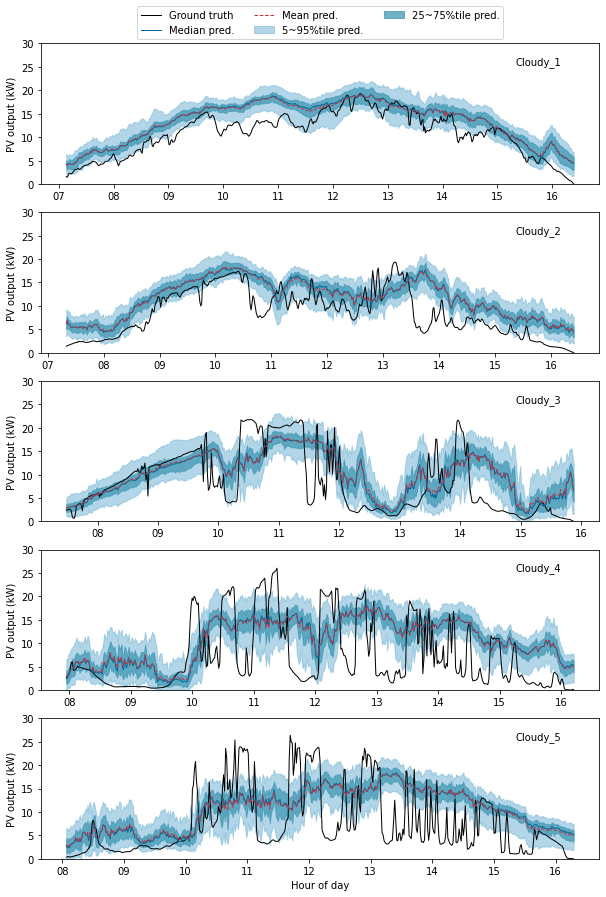

In [66]:
# visualization of forecast prediction_samps
dates_test = np.array([dtinfo.date() for dtinfo in times_test])
hours_test = np.array([dtinfo.time() for dtinfo in times_test])

f,axarr = plt.subplots(5,1,sharex=False, sharey = True)
xfmt = mdates.DateFormatter('%H')
fmt_date = datetime.date(2000,1,1)

green = '#8AB8A7'
red = '#B83A4B'
light_blue = '#67AFD2'
dark_blue = '#016895'
blue = '#4298B5'
grey =  '#B6B1A9'

for i,date in enumerate(cloudy_dates_test):
    ax = axarr[i]
    date_mask = (dates_test == date)
    hours_xaxis= [datetime.datetime.combine(fmt_date, hour) for hour in hours_test[date_mask]] 
    
    ax.plot(hours_xaxis, pv_log_test[date_mask], linewidth = 1,color='k', label = 'Ground truth')
    ax.fill_between(hours_xaxis, percent5_prediction_samp[date_mask], percent95_prediction_samp[date_mask], color=light_blue, alpha=0.5, label = '5~95%tile pred.')
    ax.fill_between(hours_xaxis, percent25_prediction_samp[date_mask], percent75_prediction_samp[date_mask], color=blue, alpha=0.75, label = '25~75%tile pred.')
    ax.plot(hours_xaxis, percent50_prediction_samp[date_mask],linewidth = 1,label = 'Median pred.',color=dark_blue,alpha=1, markerfacecolor="None")
    ax.plot(hours_xaxis, mean_prediction_samp[date_mask],'--',linewidth = 1, label = 'Mean pred.',color=red,alpha=1, markerfacecolor="None")
    ax.set_ylabel('PV output (kW)')
    ax.xaxis.set_major_formatter(xfmt)
    ax.text(0.85,0.85,'Cloudy_'+str(i+1), transform=ax.transAxes)

axarr[0].set_ylim(0, 30)
axarr[0].legend(bbox_to_anchor= [.5,1.3], loc = 'upper center', ncol = 3)
axarr[-1].set_xlabel('Hour of day')

f.set_size_inches(10,15)    
plt.show()

#### Feeding SkyGPT Generated Images as Input

Similarly, we experimented with different number of generated future scenarios, ranging from 1 future to 50 futures.

In [67]:
cwd = os.getcwd()
pardir = os.path.dirname(os.path.dirname(cwd))
# You should modify the path to where you save your generated images
predicted_image_folder = os.path.join(pardir,'models','SkyGPT','inference','SkyGPT_2019_test')

In [68]:
num_samplings = 50
# evaluate model on the test set and generate predictions
loss = np.zeros((num_fold,num_samplings,len(times_test)))
prediction = np.zeros((num_fold,num_samplings,len(times_test)))

for i in range(num_fold):
    # define model path
    print("loading repetition {0} model ...".format(i+1))
    model_path = os.path.join(output_folder,'repetition_'+str(i+1),'best_model_repitition_'+str(i+1)+'.h5')
    # load the trained model
    model = keras.models.load_model(model_path)

    for j in range(num_samplings):
        print('generating predictions for sample {0} ...'.format(j+1))
        # load predicted image samples
        predicted_image = np.load(os.path.join(predicted_image_folder,'sample_'+str(j)+'.npy'),allow_pickle=True)
        
        # scale back all the pixel values back to [0,1] with clipping
        predicted_image = np.clip(predicted_image,-0.5,0.5)+0.5
        predicted_image = mask_background(predicted_image)
        
        # model evaluation
        #print("evaluating performance for the model")
        loss[i,j] = model.evaluate(x=predicted_image[:,-1], y=pv_log_test, batch_size=200, verbose=1)

        # generate prediction
        #print("generating predictions for the model")
        prediction[i,j] = np.squeeze(model.predict(predicted_image[:,-1], batch_size=200, verbose=1))

# saving predictions from each model
np.save(os.path.join(output_folder,'test_predictions_SkyGPT_generated_imgs_as_input_new.npy'),prediction)
    # loss averaged over all samplings for model 1
    #loss_rmse = np.sqrt(np.mean((np.mean(prediction[i],axis=0)-pv_log_test)**2))
    #print("the test set RMSE is {0:.3f} averaged over all samplings for sub-model {1}".format(loss_rmse,i))

loading repetition 1 model ...
generating predictions for sample 1 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 2 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 3 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 4 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 5 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 6 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 7 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 8 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 9 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 10 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 11 .

generating predictions for sample 1 ...
13/13 [==============================] - 1s 8ms/step
generating predictions for sample 2 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 3 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 4 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 5 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 6 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 7 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 8 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 9 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 10 ...
13/13 [==============================] - 0s 10ms/step
generating predictions for sample 11 ...
13/13 [====================

13/13 [==============================] - 0s 9ms/step
generating predictions for sample 2 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 3 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 4 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 5 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 6 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 7 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 8 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 9 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 10 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 11 ...
13/13 [==============================] - 0s 8ms/step
generating pred

13/13 [==============================] - 0s 8ms/step
generating predictions for sample 2 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 3 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 4 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 5 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 6 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 7 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 8 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 9 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 10 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 11 ...
13/13 [==============================] - 0s 8ms/step
generating pred

13/13 [==============================] - 0s 8ms/step
generating predictions for sample 2 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 3 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 4 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 5 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 6 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 7 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 8 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 9 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 10 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 11 ...
13/13 [==============================] - 0s 8ms/step
generating pred

13/13 [==============================] - 0s 8ms/step
generating predictions for sample 2 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 3 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 4 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 5 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 6 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 7 ...
13/13 [==============================] - 0s 9ms/step
generating predictions for sample 8 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 9 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 10 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 11 ...
13/13 [==============================] - 0s 8ms/step
generating pred

13/13 [==============================] - 0s 8ms/step
generating predictions for sample 2 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 3 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 4 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 5 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 6 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 7 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 8 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 9 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 10 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 11 ...
13/13 [==============================] - 0s 8ms/step
generating pred

13/13 [==============================] - 0s 8ms/step
generating predictions for sample 2 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 3 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 4 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 5 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 6 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 7 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 8 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 9 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 10 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 11 ...
13/13 [==============================] - 0s 8ms/step
generating pred

13/13 [==============================] - 0s 8ms/step
generating predictions for sample 2 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 3 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 4 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 5 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 6 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 7 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 8 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 9 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 10 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 11 ...
13/13 [==============================] - 0s 8ms/step
generating pred

13/13 [==============================] - 0s 8ms/step
generating predictions for sample 2 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 3 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 4 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 5 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 6 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 7 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 8 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 9 ...
13/13 [==============================] - 0s 9ms/step
generating predictions for sample 10 ...
13/13 [==============================] - 0s 8ms/step
generating predictions for sample 11 ...
13/13 [==============================] - 0s 8ms/step
generating pred

##### Use 1 samplings

In [69]:
prediction = np.load(os.path.join(output_folder,'test_predictions_SkyGPT_generated_imgs_as_input_new.npy'))
prediction.shape

(10, 50, 2582)

In [70]:
use_samp_no = 1
prediction_samp = prediction[:,:use_samp_no,:]
prediction_samp = prediction_samp.reshape(-1,prediction_samp.shape[-1])
prediction_samp.shape

(10, 2582)

In [71]:
# Deterministic performance
# calculate RMSE based on ensemble mean of 10 submodels and 10 samplings
prediction_samp_ensemble = np.mean(prediction_samp,axis=0)
loss_rmse_1samp = np.sqrt(np.mean((prediction_samp_ensemble-pv_log_test)**2))
print("the test set RMSE is {0:.3f} averaged over 1 samplings for all sub-models".format(loss_rmse_10samp))

the test set RMSE is 5.429 averaged over 1 samplings for all sub-models


In [72]:
## probabilistic eval metrics
# CRPS evaluation
crps = np.zeros(len(times_test))
for i in range(len(times_test)):
    crps[i],_,_ = pscore(prediction_samp[:,i],pv_log_test[i]).compute()
crps_mean = np.mean(crps)
print('The mean crps: {0:.3f}'.format(crps_mean))

The mean crps: 3.573


In [73]:
## probabilistic eval metrics
# Winkler score evaluation
wscore = np.zeros(len(times_test))
for i in range(len(times_test)):
    wscore[i] = compute_winkler_score(prediction_samp[:,i],pv_log_test[i])
wscore_mean = np.mean(wscore)
print('The mean Winkler score: {0:.3f}'.format(wscore_mean))

The mean Winkler score: 50.865


In [74]:
percent25_prediction_samp = np.percentile(prediction_samp,25,axis=0)
percent75_prediction_samp = np.percentile(prediction_samp,75,axis=0)
percent5_prediction_samp = np.percentile(prediction_samp,5,axis=0)
percent95_prediction_samp = np.percentile(prediction_samp,95,axis=0)
percent50_prediction_samp = np.percentile(prediction_samp,50,axis=0)
mean_prediction_samp = np.mean(prediction_samp,axis=0)

In [75]:
percent5_prediction_samp.shape

(2582,)

In [76]:
# formulate sunny and cloudy test days
sunny_dates = []
cloudy_dates = [(2019, 11, 12),(2019, 11, 13),(2019, 11, 29),(2019, 12, 8),(2019, 12, 23)]
sunny_dates_test = [datetime.date(day[0],day[1],day[2]) for day in sunny_dates]
cloudy_dates_test = [datetime.date(day[0],day[1],day[2]) for day in cloudy_dates]

dates_test = np.asarray([times.date() for times in times_test])

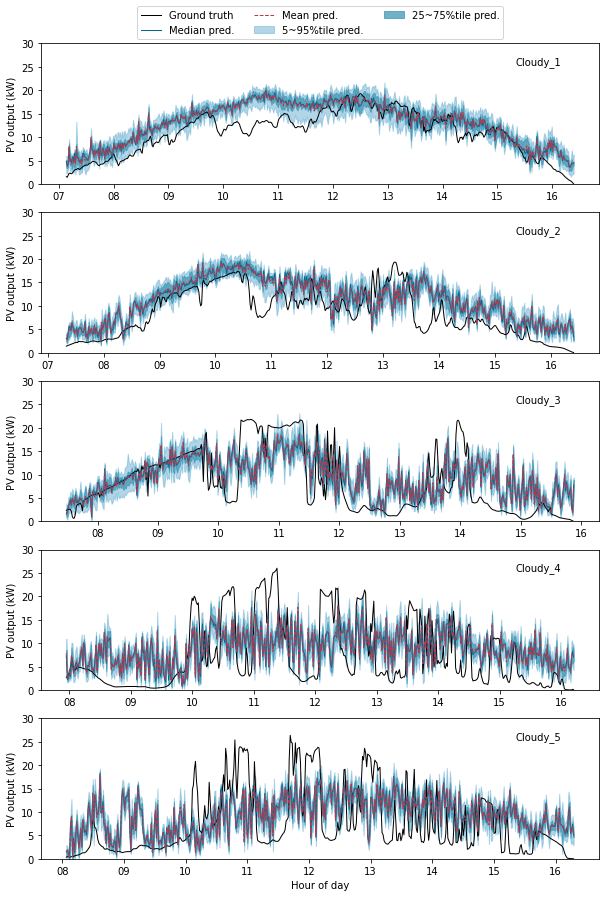

In [77]:
# visualization of forecast prediction_samps
dates_test = np.array([dtinfo.date() for dtinfo in times_test])
hours_test = np.array([dtinfo.time() for dtinfo in times_test])

f,axarr = plt.subplots(5,1,sharex=False, sharey = True)
xfmt = mdates.DateFormatter('%H')
fmt_date = datetime.date(2000,1,1)

green = '#8AB8A7'
red = '#B83A4B'
light_blue = '#67AFD2'
dark_blue = '#016895'
blue = '#4298B5'
grey =  '#B6B1A9'

for i,date in enumerate(cloudy_dates_test):
    ax = axarr[i]
    date_mask = (dates_test == date)
    hours_xaxis= [datetime.datetime.combine(fmt_date, hour) for hour in hours_test[date_mask]] 
    
    #rmse = np.sqrt(np.mean(np.square((pv_log_test[date_mask]-prediction_samp[date_mask]))))
    #mae = np.mean(np.abs((pv_log_test[date_mask]-prediction_samp[date_mask])))
    #per_rmse = np.sqrt(np.mean(np.square((pv_log_test[date_mask]-per_prediction_samp[date_mask]))))
    #fs = (1 - rmse/per_rmse)*100
    
    ax.plot(hours_xaxis, pv_log_test[date_mask], linewidth = 1,color='k', label = 'Ground truth')
    #ax.fill_between(hours_xaxis, 0, pv_log_test[date_mask], color=grey, alpha=.2, label = 'Ground truth')
    ax.fill_between(hours_xaxis, percent5_prediction_samp[date_mask], percent95_prediction_samp[date_mask], color=light_blue, alpha=0.5, label = '5~95%tile pred.')
    ax.fill_between(hours_xaxis, percent25_prediction_samp[date_mask], percent75_prediction_samp[date_mask], color=blue, alpha=0.75, label = '25~75%tile pred.')
    ax.plot(hours_xaxis, percent50_prediction_samp[date_mask],linewidth = 1,label = 'Median pred.',color=dark_blue,alpha=1, markerfacecolor="None")
    ax.plot(hours_xaxis, mean_prediction_samp[date_mask],'--',linewidth = 1, label = 'Mean pred.',color=red,alpha=1, markerfacecolor="None")
    ax.set_ylabel('PV output (kW)')
    ax.xaxis.set_major_formatter(xfmt)
    ax.text(0.85,0.85,'Cloudy_'+str(i+1), transform=ax.transAxes)

axarr[0].set_ylim(0, 30)
axarr[0].legend(bbox_to_anchor= [.5,1.3], loc = 'upper center', ncol = 3)
axarr[-1].set_xlabel('Hour of day')

f.set_size_inches(10,15)    
plt.show()

##### Use 5 samplings

In [78]:
prediction = np.load(os.path.join(output_folder,'test_predictions_SkyGPT_generated_imgs_as_input.npy'))
prediction.shape

(10, 50, 2582)

In [79]:
use_samp_no = 5
prediction_samp = prediction[:,:use_samp_no,:]
prediction_samp = prediction_samp.reshape(-1,prediction_samp.shape[-1])
prediction_samp.shape

(50, 2582)

In [80]:
# Deterministic performance
# calculate RMSE based on ensemble mean of 10 submodels and 10 samplings
prediction_samp_ensemble = np.mean(prediction_samp,axis=0)
loss_rmse_5samp = np.sqrt(np.mean((prediction_samp_ensemble-pv_log_test)**2))
print("the test set RMSE is {0:.3f} averaged over 5 samplings for all sub-models".format(loss_rmse_5samp))

the test set RMSE is 4.958 averaged over 5 samplings for all sub-models


In [81]:
## probabilistic eval metrics
# CRPS evaluation
crps = np.zeros(len(times_test))
for i in range(len(times_test)):
    crps[i],_,_ = pscore(prediction_samp[:,i],pv_log_test[i]).compute()
crps_mean = np.mean(crps)
print('The mean crps: {0:.3f}'.format(crps_mean))

The mean crps: 2.859


In [82]:
## probabilistic eval metrics
# Winkler score evaluation
wscore = np.zeros(len(times_test))
for i in range(len(times_test)):
    wscore[i] = compute_winkler_score(prediction_samp[:,i],pv_log_test[i])
wscore_mean = np.mean(wscore)
print('The mean Winkler score: {0:.3f}'.format(wscore_mean))

The mean Winkler score: 28.595


In [83]:
percent25_prediction_samp = np.percentile(prediction_samp,25,axis=0)
percent75_prediction_samp = np.percentile(prediction_samp,75,axis=0)
percent5_prediction_samp = np.percentile(prediction_samp,5,axis=0)
percent95_prediction_samp = np.percentile(prediction_samp,95,axis=0)
percent50_prediction_samp = np.percentile(prediction_samp,50,axis=0)
mean_prediction_samp = np.mean(prediction_samp,axis=0)

In [84]:
percent5_prediction_samp.shape

(2582,)

In [85]:
# formulate sunny and cloudy test days
sunny_dates = []
cloudy_dates = [(2019, 11, 12),(2019, 11, 13),(2019, 11, 29),(2019, 12, 8),(2019, 12, 23)]
sunny_dates_test = [datetime.date(day[0],day[1],day[2]) for day in sunny_dates]
cloudy_dates_test = [datetime.date(day[0],day[1],day[2]) for day in cloudy_dates]

dates_test = np.asarray([times.date() for times in times_test])

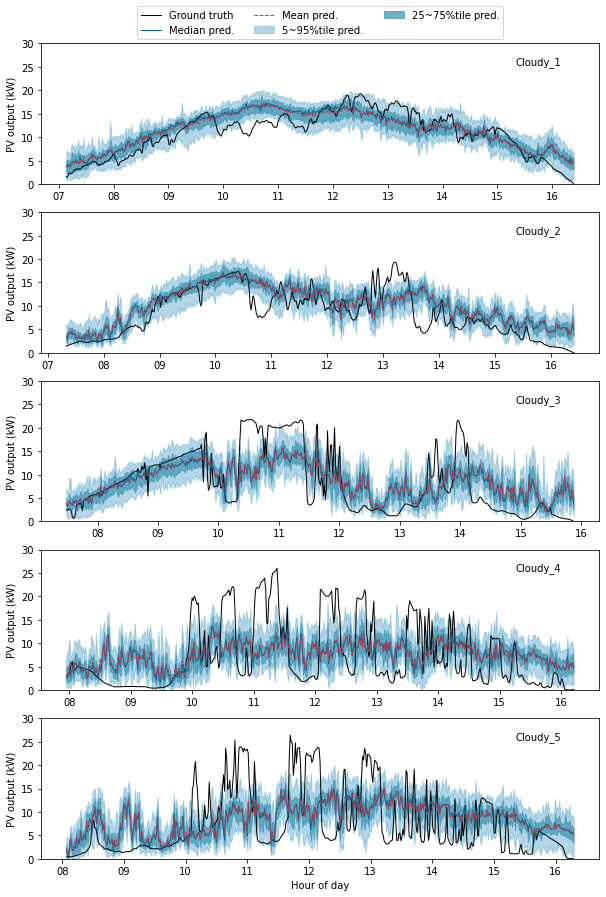

In [86]:
# visualization of forecast prediction_samps
dates_test = np.array([dtinfo.date() for dtinfo in times_test])
hours_test = np.array([dtinfo.time() for dtinfo in times_test])

f,axarr = plt.subplots(5,1,sharex=False, sharey = True)
xfmt = mdates.DateFormatter('%H')
fmt_date = datetime.date(2000,1,1)

green = '#8AB8A7'
red = '#B83A4B'
light_blue = '#67AFD2'
dark_blue = '#016895'
blue = '#4298B5'
grey =  '#B6B1A9'

for i,date in enumerate(cloudy_dates_test):
    ax = axarr[i]
    date_mask = (dates_test == date)
    hours_xaxis= [datetime.datetime.combine(fmt_date, hour) for hour in hours_test[date_mask]] 
    
    ax.plot(hours_xaxis, pv_log_test[date_mask], linewidth = 1,color='k', label = 'Ground truth')
    #ax.fill_between(hours_xaxis, 0, pv_log_test[date_mask], color=grey, alpha=.2, label = 'Ground truth')
    ax.fill_between(hours_xaxis, percent5_prediction_samp[date_mask], percent95_prediction_samp[date_mask], color=light_blue, alpha=0.5, label = '5~95%tile pred.')
    ax.fill_between(hours_xaxis, percent25_prediction_samp[date_mask], percent75_prediction_samp[date_mask], color=blue, alpha=0.75, label = '25~75%tile pred.')
    ax.plot(hours_xaxis, percent50_prediction_samp[date_mask],linewidth = 1,label = 'Median pred.',color=dark_blue,alpha=1, markerfacecolor="None")
    ax.plot(hours_xaxis, mean_prediction_samp[date_mask],'--',linewidth = 1, label = 'Mean pred.',color=red,alpha=1, markerfacecolor="None")
    ax.set_ylabel('PV output (kW)')
    ax.xaxis.set_major_formatter(xfmt)
    ax.text(0.85,0.85,'Cloudy_'+str(i+1), transform=ax.transAxes)

axarr[0].set_ylim(0, 30)
axarr[0].legend(bbox_to_anchor= [.5,1.3], loc = 'upper center', ncol = 3)
axarr[-1].set_xlabel('Hour of day')

f.set_size_inches(10,15)    
plt.show()

##### Use 10 samplings

In [87]:
use_samp_no = 10
prediction_samp = prediction[:,:use_samp_no,:]
prediction_samp = prediction_samp.reshape(-1,prediction_samp.shape[-1])
prediction_samp.shape

(100, 2582)

In [88]:
# Deterministic performance
# calculate RMSE based on ensemble mean of 10 submodels and 10 samplings
prediction_samp_ensemble = np.mean(prediction_samp,axis=0)
loss_rmse_10samp = np.sqrt(np.mean((prediction_samp_ensemble-pv_log_test)**2))
print("the test set RMSE is {0:.3f} averaged over 10 samplings for all sub-models".format(loss_rmse_10samp))

the test set RMSE is 4.912 averaged over 10 samplings for all sub-models


In [89]:
## probabilistic eval metrics
# CRPS evaluation
crps = np.zeros(len(times_test))
for i in range(len(times_test)):
    crps[i],_,_ = pscore(prediction_samp[:,i],pv_log_test[i]).compute()
crps_mean = np.mean(crps)
print('The mean crps: {0:.3f}'.format(crps_mean))

The mean crps: 2.814


In [90]:
## probabilistic eval metrics
# Winkler score evaluation
wscore = np.zeros(len(times_test))
for i in range(len(times_test)):
    wscore[i] = compute_winkler_score(prediction_samp[:,i],pv_log_test[i])
wscore_mean = np.mean(wscore)
print('The mean Winkler score: {0:.3f}'.format(wscore_mean))

The mean Winkler score: 26.718


In [91]:
percent25_prediction_samp = np.percentile(prediction_samp,25,axis=0)
percent75_prediction_samp = np.percentile(prediction_samp,75,axis=0)
percent5_prediction_samp = np.percentile(prediction_samp,5,axis=0)
percent95_prediction_samp = np.percentile(prediction_samp,95,axis=0)
percent50_prediction_samp = np.percentile(prediction_samp,50,axis=0)
mean_prediction_samp = np.mean(prediction_samp,axis=0)

In [92]:
percent5_prediction_samp.shape

(2582,)

In [93]:
# formulate sunny and cloudy test days
sunny_dates = []
cloudy_dates = [(2019, 11, 12),(2019, 11, 13),(2019, 11, 29),(2019, 12, 8),(2019, 12, 23)]
sunny_dates_test = [datetime.date(day[0],day[1],day[2]) for day in sunny_dates]
cloudy_dates_test = [datetime.date(day[0],day[1],day[2]) for day in cloudy_dates]

dates_test = np.asarray([times.date() for times in times_test])

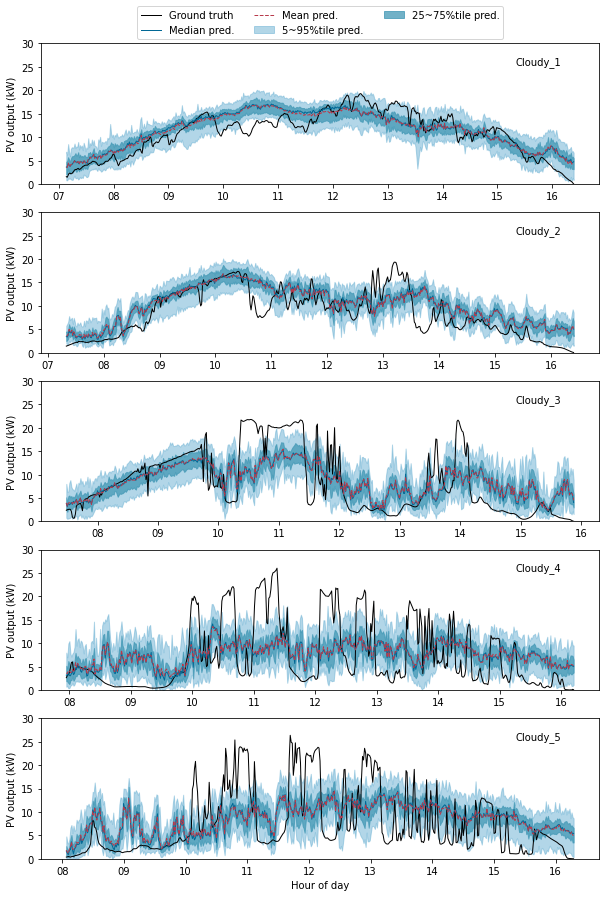

In [94]:
# visualization of forecast prediction_samps
dates_test = np.array([dtinfo.date() for dtinfo in times_test])
hours_test = np.array([dtinfo.time() for dtinfo in times_test])

f,axarr = plt.subplots(5,1,sharex=False, sharey = True)
xfmt = mdates.DateFormatter('%H')
fmt_date = datetime.date(2000,1,1)

green = '#8AB8A7'
red = '#B83A4B'
light_blue = '#67AFD2'
dark_blue = '#016895'
blue = '#4298B5'
grey =  '#B6B1A9'

for i,date in enumerate(cloudy_dates_test):
    ax = axarr[i]
    date_mask = (dates_test == date)
    hours_xaxis= [datetime.datetime.combine(fmt_date, hour) for hour in hours_test[date_mask]] 
    
    ax.plot(hours_xaxis, pv_log_test[date_mask], linewidth = 1,color='k', label = 'Ground truth')
    ax.fill_between(hours_xaxis, percent5_prediction_samp[date_mask], percent95_prediction_samp[date_mask], color=light_blue, alpha=0.5, label = '5~95%tile pred.')
    ax.fill_between(hours_xaxis, percent25_prediction_samp[date_mask], percent75_prediction_samp[date_mask], color=blue, alpha=0.75, label = '25~75%tile pred.')
    ax.plot(hours_xaxis, percent50_prediction_samp[date_mask],linewidth = 1,label = 'Median pred.',color=dark_blue,alpha=1, markerfacecolor="None")
    ax.plot(hours_xaxis, mean_prediction_samp[date_mask],'--',linewidth = 1, label = 'Mean pred.',color=red,alpha=1, markerfacecolor="None")
    ax.set_ylabel('PV output (kW)')
    ax.xaxis.set_major_formatter(xfmt)
    ax.text(0.85,0.85,'Cloudy_'+str(i+1), transform=ax.transAxes)

axarr[0].set_ylim(0, 30)
axarr[0].legend(bbox_to_anchor= [.5,1.3], loc = 'upper center', ncol = 3)
axarr[-1].set_xlabel('Hour of day')

f.set_size_inches(10,15)   
plt.show()

##### Use 20 samplings

In [95]:
use_samp_no = 20
prediction_samp = prediction[:,:use_samp_no,:]
prediction_samp = prediction_samp.reshape(-1,prediction_samp.shape[-1])
prediction_samp.shape

(200, 2582)

In [96]:
# Deterministic performance
# calculate RMSE based on ensemble mean of 10 submodels and 10 samplings
prediction_samp_ensemble = np.mean(prediction_samp,axis=0)
loss_rmse_10samp = np.sqrt(np.mean((prediction_samp_ensemble-pv_log_test)**2))
print("the test set RMSE is {0:.3f} averaged over {1} samplings for all sub-models".format(loss_rmse_10samp,use_samp_no))

the test set RMSE is 4.905 averaged over 20 samplings for all sub-models


In [97]:
## probabilistic eval metrics
# CRPS evaluation
crps = np.zeros(len(times_test))
for i in range(len(times_test)):
    crps[i],_,_ = pscore(prediction_samp[:,i],pv_log_test[i]).compute()
crps_mean = np.mean(crps)
print('The mean crps: {0:.3f}'.format(crps_mean))

The mean crps: 2.798


In [98]:
## probabilistic eval metrics
# Winkler score evaluation
wscore = np.zeros(len(times_test))
for i in range(len(times_test)):
    wscore[i] = compute_winkler_score(prediction_samp[:,i],pv_log_test[i])
wscore_mean = np.mean(wscore)
print('The mean Winkler score: {0:.3f}'.format(wscore_mean))

The mean Winkler score: 25.832


In [99]:
percent25_prediction_samp = np.percentile(prediction_samp,25,axis=0)
percent75_prediction_samp = np.percentile(prediction_samp,75,axis=0)
percent5_prediction_samp = np.percentile(prediction_samp,5,axis=0)
percent95_prediction_samp = np.percentile(prediction_samp,95,axis=0)
percent50_prediction_samp = np.percentile(prediction_samp,50,axis=0)
mean_prediction_samp = np.mean(prediction_samp,axis=0)

In [100]:
# formulate sunny and cloudy test days
sunny_dates = []
cloudy_dates = [(2019, 11, 12),(2019, 11, 13),(2019, 11, 29),(2019, 12, 8),(2019, 12, 23)]
sunny_dates_test = [datetime.date(day[0],day[1],day[2]) for day in sunny_dates]
cloudy_dates_test = [datetime.date(day[0],day[1],day[2]) for day in cloudy_dates]

dates_test = np.asarray([times.date() for times in times_test])

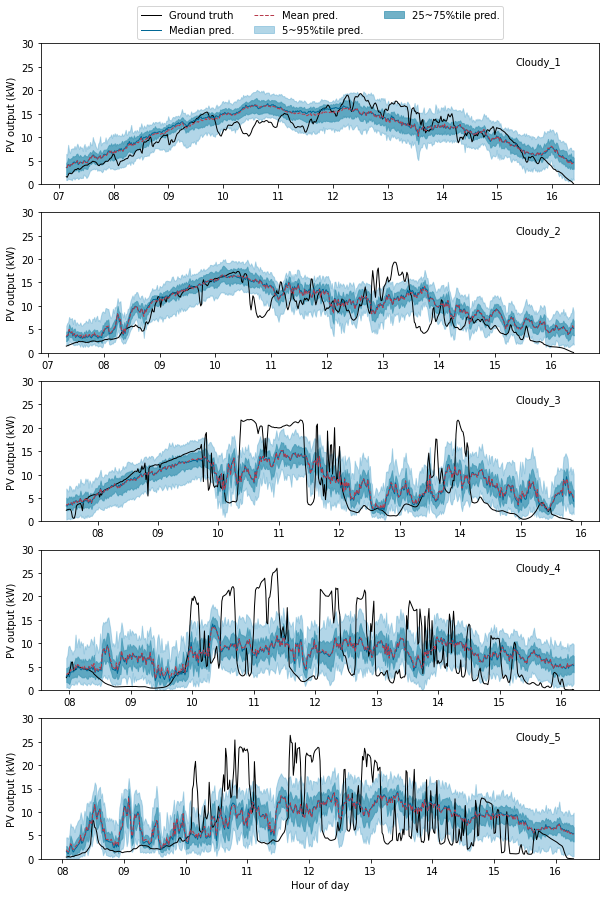

In [101]:
# visualization of forecast prediction_samps
dates_test = np.array([dtinfo.date() for dtinfo in times_test])
hours_test = np.array([dtinfo.time() for dtinfo in times_test])

f,axarr = plt.subplots(5,1,sharex=False, sharey = True)
xfmt = mdates.DateFormatter('%H')
fmt_date = datetime.date(2000,1,1)

green = '#8AB8A7'
red = '#B83A4B'
light_blue = '#67AFD2'
dark_blue = '#016895'
blue = '#4298B5'
grey =  '#B6B1A9'

for i,date in enumerate(cloudy_dates_test):
    ax = axarr[i]
    date_mask = (dates_test == date)
    hours_xaxis= [datetime.datetime.combine(fmt_date, hour) for hour in hours_test[date_mask]] 
    
    #rmse = np.sqrt(np.mean(np.square((pv_log_test[date_mask]-prediction_samp[date_mask]))))
    #mae = np.mean(np.abs((pv_log_test[date_mask]-prediction_samp[date_mask])))
    #per_rmse = np.sqrt(np.mean(np.square((pv_log_test[date_mask]-per_prediction_samp[date_mask]))))
    #fs = (1 - rmse/per_rmse)*100
    
    ax.plot(hours_xaxis, pv_log_test[date_mask], linewidth = 1,color='k', label = 'Ground truth')
    #ax.fill_between(hours_xaxis, 0, pv_log_test[date_mask], color=grey, alpha=.2, label = 'Ground truth')
    ax.fill_between(hours_xaxis, percent5_prediction_samp[date_mask], percent95_prediction_samp[date_mask], color=light_blue, alpha=0.5, label = '5~95%tile pred.')
    ax.fill_between(hours_xaxis, percent25_prediction_samp[date_mask], percent75_prediction_samp[date_mask], color=blue, alpha=0.75, label = '25~75%tile pred.')
    ax.plot(hours_xaxis, percent50_prediction_samp[date_mask],linewidth = 1,label = 'Median pred.',color=dark_blue,alpha=1, markerfacecolor="None")
    ax.plot(hours_xaxis, mean_prediction_samp[date_mask],'--',linewidth = 1, label = 'Mean pred.',color=red,alpha=1, markerfacecolor="None")
    ax.set_ylabel('PV output (kW)')
    ax.xaxis.set_major_formatter(xfmt)
    ax.text(0.85,0.85,'Cloudy_'+str(i+1), transform=ax.transAxes)

axarr[0].set_ylim(0, 30)
axarr[0].legend(bbox_to_anchor= [.5,1.3], loc = 'upper center', ncol = 3)
axarr[-1].set_xlabel('Hour of day')

f.set_size_inches(10,15)    
plt.show()

##### Use 30 samplings

In [102]:
use_samp_no = 30
prediction_samp = prediction[:,:use_samp_no,:]
prediction_samp = prediction_samp.reshape(-1,prediction_samp.shape[-1])
prediction_samp.shape

(300, 2582)

In [103]:
# Deterministic performance
# calculate RMSE based on ensemble mean of 10 submodels and 10 samplings
prediction_samp_ensemble = np.mean(prediction_samp,axis=0)
loss_rmse_10samp = np.sqrt(np.mean((prediction_samp_ensemble-pv_log_test)**2))
print("the test set RMSE is {0:.3f} averaged over {1} samplings for all sub-models".format(loss_rmse_10samp,use_samp_no))

the test set RMSE is 4.895 averaged over 30 samplings for all sub-models


In [104]:
## probabilistic eval metrics
# CRPS evaluation
crps = np.zeros(len(times_test))
for i in range(len(times_test)):
    crps[i],_,_ = pscore(prediction_samp[:,i],pv_log_test[i]).compute()
crps_mean = np.mean(crps)
print('The mean crps: {0:.3f}'.format(crps_mean))

The mean crps: 2.789


In [105]:
## probabilistic eval metrics
# Winkler score evaluation
wscore = np.zeros(len(times_test))
for i in range(len(times_test)):
    wscore[i] = compute_winkler_score(prediction_samp[:,i],pv_log_test[i])
wscore_mean = np.mean(wscore)
print('The mean Winkler score: {0:.3f}'.format(wscore_mean))

The mean Winkler score: 25.552


In [106]:
percent25_prediction_samp = np.percentile(prediction_samp,25,axis=0)
percent75_prediction_samp = np.percentile(prediction_samp,75,axis=0)
percent5_prediction_samp = np.percentile(prediction_samp,5,axis=0)
percent95_prediction_samp = np.percentile(prediction_samp,95,axis=0)
percent50_prediction_samp = np.percentile(prediction_samp,50,axis=0)
mean_prediction_samp = np.mean(prediction_samp,axis=0)

In [107]:
# formulate sunny and cloudy test days
sunny_dates = []
cloudy_dates = [(2019, 11, 12),(2019, 11, 13),(2019, 11, 29),(2019, 12, 8),(2019, 12, 23)]
sunny_dates_test = [datetime.date(day[0],day[1],day[2]) for day in sunny_dates]
cloudy_dates_test = [datetime.date(day[0],day[1],day[2]) for day in cloudy_dates]

dates_test = np.asarray([times.date() for times in times_test])

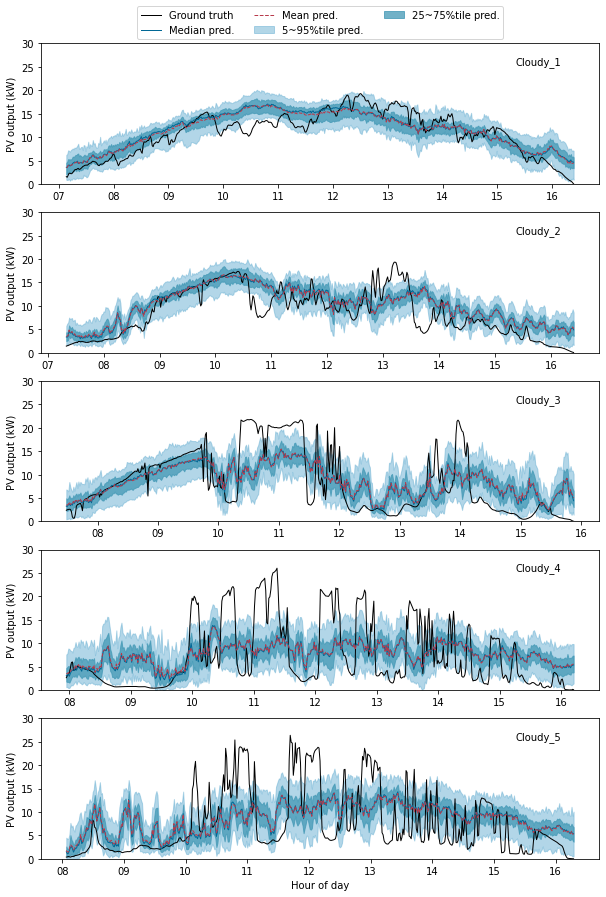

In [108]:
# visualization of forecast prediction_samps
dates_test = np.array([dtinfo.date() for dtinfo in times_test])
hours_test = np.array([dtinfo.time() for dtinfo in times_test])

f,axarr = plt.subplots(5,1,sharex=False, sharey = True)
xfmt = mdates.DateFormatter('%H')
fmt_date = datetime.date(2000,1,1)

green = '#8AB8A7'
red = '#B83A4B'
light_blue = '#67AFD2'
dark_blue = '#016895'
blue = '#4298B5'
grey =  '#B6B1A9'

for i,date in enumerate(cloudy_dates_test):
    ax = axarr[i]
    date_mask = (dates_test == date)
    hours_xaxis= [datetime.datetime.combine(fmt_date, hour) for hour in hours_test[date_mask]] 
    
    ax.plot(hours_xaxis, pv_log_test[date_mask], linewidth = 1,color='k', label = 'Ground truth')
    ax.fill_between(hours_xaxis, percent5_prediction_samp[date_mask], percent95_prediction_samp[date_mask], color=light_blue, alpha=0.5, label = '5~95%tile pred.')
    ax.fill_between(hours_xaxis, percent25_prediction_samp[date_mask], percent75_prediction_samp[date_mask], color=blue, alpha=0.75, label = '25~75%tile pred.')
    ax.plot(hours_xaxis, percent50_prediction_samp[date_mask],linewidth = 1,label = 'Median pred.',color=dark_blue,alpha=1, markerfacecolor="None")
    ax.plot(hours_xaxis, mean_prediction_samp[date_mask],'--',linewidth = 1, label = 'Mean pred.',color=red,alpha=1, markerfacecolor="None")
    ax.set_ylabel('PV output (kW)')
    ax.xaxis.set_major_formatter(xfmt)
    ax.text(0.85,0.85,'Cloudy_'+str(i+1), transform=ax.transAxes)

axarr[0].set_ylim(0, 30)
axarr[0].legend(bbox_to_anchor= [.5,1.3], loc = 'upper center', ncol = 3)
axarr[-1].set_xlabel('Hour of day')

f.set_size_inches(10,15)    
plt.show()

##### Use 40 samplings

In [109]:
use_samp_no = 40
prediction_samp = prediction[:,:use_samp_no,:]
prediction_samp = prediction_samp.reshape(-1,prediction_samp.shape[-1])
prediction_samp.shape

(400, 2582)

In [110]:
# Deterministic performance
# calculate RMSE based on ensemble mean of 10 submodels and 10 samplings
prediction_samp_ensemble = np.mean(prediction_samp,axis=0)
loss_rmse_10samp = np.sqrt(np.mean((prediction_samp_ensemble-pv_log_test)**2))
print("the test set RMSE is {0:.3f} averaged over {1} samplings for all sub-models".format(loss_rmse_10samp,use_samp_no))

the test set RMSE is 4.892 averaged over 40 samplings for all sub-models


In [111]:
## probabilistic eval metrics
# CRPS evaluation
crps = np.zeros(len(times_test))
for i in range(len(times_test)):
    crps[i],_,_ = pscore(prediction_samp[:,i],pv_log_test[i]).compute()
crps_mean = np.mean(crps)
print('The mean crps: {0:.3f}'.format(crps_mean))

The mean crps: 2.785


In [112]:
## probabilistic eval metrics
# Winkler score evaluation
wscore = np.zeros(len(times_test))
for i in range(len(times_test)):
    wscore[i] = compute_winkler_score(prediction_samp[:,i],pv_log_test[i])
wscore_mean = np.mean(wscore)
print('The mean Winkler score: {0:.3f}'.format(wscore_mean))

The mean Winkler score: 25.457


In [113]:
percent25_prediction_samp = np.percentile(prediction_samp,25,axis=0)
percent75_prediction_samp = np.percentile(prediction_samp,75,axis=0)
percent5_prediction_samp = np.percentile(prediction_samp,5,axis=0)
percent95_prediction_samp = np.percentile(prediction_samp,95,axis=0)
percent50_prediction_samp = np.percentile(prediction_samp,50,axis=0)
mean_prediction_samp = np.mean(prediction_samp,axis=0)

In [114]:
# formulate sunny and cloudy test days
sunny_dates = []
cloudy_dates = [(2019, 11, 12),(2019, 11, 13),(2019, 11, 29),(2019, 12, 8),(2019, 12, 23)]
sunny_dates_test = [datetime.date(day[0],day[1],day[2]) for day in sunny_dates]
cloudy_dates_test = [datetime.date(day[0],day[1],day[2]) for day in cloudy_dates]

dates_test = np.asarray([times.date() for times in times_test])

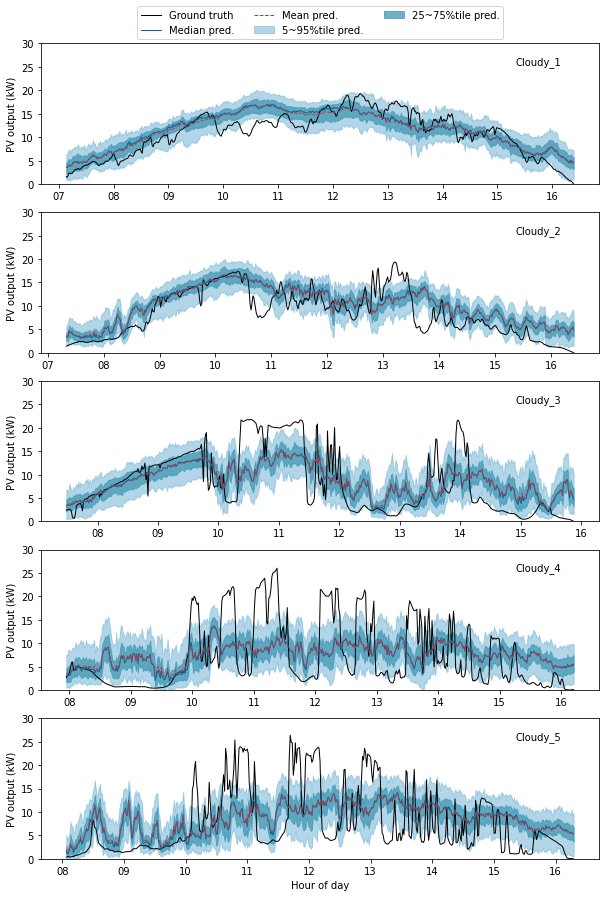

In [115]:
# visualization of forecast prediction_samps
dates_test = np.array([dtinfo.date() for dtinfo in times_test])
hours_test = np.array([dtinfo.time() for dtinfo in times_test])

f,axarr = plt.subplots(5,1,sharex=False, sharey = True)
xfmt = mdates.DateFormatter('%H')
fmt_date = datetime.date(2000,1,1)

green = '#8AB8A7'
red = '#B83A4B'
light_blue = '#67AFD2'
dark_blue = '#016895'
blue = '#4298B5'
grey =  '#B6B1A9'

for i,date in enumerate(cloudy_dates_test):
    ax = axarr[i]
    date_mask = (dates_test == date)
    hours_xaxis= [datetime.datetime.combine(fmt_date, hour) for hour in hours_test[date_mask]] 
    
    ax.plot(hours_xaxis, pv_log_test[date_mask], linewidth = 1,color='k', label = 'Ground truth')
    ax.fill_between(hours_xaxis, percent5_prediction_samp[date_mask], percent95_prediction_samp[date_mask], color=light_blue, alpha=0.5, label = '5~95%tile pred.')
    ax.fill_between(hours_xaxis, percent25_prediction_samp[date_mask], percent75_prediction_samp[date_mask], color=blue, alpha=0.75, label = '25~75%tile pred.')
    ax.plot(hours_xaxis, percent50_prediction_samp[date_mask],linewidth = 1,label = 'Median pred.',color=dark_blue,alpha=1, markerfacecolor="None")
    ax.plot(hours_xaxis, mean_prediction_samp[date_mask],'--',linewidth = 1, label = 'Mean pred.',color=red,alpha=1, markerfacecolor="None")

    ax.set_ylabel('PV output (kW)')
    ax.xaxis.set_major_formatter(xfmt)
    ax.text(0.85,0.85,'Cloudy_'+str(i+1), transform=ax.transAxes)

axarr[0].set_ylim(0, 30)
axarr[0].legend(bbox_to_anchor= [.5,1.3], loc = 'upper center', ncol = 3)
axarr[-1].set_xlabel('Hour of day')

f.set_size_inches(10,15)    
plt.show()

##### Use 50 samplings

In [116]:
use_samp_no = 50
prediction_samp = prediction[:,:use_samp_no,:]
prediction_samp = prediction_samp.reshape(-1,prediction_samp.shape[-1])
prediction_samp.shape

(500, 2582)

In [117]:
# Deterministic performance
# calculate RMSE based on ensemble mean of 10 submodels and 10 samplings
prediction_samp_ensemble = np.mean(prediction_samp,axis=0)
loss_rmse_10samp = np.sqrt(np.mean((prediction_samp_ensemble-pv_log_test)**2))
print("the test set RMSE is {0:.3f} averaged over {1} samplings for all sub-models".format(loss_rmse_10samp,use_samp_no))

the test set RMSE is 4.892 averaged over 50 samplings for all sub-models


In [118]:
## probabilistic eval metrics
# CRPS evaluation
crps = np.zeros(len(times_test))
for i in range(len(times_test)):
    crps[i],_,_ = pscore(prediction_samp[:,i],pv_log_test[i]).compute()
crps_mean = np.mean(crps)
print('The mean crps: {0:.3f}'.format(crps_mean))

The mean crps: 2.783


In [119]:
## probabilistic eval metrics
# Winkler score evaluation
wscore = np.zeros(len(times_test))
for i in range(len(times_test)):
    wscore[i] = compute_winkler_score(prediction_samp[:,i],pv_log_test[i])
wscore_mean = np.mean(wscore)
print('The mean Winkler score: {0:.3f}'.format(wscore_mean))

The mean Winkler score: 25.404


In [120]:
percent25_prediction_samp = np.percentile(prediction_samp,25,axis=0)
percent75_prediction_samp = np.percentile(prediction_samp,75,axis=0)
percent5_prediction_samp = np.percentile(prediction_samp,5,axis=0)
percent95_prediction_samp = np.percentile(prediction_samp,95,axis=0)
percent50_prediction_samp = np.percentile(prediction_samp,50,axis=0)
mean_prediction_samp = np.mean(prediction_samp,axis=0)

In [121]:
# formulate sunny and cloudy test days
sunny_dates = []
cloudy_dates = [(2019, 11, 12),(2019, 11, 13),(2019, 11, 29),(2019, 12, 8),(2019, 12, 23)]
sunny_dates_test = [datetime.date(day[0],day[1],day[2]) for day in sunny_dates]
cloudy_dates_test = [datetime.date(day[0],day[1],day[2]) for day in cloudy_dates]

dates_test = np.asarray([times.date() for times in times_test])

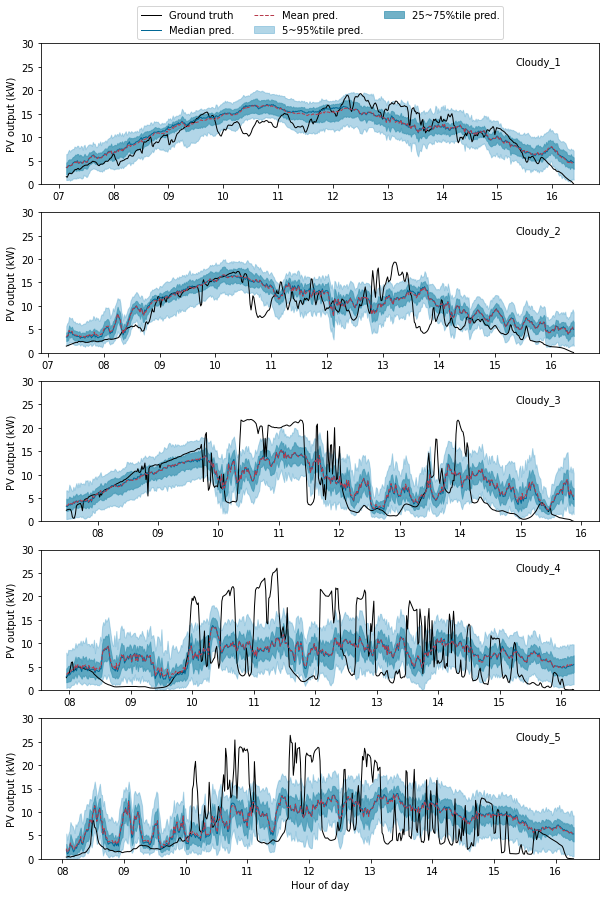

In [122]:
# visualization of forecast prediction_samps
dates_test = np.array([dtinfo.date() for dtinfo in times_test])
hours_test = np.array([dtinfo.time() for dtinfo in times_test])

f,axarr = plt.subplots(5,1,sharex=False, sharey = True)
xfmt = mdates.DateFormatter('%H')
fmt_date = datetime.date(2000,1,1)

green = '#8AB8A7'
red = '#B83A4B'
light_blue = '#67AFD2'
dark_blue = '#016895'
blue = '#4298B5'
grey =  '#B6B1A9'

for i,date in enumerate(cloudy_dates_test):
    ax = axarr[i]
    date_mask = (dates_test == date)
    hours_xaxis= [datetime.datetime.combine(fmt_date, hour) for hour in hours_test[date_mask]] 
    
    ax.plot(hours_xaxis, pv_log_test[date_mask], linewidth = 1,color='k', label = 'Ground truth')
    ax.fill_between(hours_xaxis, percent5_prediction_samp[date_mask], percent95_prediction_samp[date_mask], color=light_blue, alpha=0.5, label = '5~95%tile pred.')
    ax.fill_between(hours_xaxis, percent25_prediction_samp[date_mask], percent75_prediction_samp[date_mask], color=blue, alpha=0.75, label = '25~75%tile pred.')
    ax.plot(hours_xaxis, percent50_prediction_samp[date_mask],linewidth = 1,label = 'Median pred.',color=dark_blue,alpha=1, markerfacecolor="None")
    ax.plot(hours_xaxis, mean_prediction_samp[date_mask],'--',linewidth = 1, label = 'Mean pred.',color=red,alpha=1, markerfacecolor="None")
    ax.set_ylabel('PV output (kW)')
    ax.xaxis.set_major_formatter(xfmt)
    ax.text(0.85,0.85,'Cloudy_'+str(i+1), transform=ax.transAxes)

axarr[0].set_ylim(0, 30)
axarr[0].legend(bbox_to_anchor= [.5,1.3], loc = 'upper center', ncol = 3)
axarr[-1].set_xlabel('Hour of day')

f.set_size_inches(10,15)
plt.show()